In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import LabelEncoder
import seaborn as sns

In [ ]:
data=pd.read_csv('citydata1.csv')
data.head()

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,...,Xylene,AQI,AQI_Bucket,Year,Month,Day,Quarter,Day_Of_Week,State,Zone
0,Ahmedabad,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,...,0.00,NaN,NaN,2015,1,1,1,3,Gujarat,West
1,Ahmedabad,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,...,3.77,NaN,NaN,2015,1,2,1,4,Gujarat,West
2,Ahmedabad,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,...,2.25,NaN,NaN,2015,1,3,1,5,Gujarat,West
3,Ahmedabad,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,...,1.00,NaN,NaN,2015,1,4,1,6,Gujarat,West
4,Ahmedabad,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,...,2.78,NaN,NaN,2015,1,5,1,0,Gujarat,West


In [ ]:
data.shape

(29531, 22)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 22 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   City         29531 non-null  object 
 1   PM2.5        24933 non-null  float64
 2   PM10         18391 non-null  float64
 3   NO           25949 non-null  float64
 4   NO2          25946 non-null  float64
 5   NOx          25346 non-null  float64
 6   NH3          19203 non-null  float64
 7   CO           27472 non-null  float64
 8   SO2          25677 non-null  float64
 9   O3           25509 non-null  float64
 10  Benzene      23908 non-null  float64
 11  Toluene      21490 non-null  float64
 12  Xylene       11422 non-null  float64
 13  AQI          24850 non-null  float64
 14  AQI_Bucket   24850 non-null  object 
 15  Year         29531 non-null  int64  
 16  Month        29531 non-null  int64  
 17  Day          29531 non-null  int64  
 18  Quarter      29531 non-null  int64  
 19  Day_

In [ ]:
data['City'].mask( data['City'] == 'Ernakulam', 'Kochi' , inplace=True )

In [ ]:
data.groupby('City')['PM2.5','PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3','Benzene','Toluene','Xylene','AQI'].describe()

<ipython-input-6-f7f5dcdd67b7>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  data.groupby('City')['PM2.5','PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3','Benzene','Toluene','Xylene','AQI'].describe()


PM2.5                                                 \
                     count        mean        std    min      25%     50%   
City                                                                        
Ahmedabad           1381.0   67.854497  39.491450   3.04  39.4300  58.370   
Aizawl               111.0   17.130000  15.287995   0.16   3.7650  10.480   
Amaravati            892.0   37.773217  27.255732   4.65  17.0600  28.015   
Amritsar            1093.0   55.468335  51.394067   2.85  31.6800  44.090   
Bengaluru           1863.0   35.819828  22.073252   1.72  21.2950  30.920   
Bhopal               280.0   50.059571  30.431590   3.40  23.0725  44.840   
Brajrajnagar         753.0   64.057610  36.167215   2.54  34.2600  60.630   
Chandigarh           289.0   41.130242  28.208979   6.86  19.1700  33.270   
Chennai             1892.0   50.425613  26.703847   6.55  33.2750  45.545   
Coimbatore           378.0   29.151587  11.150033   2.13  20.9075  28.515   
Delhi               2007.0  117.196153  82.912945  10.24  57.0950  94.620   
Gurugram            1525.0  117.104007  99.056336   3.42  57.2400  90.150   
Guwahati             501.0   63.685429  61.631773   5.39  23.4500  46.780   
Hyderabad           1891.0   47.035357  38.522589   4.83  25.7900  42.000   
Jaipur              1102.0   54.500708  26.551826   9.12  36.3000  49.750   
Jorapokhar           379.0   64.228918  32.563684  10.04  43.4600  60.690   
Kochi                320.0   28.227156  17.995781   3.48  15.5400  22.190   
Kolkata              759.0   64.362833  58.381092   3.56  21.2000  43.550   
Lucknow             1907.0  109.714059  79.754590  11.39  47.5450  86.090   
Mumbai               784.0   35.198393  25.913623   3.84  15.2475  23.745   
Patna               1537.0  123.498562  94.170444  10.78  51.7000  91.120   
Shillong             246.0   30.823984  83.643643   2.03  10.3425  17.425   
Talcher              741.0   61.405425  50.131582   0.04  25.0900  44.640   
Thiruvananthapuram  1070.0   28.036617  17.817340   2.00  14.9100  22.380   
Visakhapatnam       1232.0   46.969610  28.057120   2.00  27.0425  40.610   

                                        PM10              ...  Xylene          \
                         75%     max   count        mean  ...     75%     max   
City                                                      ...                   
Ahmedabad            87.1800  381.69   407.0  114.584029  ...  6.9000  109.23   
Aizawl               29.1950   54.90   112.0   23.352857  ...     NaN     NaN   
Amaravati            52.7375  139.38   896.0   76.362020  ...  0.1800  137.45   
Amritsar             63.6700  868.66  1158.0  115.202599  ...  9.8375   53.59   
Bengaluru            44.2500  313.59  1649.0   83.243287  ...     NaN     NaN   
Bhopal               70.1075  136.42   280.0  119.324321  ...     NaN     NaN   
Brajrajnagar         86.2000  308.79   765.0  124.217373  ...     NaN     NaN   
Chandigarh           53.9600  154.85   304.0   85.656546  ...  1.3125  116.62   
Chennai              61.5000  293.43   302.0   62.834404  ...     NaN     NaN   
Coimbatore           36.4950   63.10   379.0   37.982137  ...     NaN     NaN   
Delhi               153.0300  685.36  1932.0  232.809229  ...  1.9700   23.30   
Gurugram            148.8500  949.99   740.0  191.504432  ...  5.7400   26.17   
Guwahati             91.5300  916.67   502.0  116.604900  ...     NaN     NaN   
Hyderabad            61.4150  571.02  1651.0   91.931532  ...  1.8650   28.24   
Jaipur               67.1300  311.35  1100.0  123.483509  ...     NaN     NaN   
Jorapokhar           82.8050  217.13   894.0  149.657942  ...     NaN     NaN   
Kochi                38.6700  143.85   320.0   57.954281  ...  0.1900    1.98   
Kolkata              89.7050  304.74   759.0  115.629499  ...  3.3900   13.54   
Lucknow             153.2300  742.67     0.0         NaN  ...     NaN     NaN   
Mumbai               51.3625  134.32   763.0   96.745059  ...  0.0000    2.51   
P

In [ ]:
data.isna().sum()

City               0
PM2.5           4598
PM10           11140
NO              3582
NO2             3585
NOx             4185
NH3            10328
CO              2059
SO2             3854
O3              4022
Benzene         5623
Toluene         8041
Xylene         18109
AQI             4681
AQI_Bucket      4681
Year               0
Month              0
Day                0
Quarter            0
Day_Of_Week        0
State              0
Zone               0
dtype: int64

# Mode

In [ ]:
data.groupby('City')['PM2.5','PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3','Benzene','Toluene','Xylene','AQI'].apply(lambda x:x.mode().iloc[0]).reset_index()

<ipython-input-8-76dbf11bf348>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  data.groupby('City')['PM2.5','PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3','Benzene','Toluene','Xylene','AQI'].apply(lambda x:x.mode().iloc[0]).reset_index()


,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
0,Ahmedabad,39.42,73.99,16.31,14.82,0.00,NaN,0.67,3.30,23.60,0.00,0.00,0.00,302.0
1,Aizawl,4.49,6.19,2.96,0.13,15.65,11.35,0.24,1.08,1.16,0.03,0.00,NaN,19.0
2,Amaravati,17.79,36.29,1.40,7.85,3.42,10.74,0.64,8.98,19.85,0.00,0.07,0.10,78.0
3,Amritsar,34.55,35.71,17.22,9.19,20.93,13.00,0.00,3.10,16.48,1.30,1.10,2.00,77.0
4,Bengaluru,20.75,42.66,5.74,26.31,0.00,24.05,0.85,5.81,25.30,0.00,0.00,NaN,65.0
5,Bhopal,23.88,43.10,0.96,9.55,4.14,12.66,0.46,11.37,38.72,NaN,NaN,NaN,120.0
6,Brajrajnagar,58.33,30.81,0.02,0.03,0.00,4.56,0.00,12.32,0.01,0.00,NaN,NaN,102.0
7,Chandigarh,12.25,15.78,1.47,11.69,7.66,5.00,0.30,8.71,8.99,3.43,0.16,0.77,72.0
8,Chennai,29.62,25.63,5.66,11.22,13.71,23.82,0.00,6.20,13.35,0.00,0.00,NaN,70.0
9,Coimbatore,14.62,50.00,0.68,8.40,0.00,1.72,0.57,9.78,20.58,0.00,0.00,NaN,78.0


# Univariate analysis

#Histogram
#Boxplot 

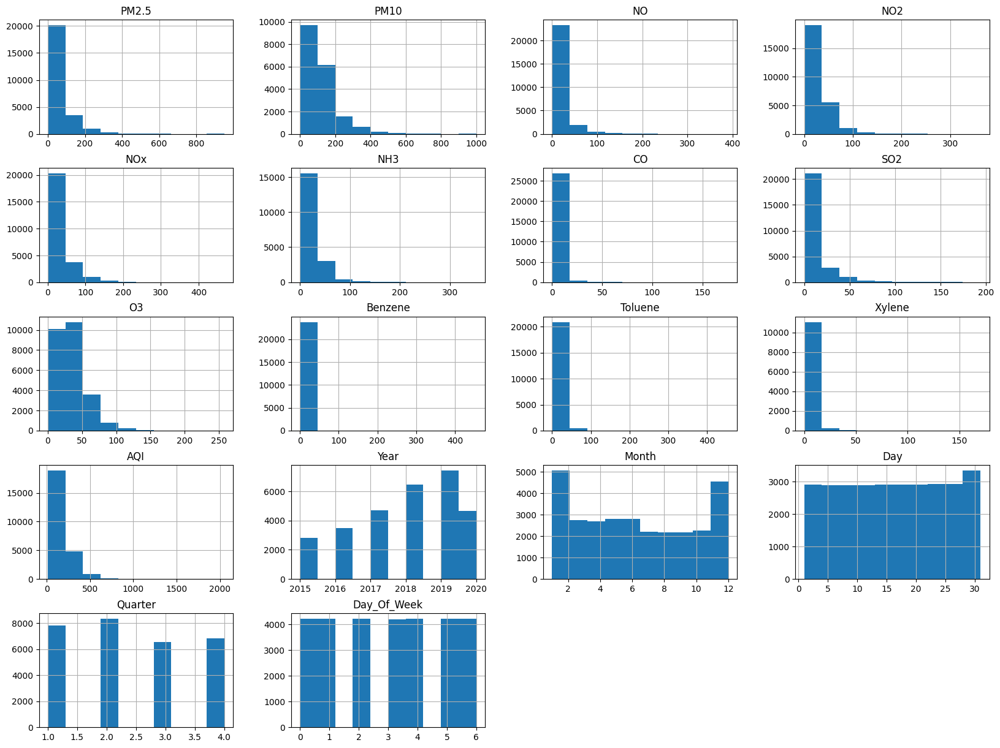

In [ ]:
freqgraph=data.select_dtypes(include=['float','int','object'])
freqgraph.hist(figsize=(20,15))
plt.show()

In [ ]:
# dist plot

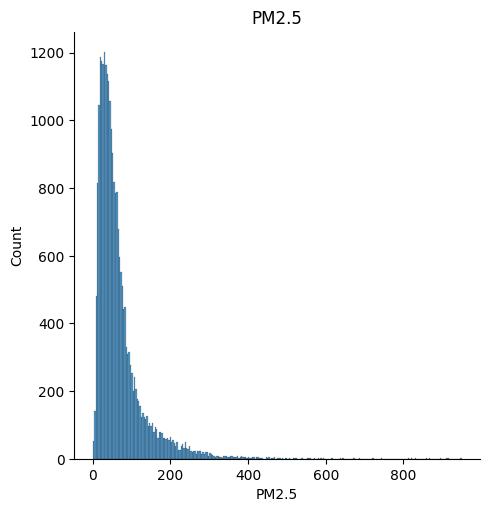

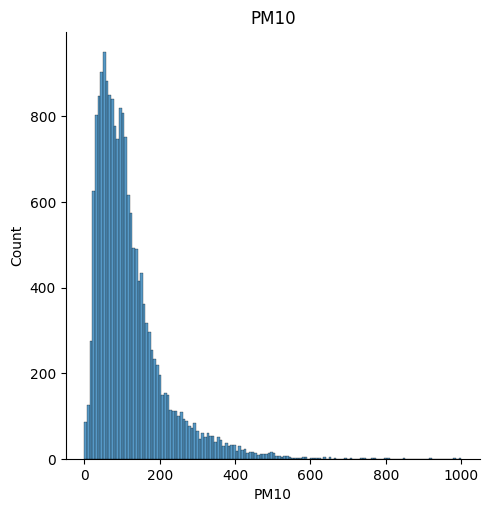

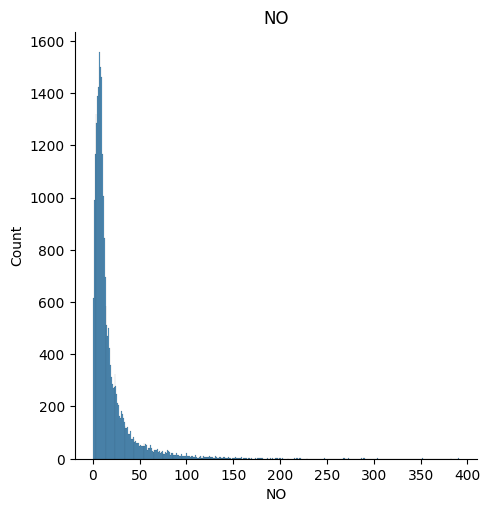

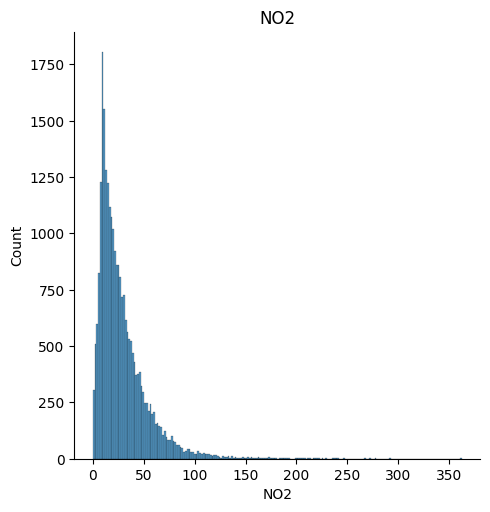

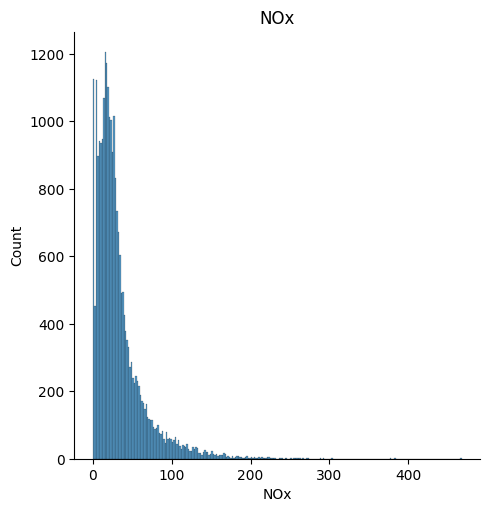

...

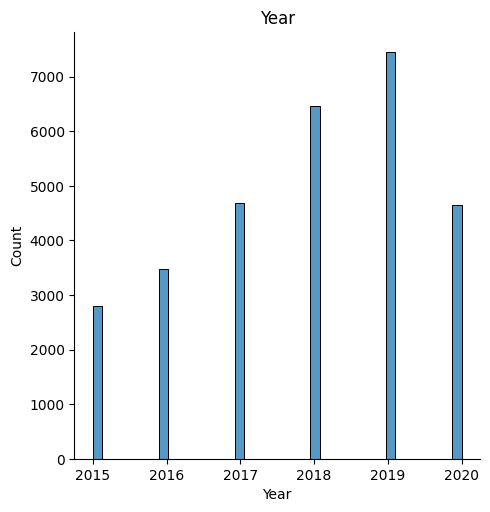

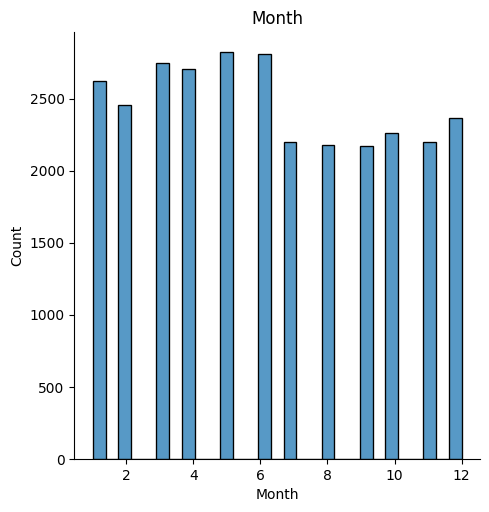

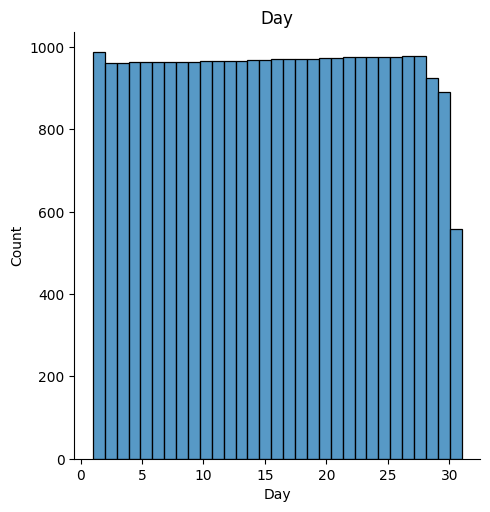

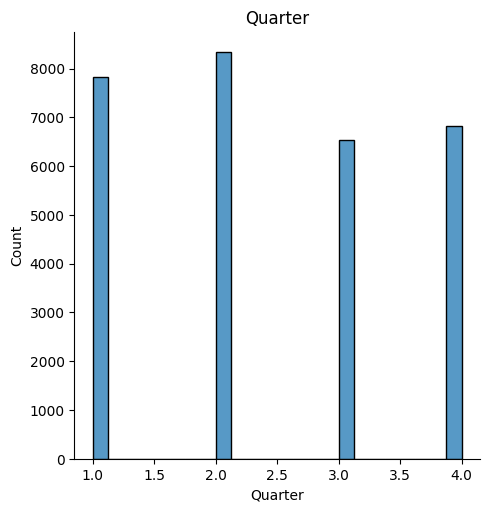

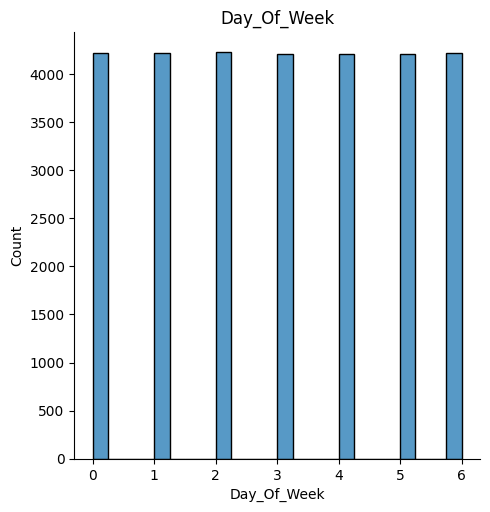

In [ ]:
# select only numeric columns
numeric_cols = data.select_dtypes(include=np.number)

# loop through columns and create dist plots
for col in numeric_cols.columns:
    sns.displot(data[col], kde=False)
    plt.title(col)
    plt.show()

In [ ]:
#Boxplot

PM2.5


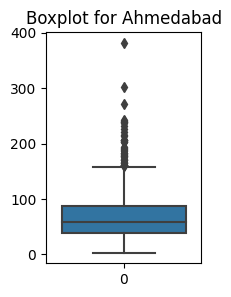

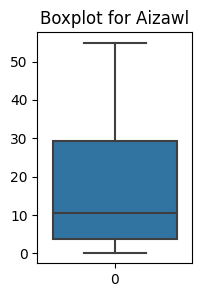

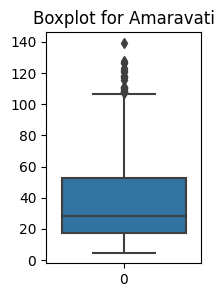

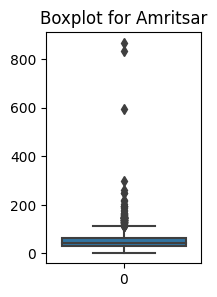

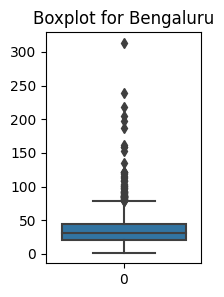

...

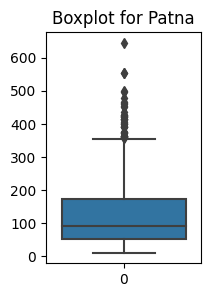

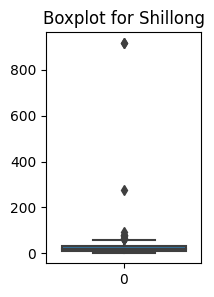

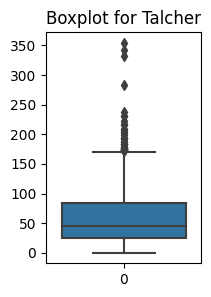

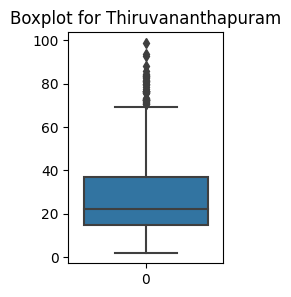

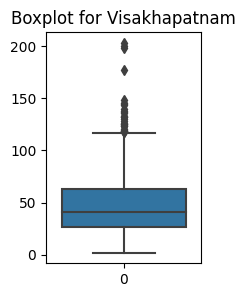

PM10


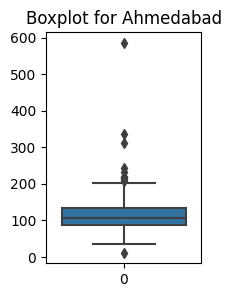

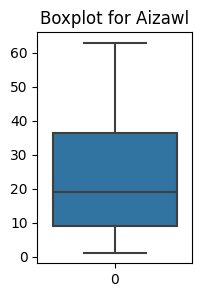

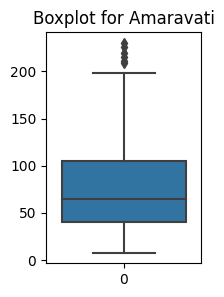

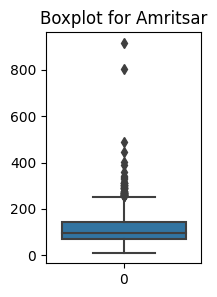

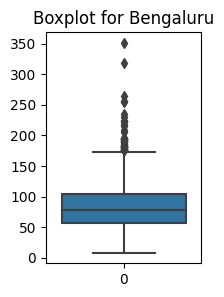

...

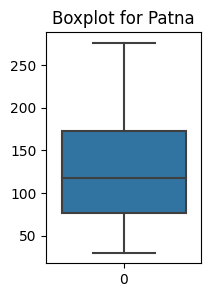

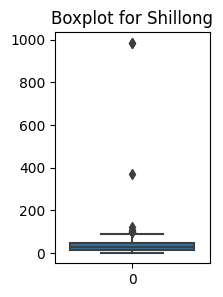

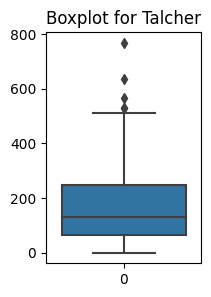

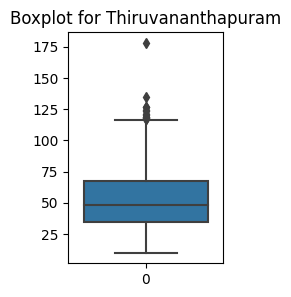

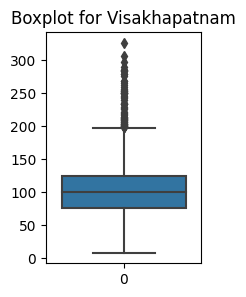

NO


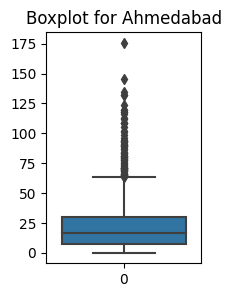

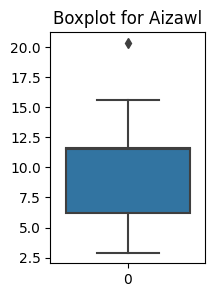

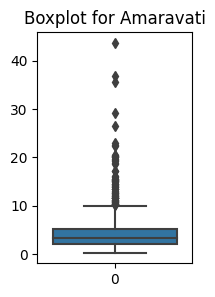

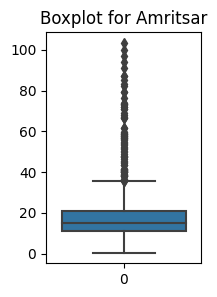

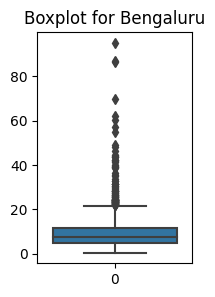

...

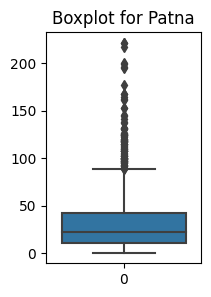

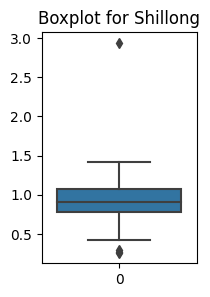

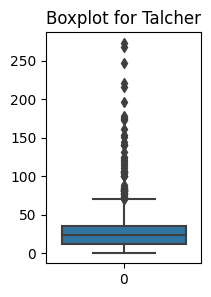

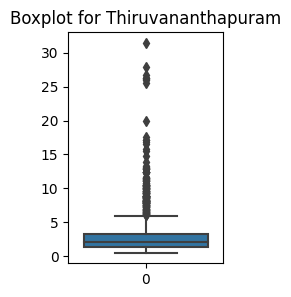

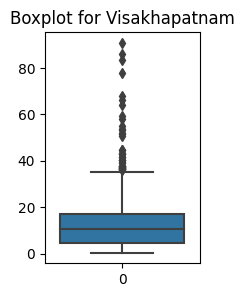

NO2


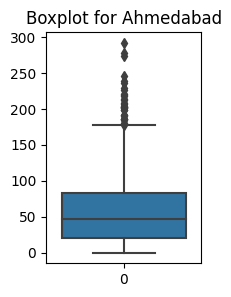

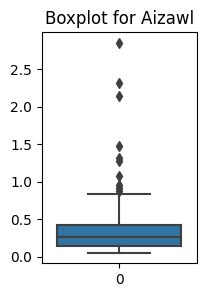

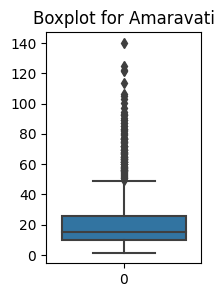

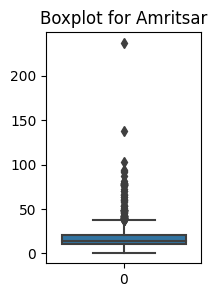

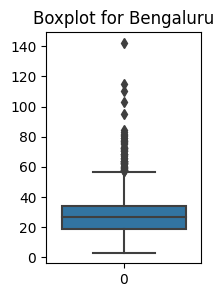

...

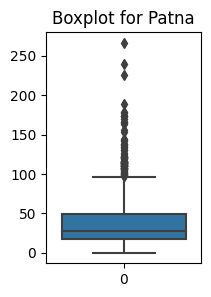

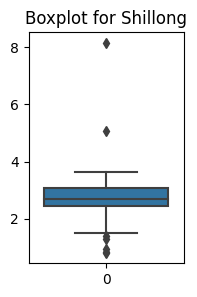

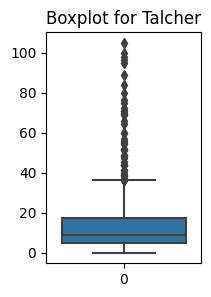

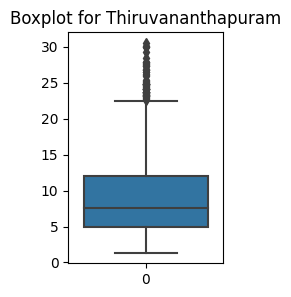

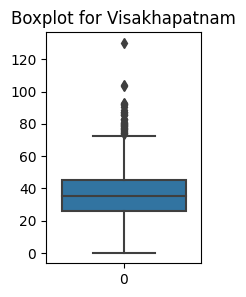

NOx


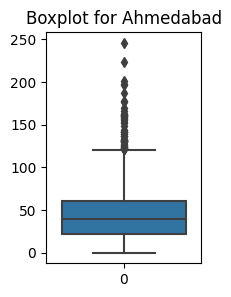

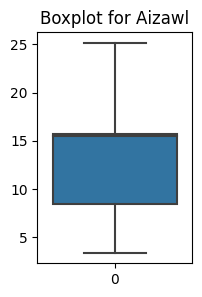

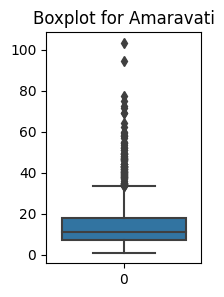

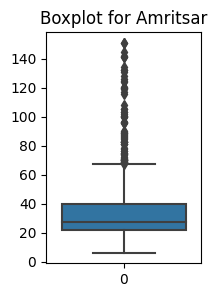

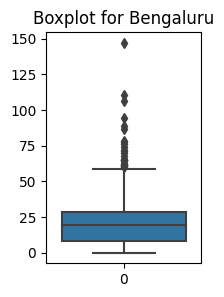

...

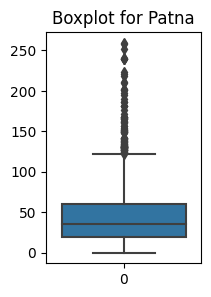

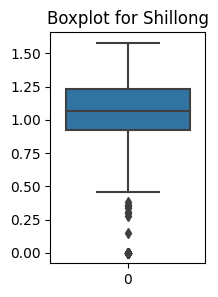

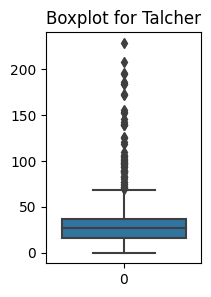

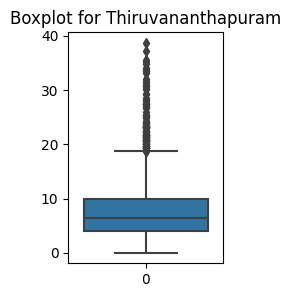

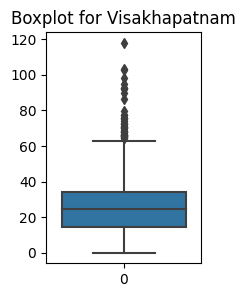

NH3


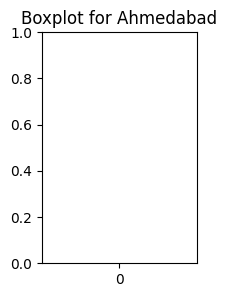

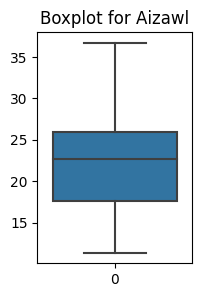

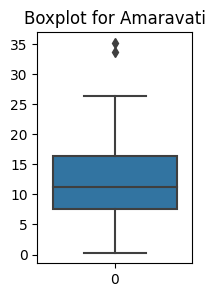

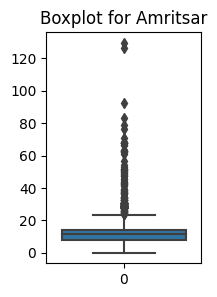

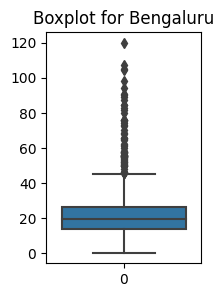

...

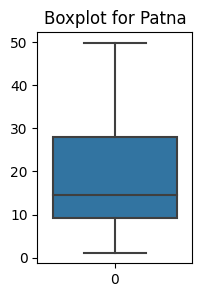

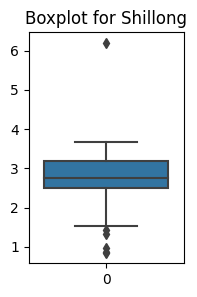

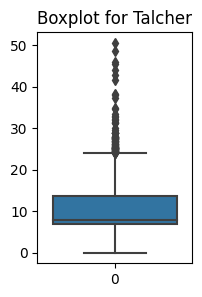

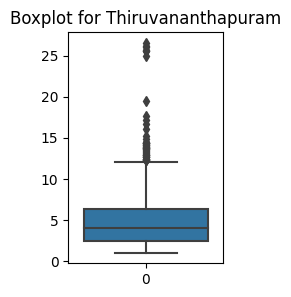

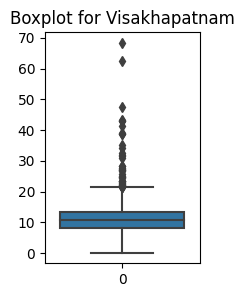

CO


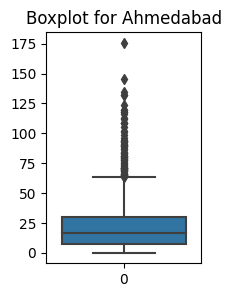

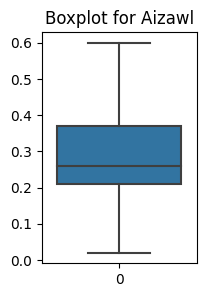

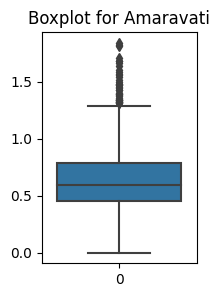

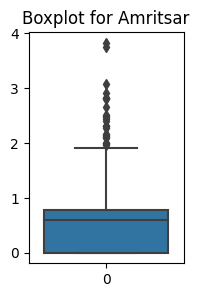

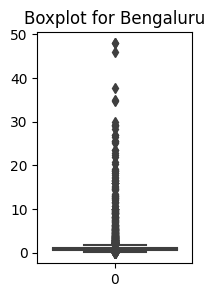

...

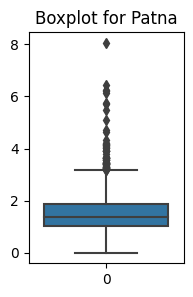

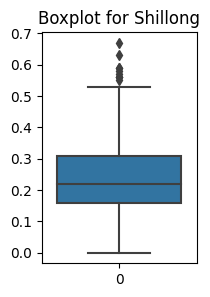

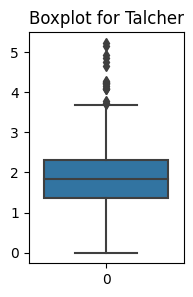

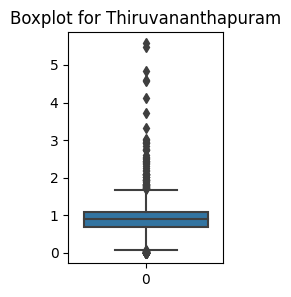

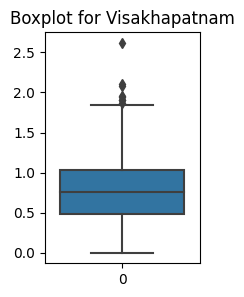

SO2


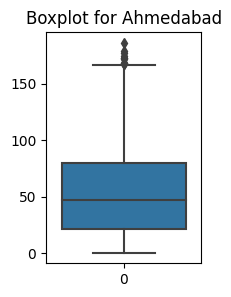

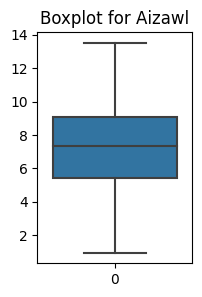

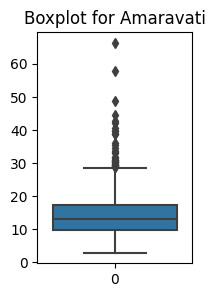

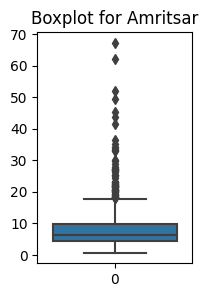

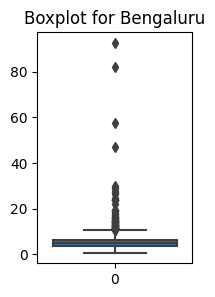

...

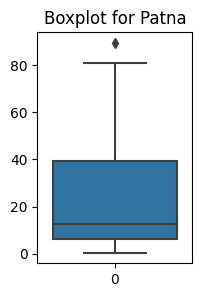

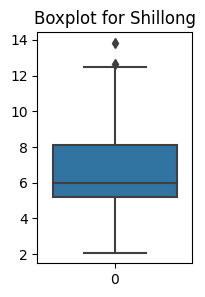

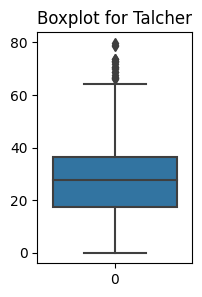

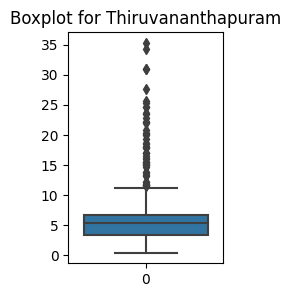

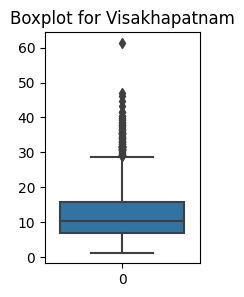

O3


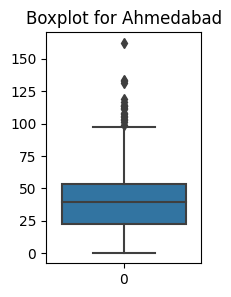

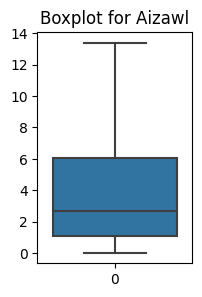

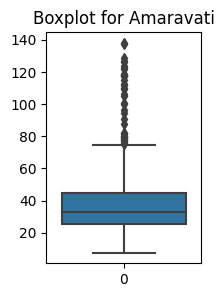

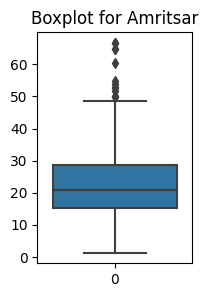

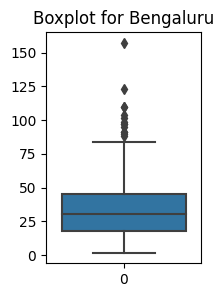

...

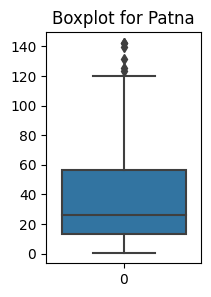

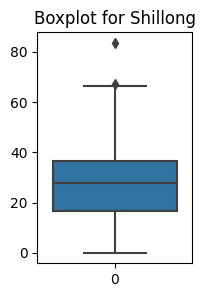

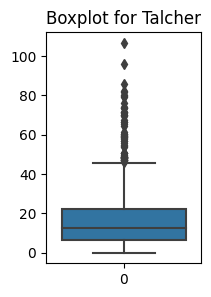

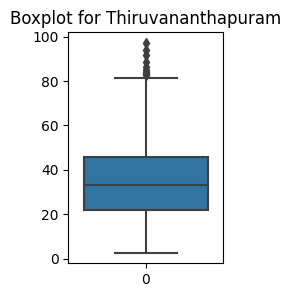

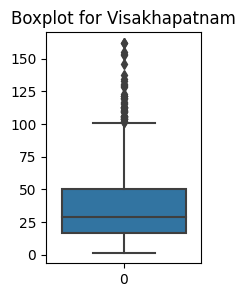

Benzene


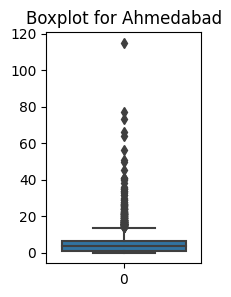

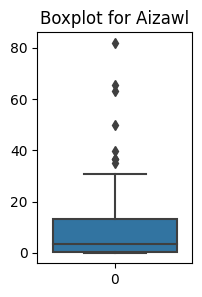

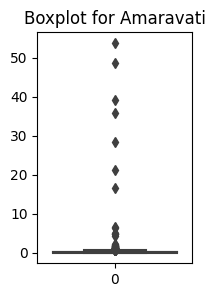

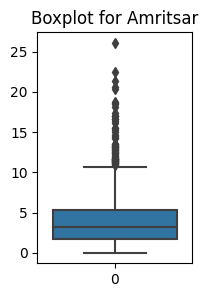

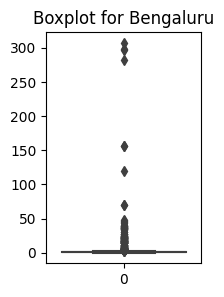

...

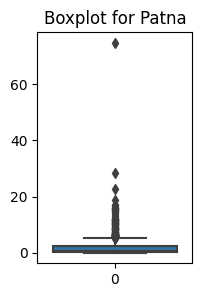

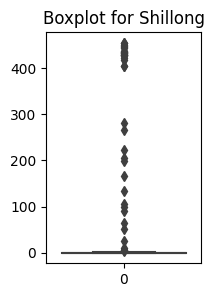

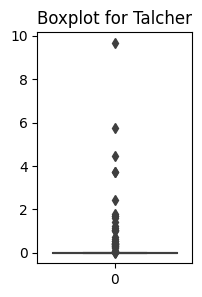

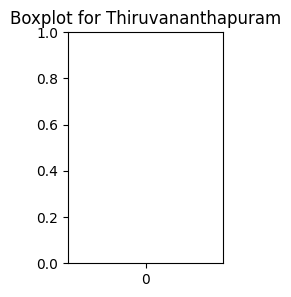

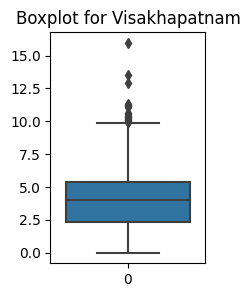

Toluene


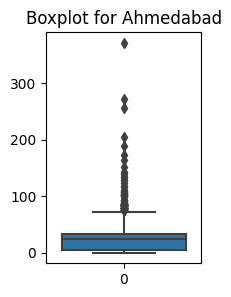

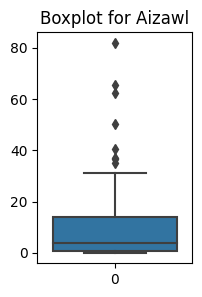

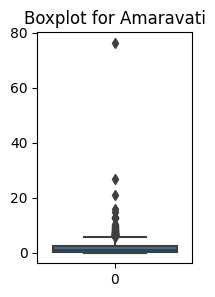

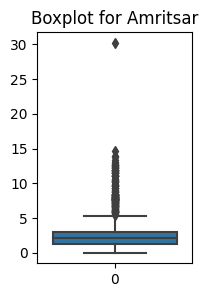

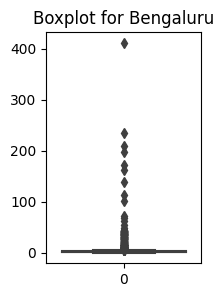

...

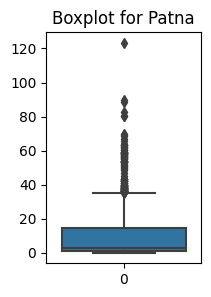

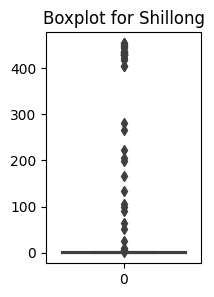

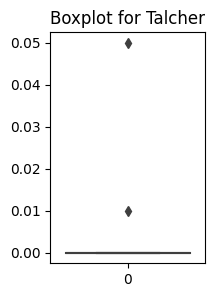

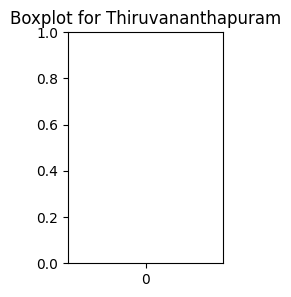

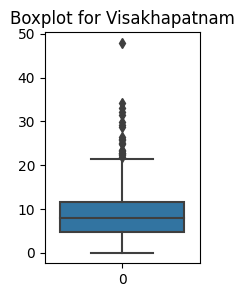

Xylene


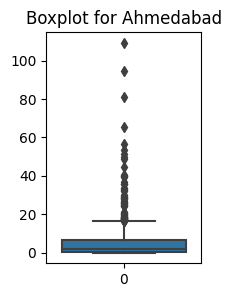

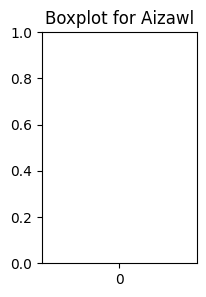

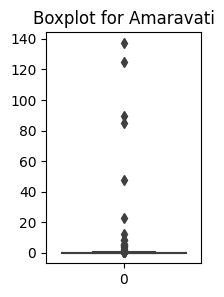

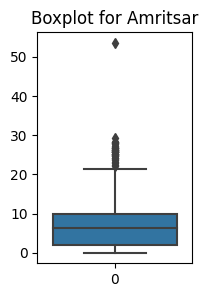

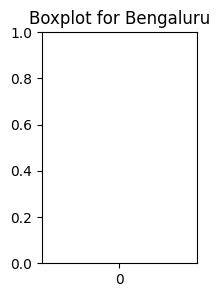

...

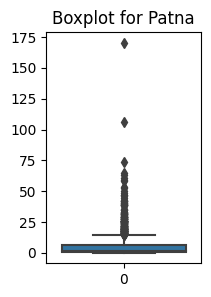

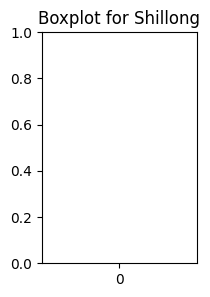

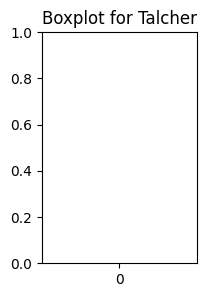

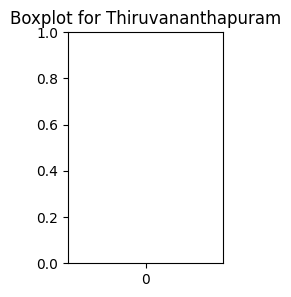

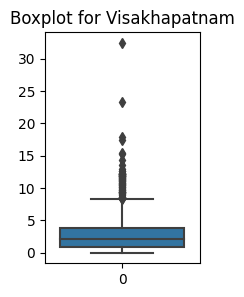

AQI


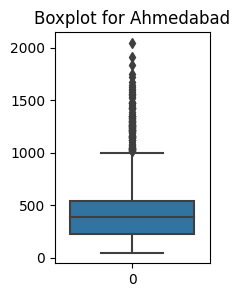

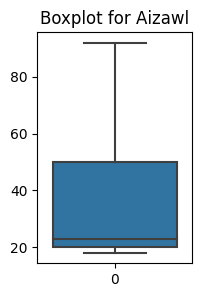

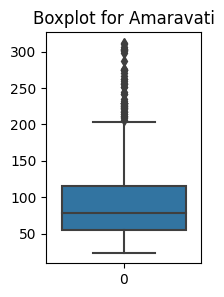

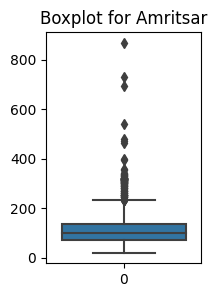

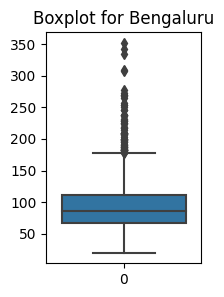

...

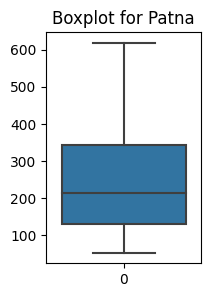

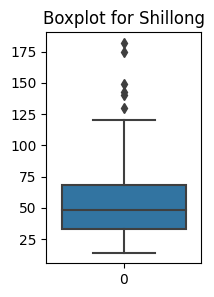

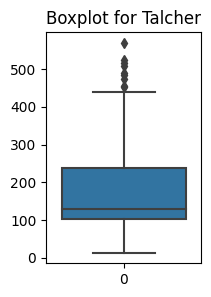

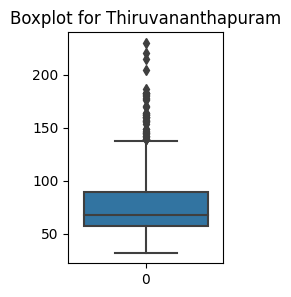

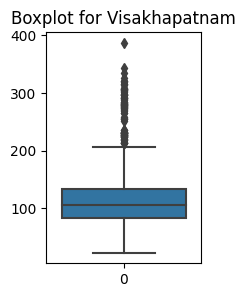

In [ ]:
num_col=['PM2.5','PM10','NO','NO2','NOx','NH3','CO','SO2','O3','Benzene','Toluene','Xylene','AQI']

for j in num_col: 
    grouped_data = data.groupby('City')[j].apply(list).reset_index()
    print(j)
    for i, group in grouped_data.iterrows():
     # create a new figure and axis object
       fig, ax = plt.subplots(figsize=(2,3))
     # plot the histogram for the current group
       sns.boxplot(group[j])
     # set the title of the plot
       ax.set_title(f"Boxplot for {group['City']}")
    # display the plot
       plt.show()
    # close the plot
       plt.close(fig)

   

In [ ]:
#Bivariate analysis

City Vs Pollutant

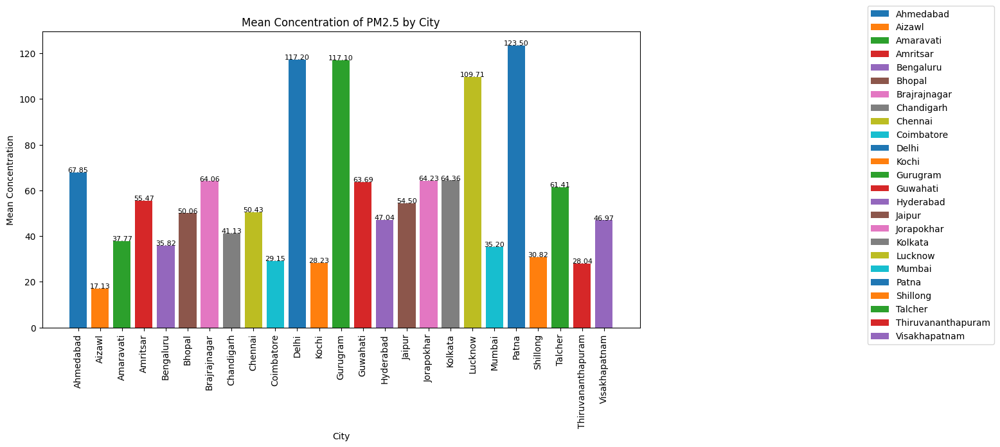

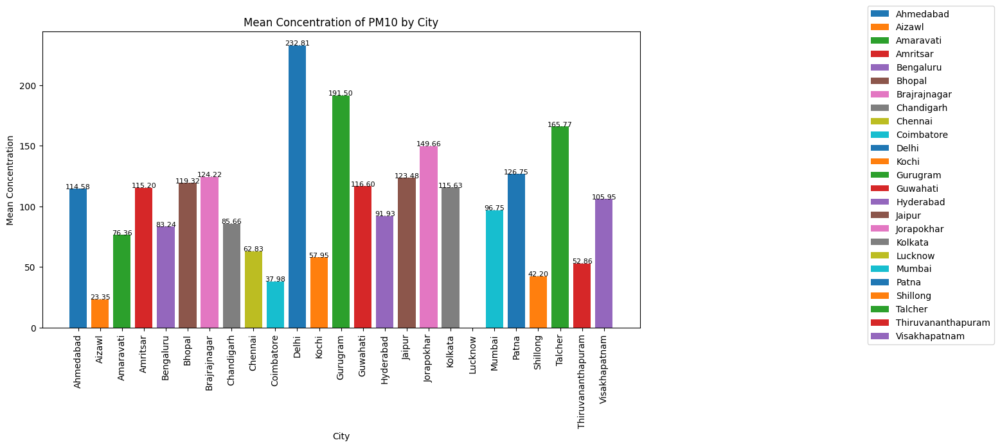

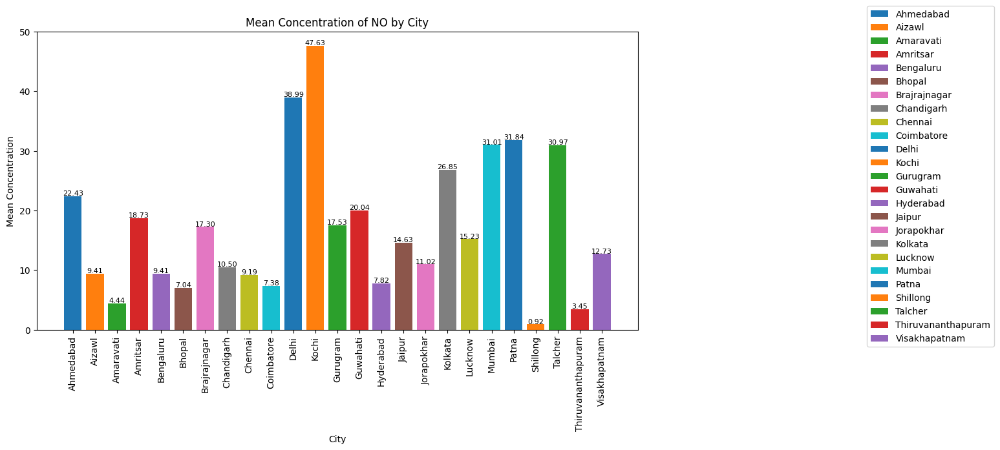

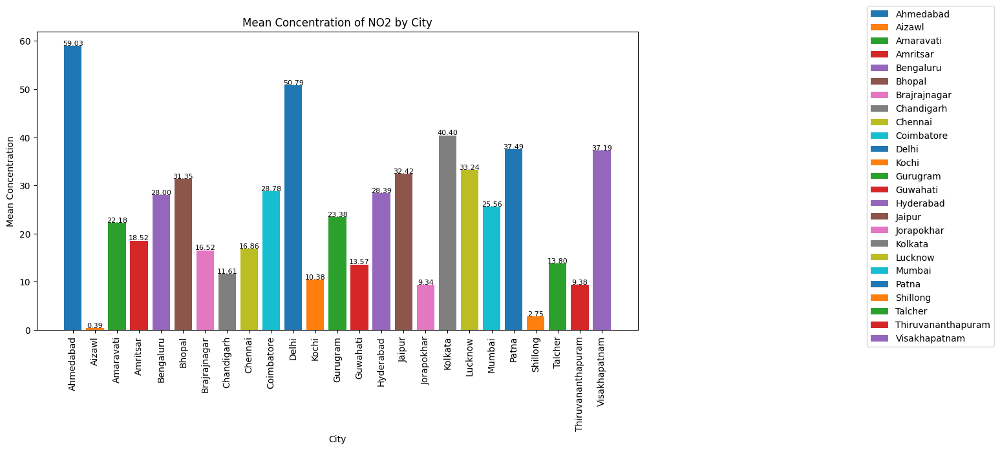

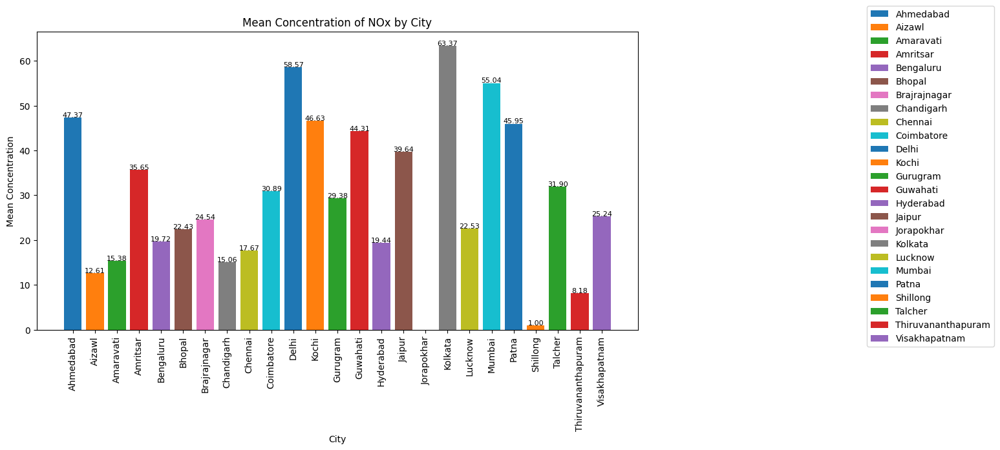

...

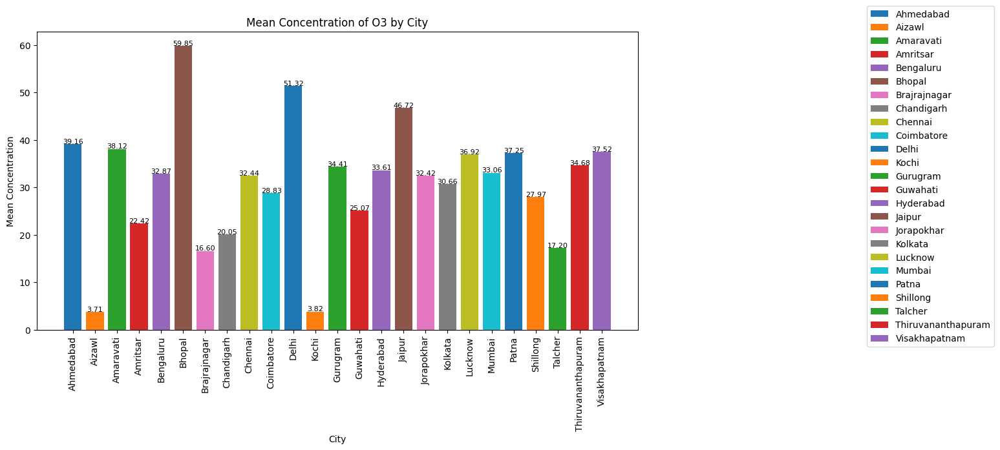

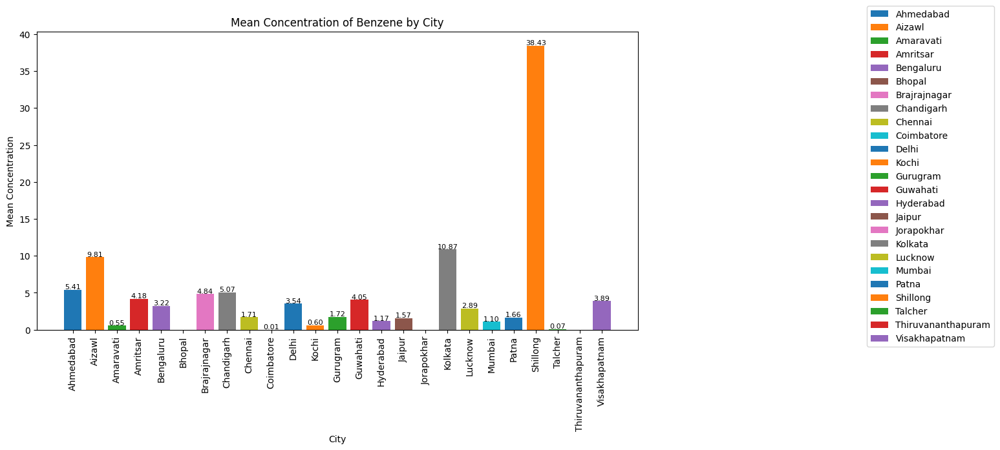

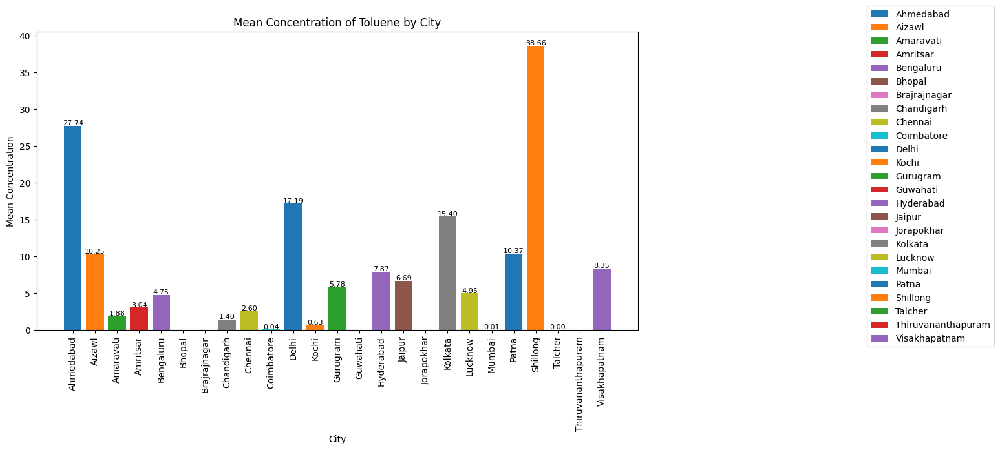

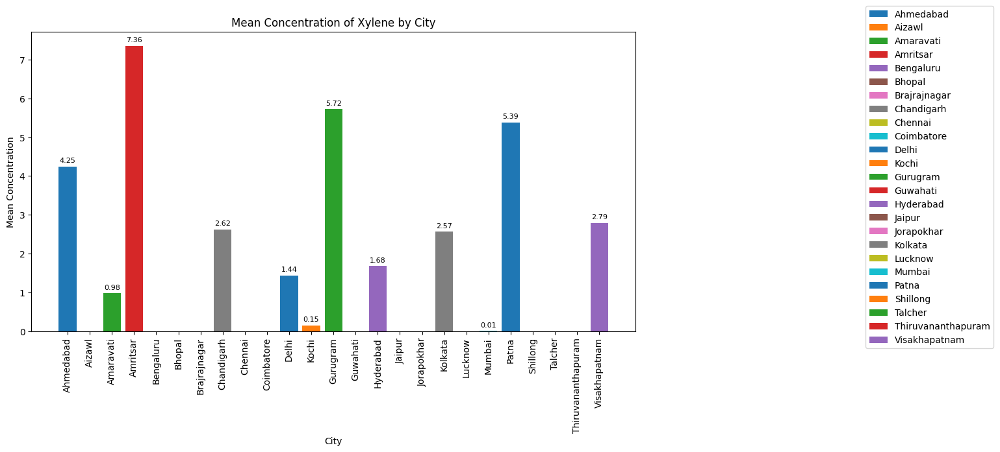

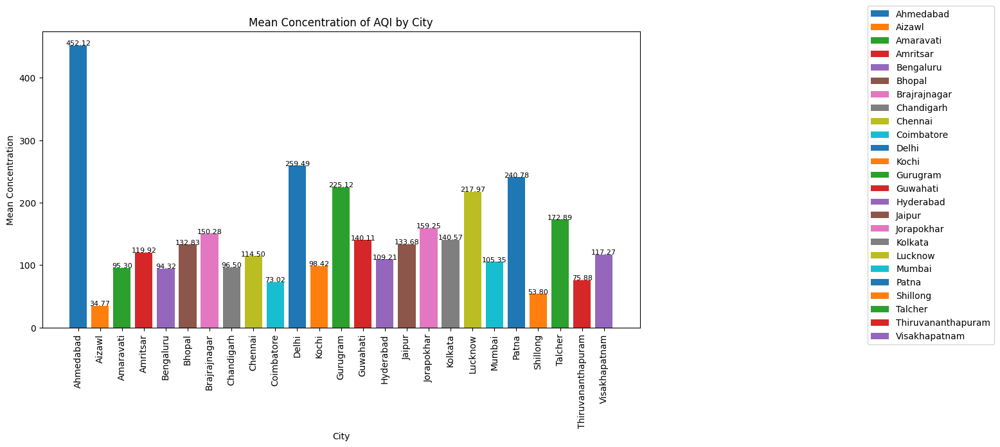

In [ ]:
# extract the pollutants and cities
pollutants = data.columns[1:14]
cities = data['City'].unique()


# loop through each pollutant
for pollutant in pollutants:
    # create a new figure and axis object
    fig, ax = plt.subplots(figsize=(12, 6))
    # loop through each city
    for city in cities:
        # filter the data for the current pollutant and city
        df = data[(data['City'] == city) & (~data[pollutant].isna())]
        # calculate the mean concentration for the pollutant in the city
        mean_concentration = df[pollutant].mean()
        # plot the mean concentration for the current city
        ax.bar(city, mean_concentration,label=city)
        # add text label for mean concentration above each bar
        ax.text(city, mean_concentration+0.1, f"{mean_concentration:.2f}", ha='center',fontsize=8)
    # set the title and axis labels
    ax.set_title(f"Mean Concentration of {pollutant} by City")
    ax.set_xlabel("City")
    ax.set_ylabel("Mean Concentration")
    # add a legend
    ax.legend(bbox_to_anchor=(1.6,1.1))
    # display the plot
    plt.xticks(rotation=90)
    plt.show()
    # close the plot
    plt.close(fig)

Year Vs Pollutant

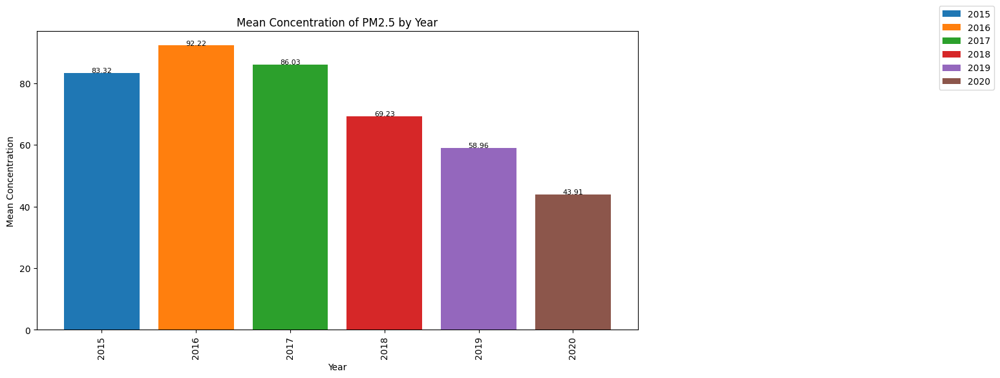

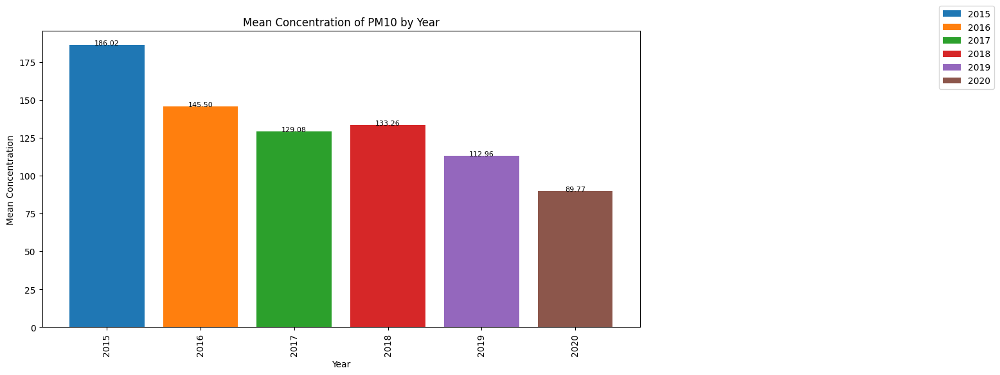

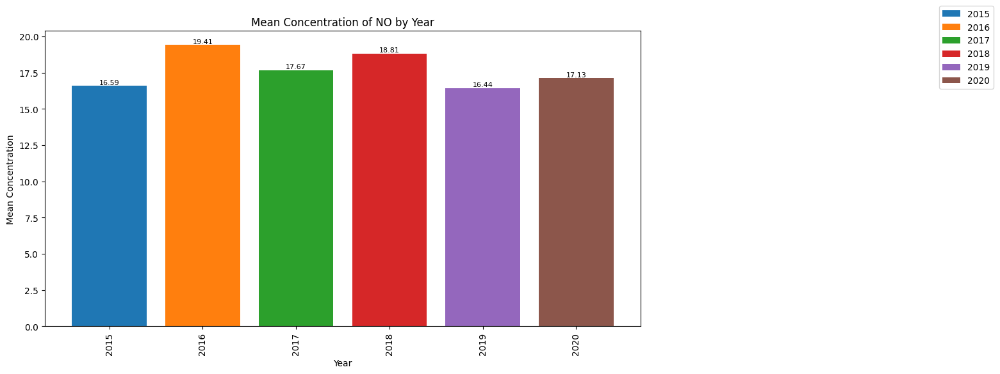

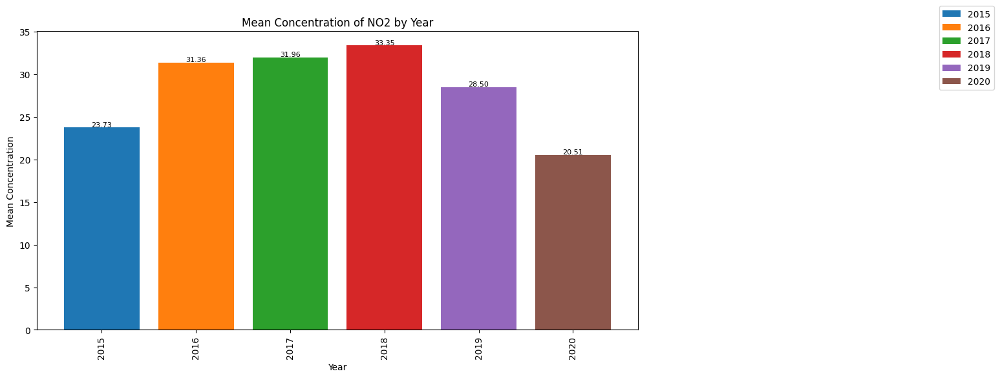

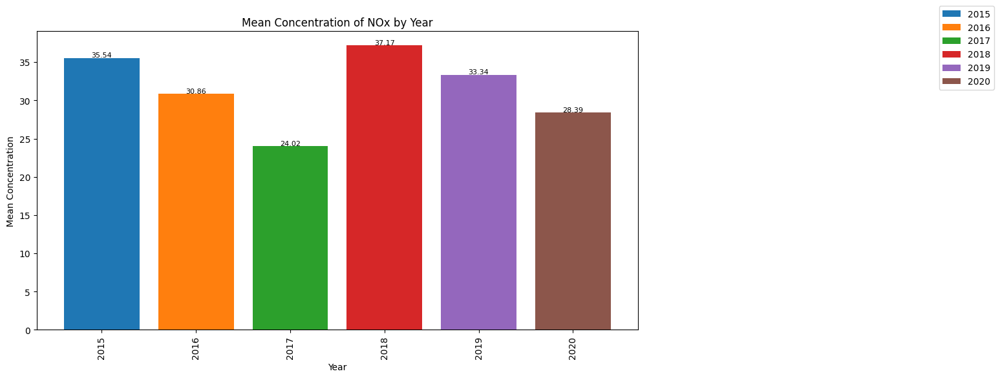

...

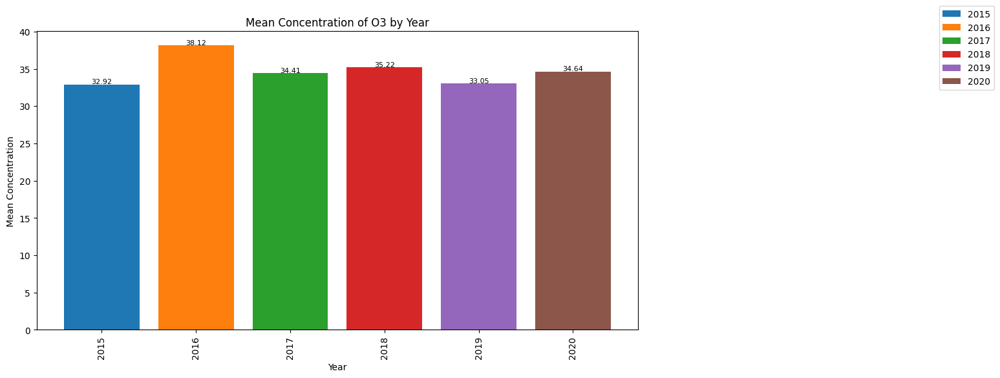

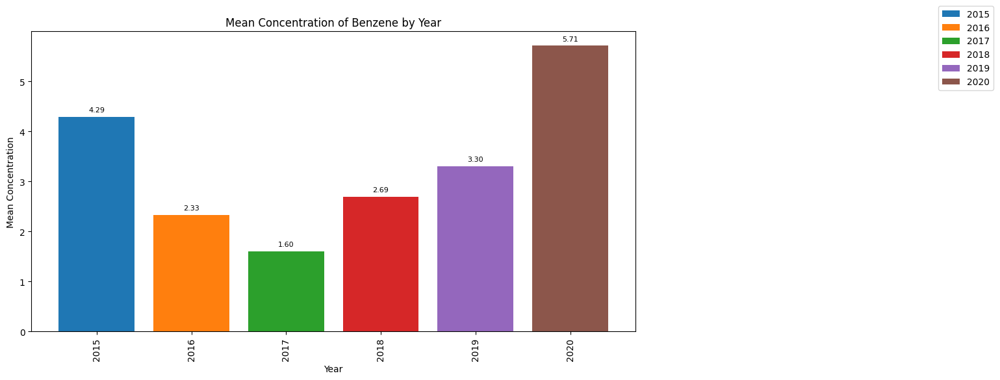

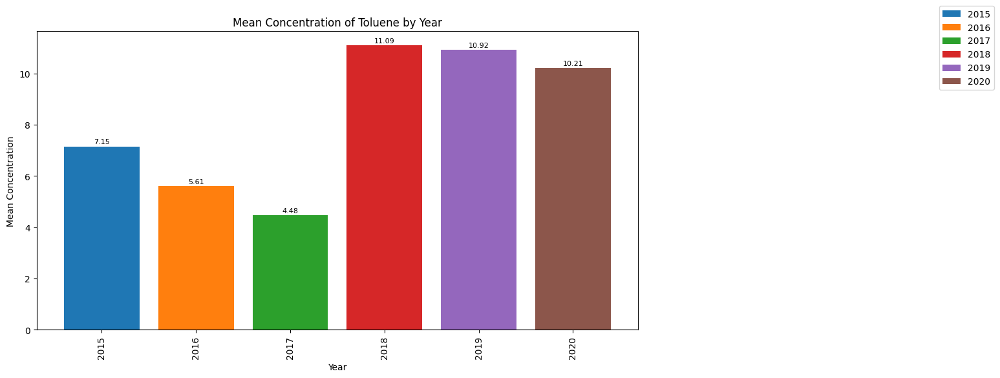

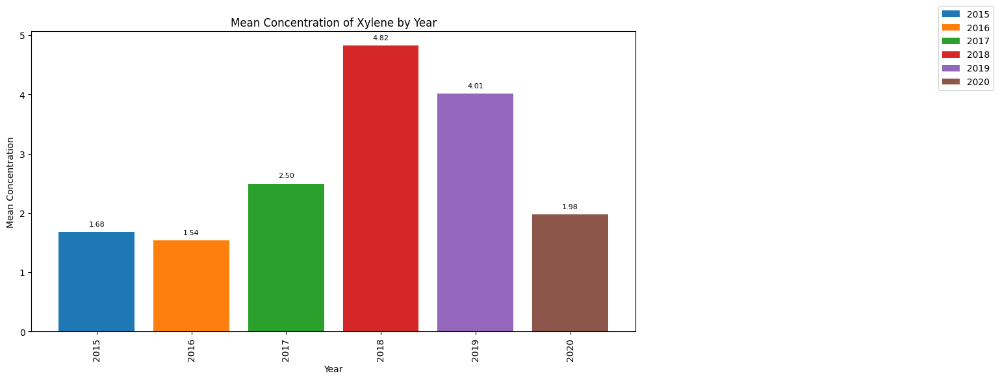

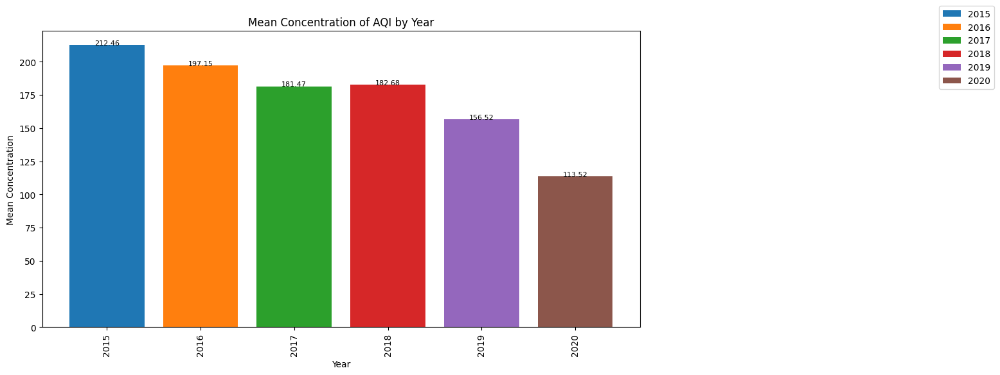

In [ ]:
pollutants = data.columns[1:14]
years = data['Year'].unique()

for pollutant in pollutants:
    fig, ax = plt.subplots(figsize=(12, 6))
    for year in years:
        df = data[(data['Year'] == year) & (~data[pollutant].isna())]
        mean_concentration = df[pollutant].mean()
        ax.bar(year, mean_concentration,label=year)
        ax.text(year, mean_concentration+0.1, f"{mean_concentration:.2f}", ha='center',fontsize=8)
    ax.set_title(f"Mean Concentration of {pollutant} by Year")
    ax.set_xlabel("Year")
    ax.set_ylabel("Mean Concentration")
    ax.legend(bbox_to_anchor=(1.6,1.1))
    plt.xticks(rotation=90)
    plt.show()
    plt.close(fig)

Month Vs Pollutant

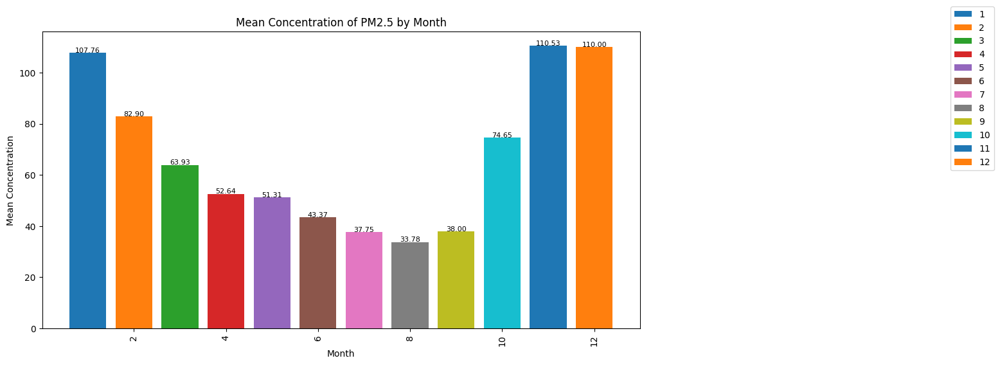

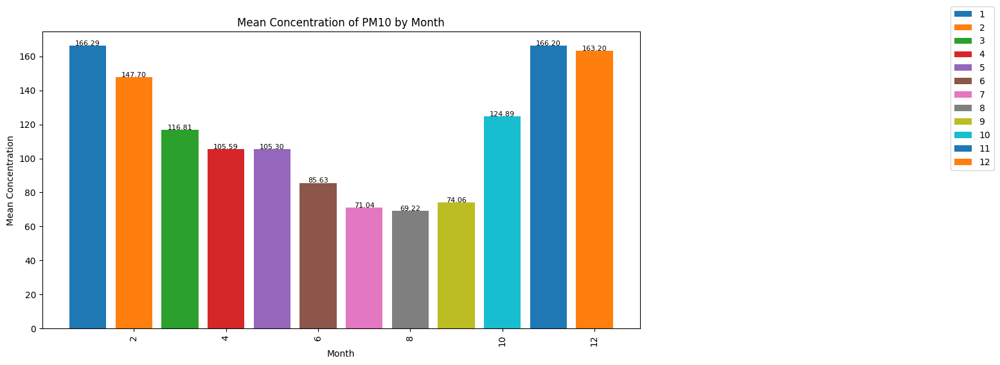

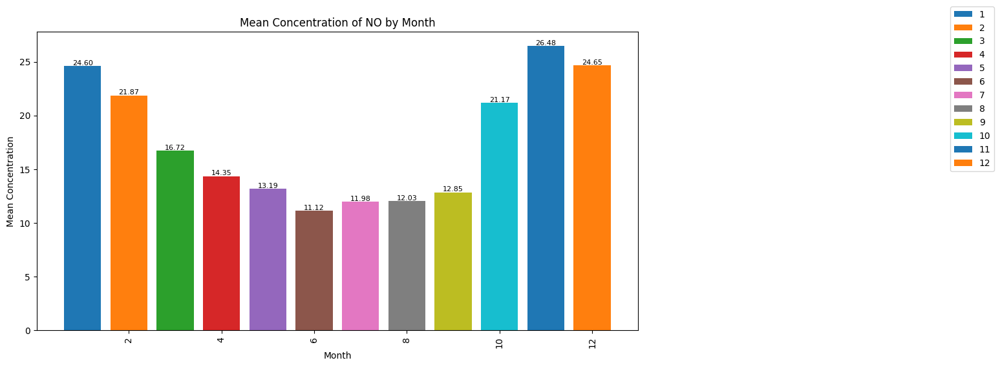

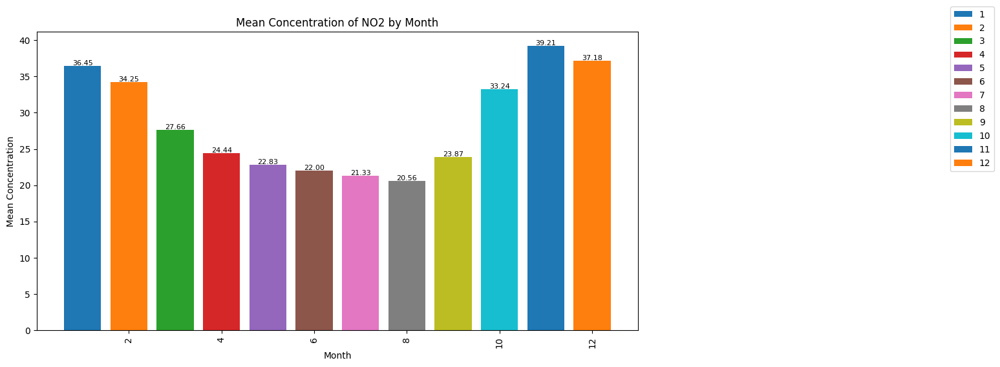

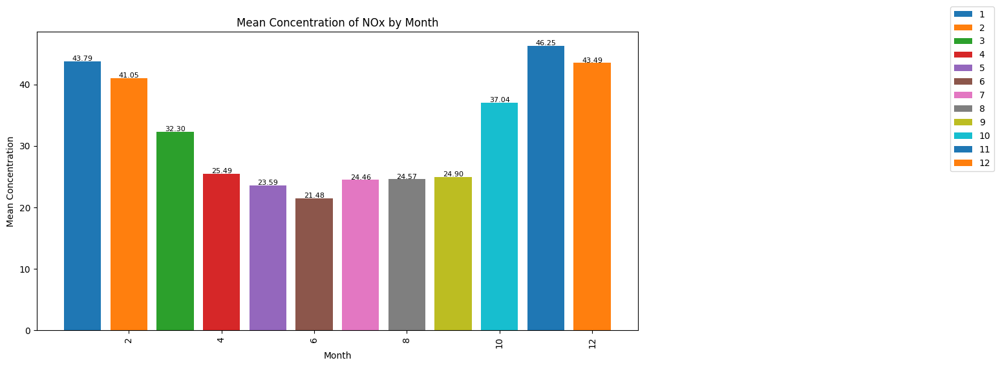

...

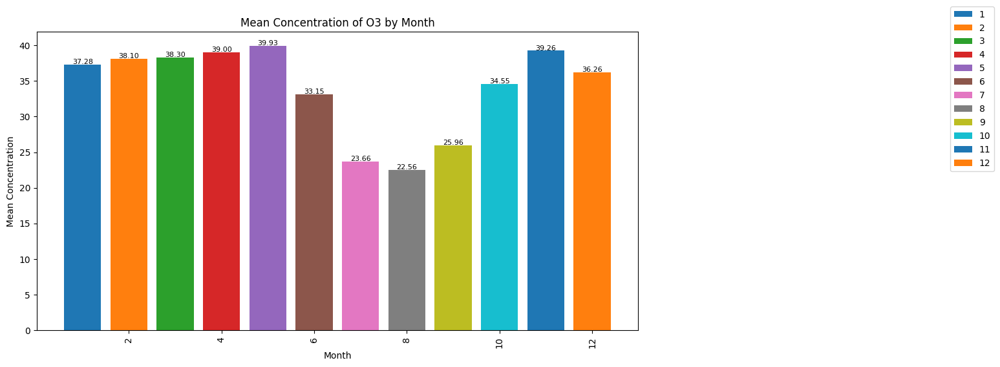

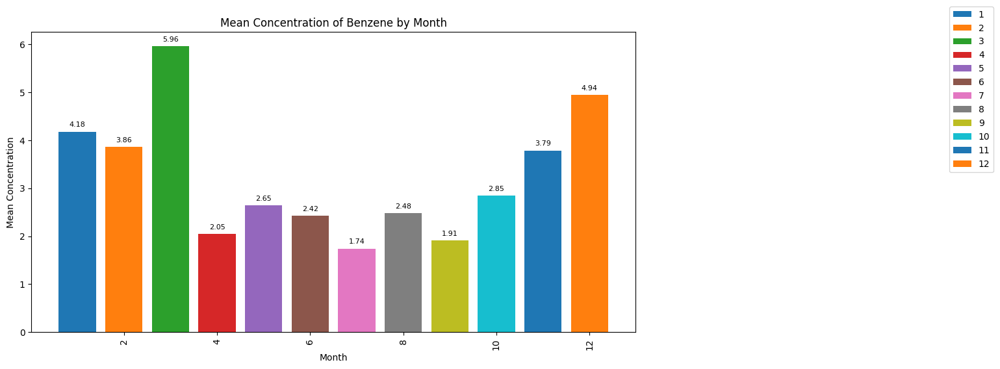

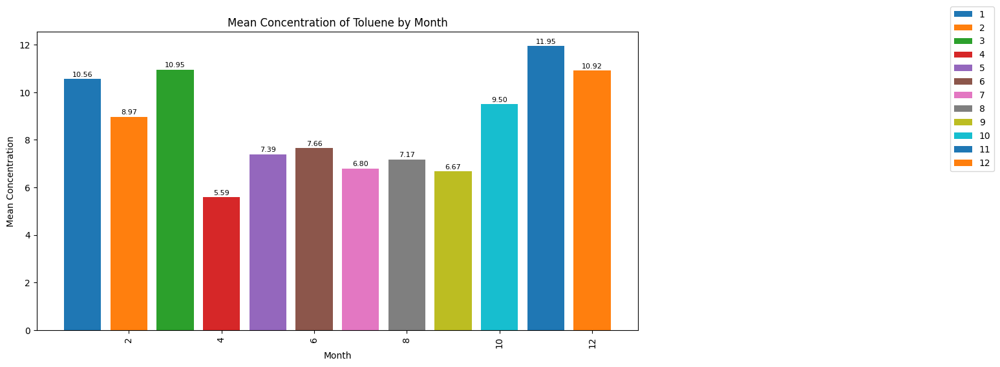

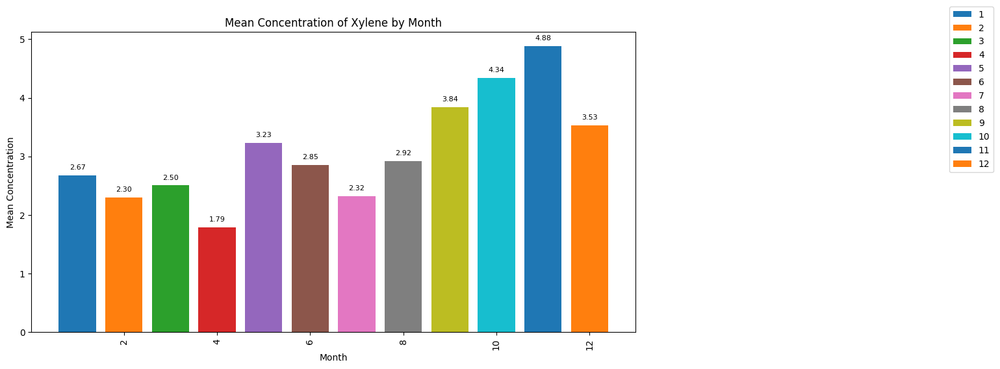

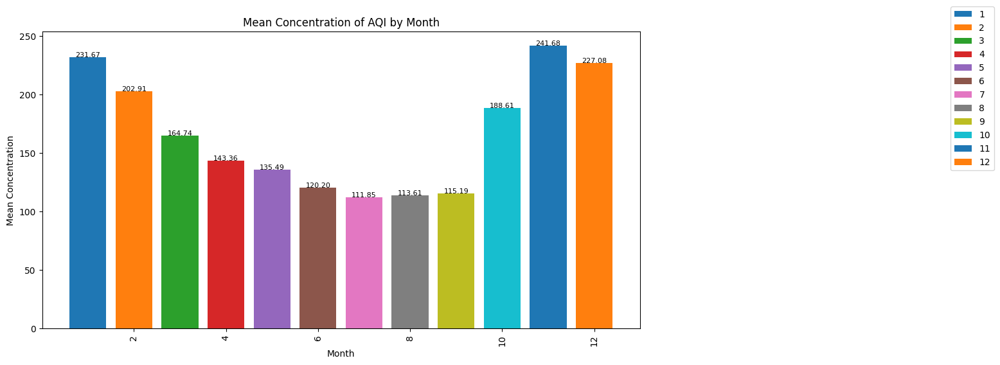

In [ ]:
pollutants = data.columns[1:14]
months = data['Month'].unique()

for pollutant in pollutants:
    fig, ax = plt.subplots(figsize=(12, 6))
    for month in months:
        df = data[(data['Month'] == month) & (~data[pollutant].isna())]
        mean_concentration = df[pollutant].mean()
        ax.bar(month, mean_concentration,label=month)
        ax.text(month, mean_concentration+0.1, f"{mean_concentration:.2f}", ha='center',fontsize=8)
    ax.set_title(f"Mean Concentration of {pollutant} by Month")
    ax.set_xlabel("Month")
    ax.set_ylabel("Mean Concentration")
    ax.legend(bbox_to_anchor=(1.6,1.1))
    plt.xticks(rotation=90)
    plt.show()
    plt.close(fig)

Day Vs Pollutant

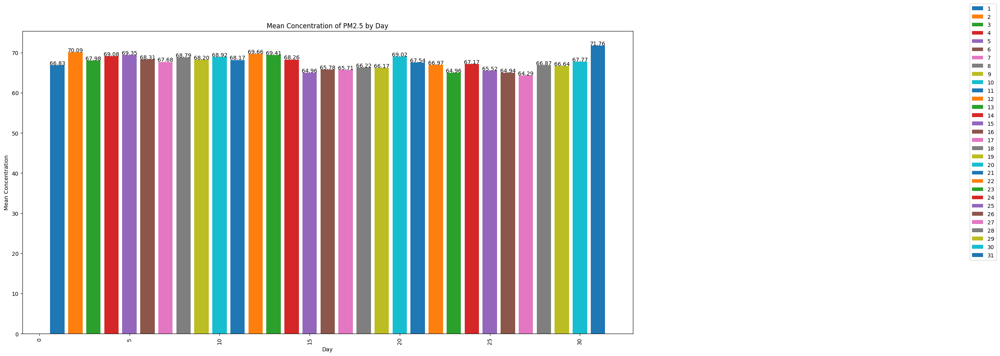

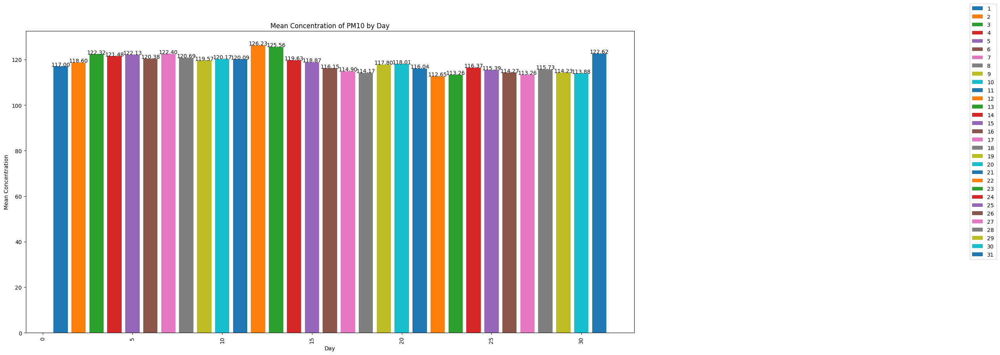

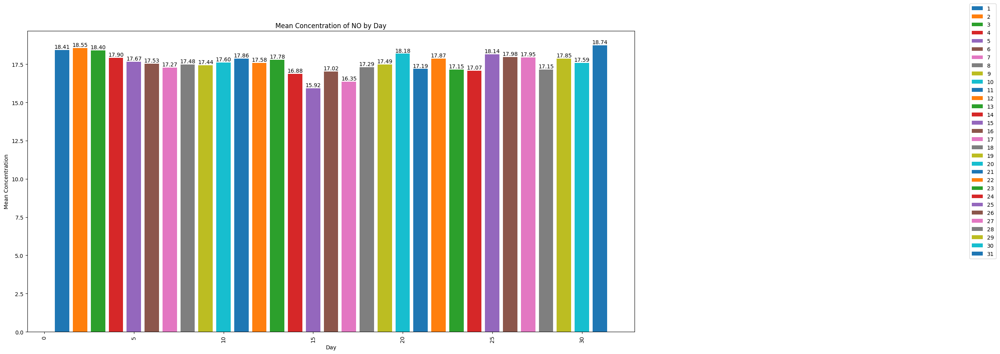

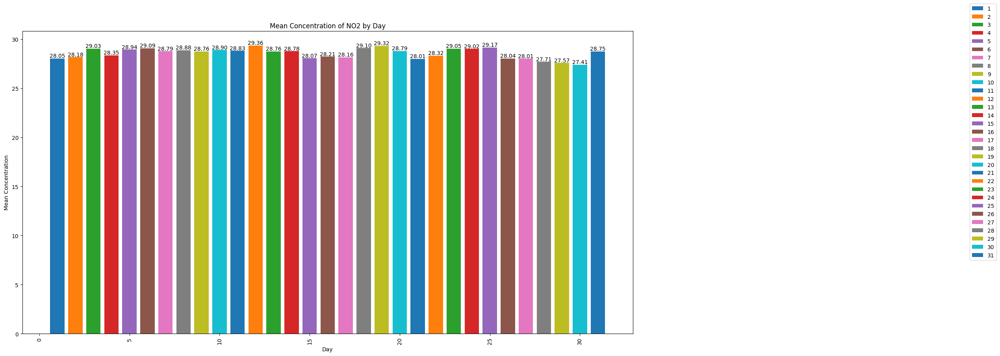

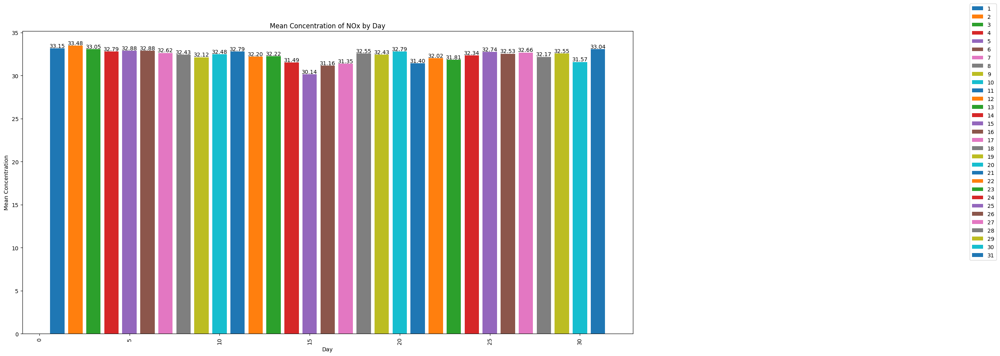

...

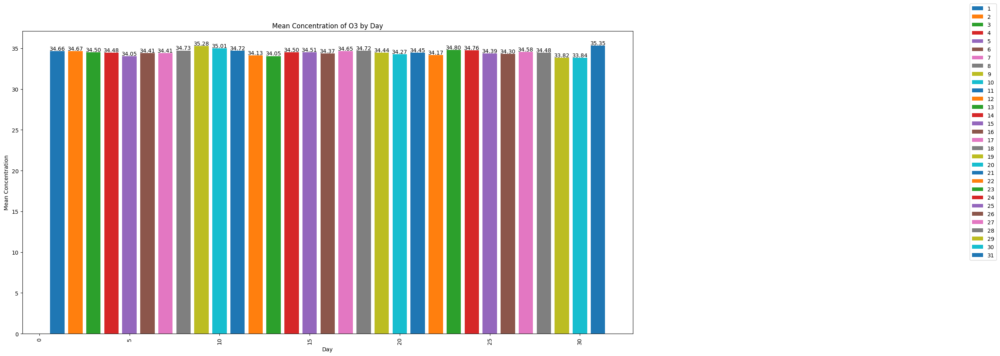

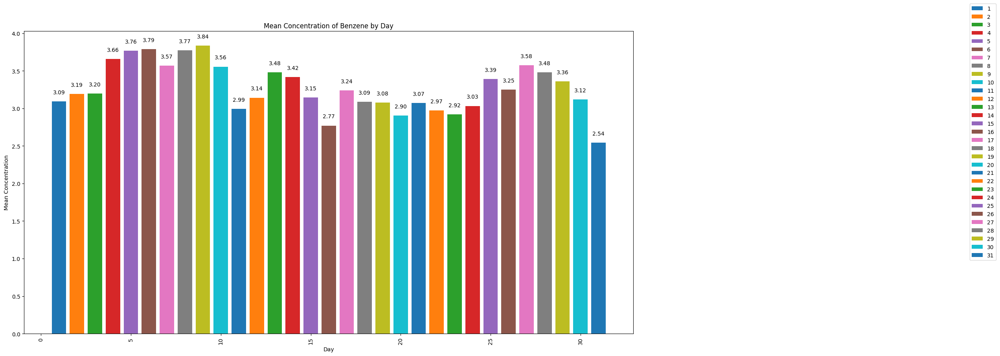

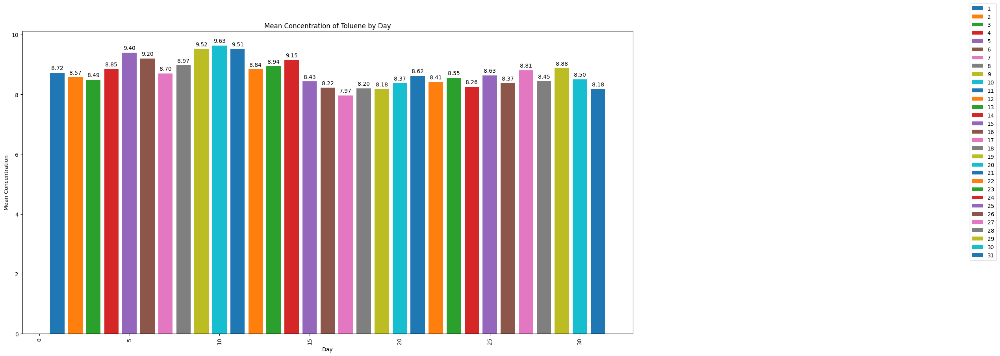

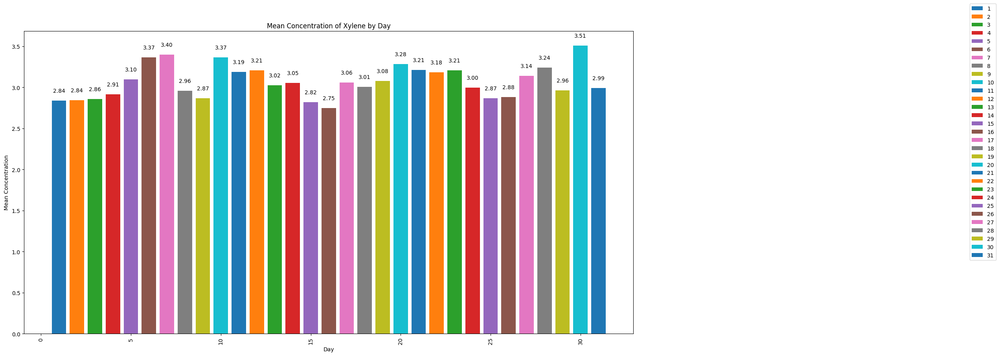

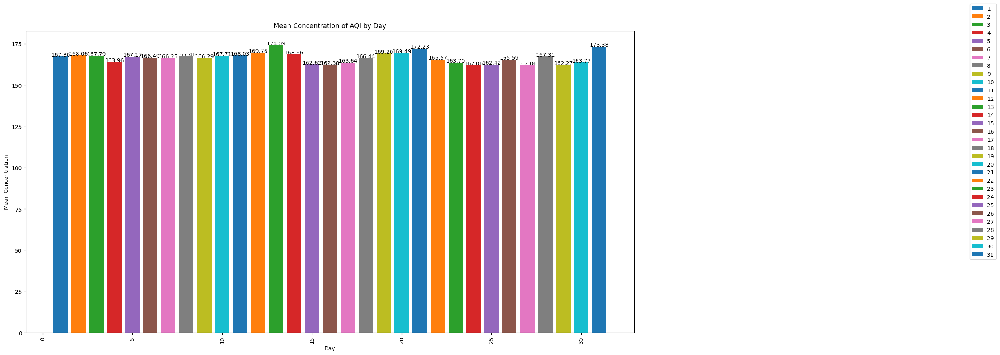

In [ ]:
pollutants = data.columns[1:14]
days = data['Day'].unique()

for pollutant in pollutants:
    fig, ax = plt.subplots(figsize=(20, 10))
    for day in days:
        df = data[(data['Day'] == day) & (~data[pollutant].isna())]
        mean_concentration = df[pollutant].mean()
        ax.bar(day, mean_concentration,label=day)
        ax.text(day, mean_concentration+0.1, f"{mean_concentration:.2f}", ha='center',fontsize=10)
    ax.set_title(f"Mean Concentration of {pollutant} by Day")
    ax.set_xlabel("Day")
    ax.set_ylabel("Mean Concentration")
    ax.legend(bbox_to_anchor=(1.6,1.1))
    plt.xticks(rotation=90)
    plt.show()
    plt.close(fig)

Quarter Vs Pollutant

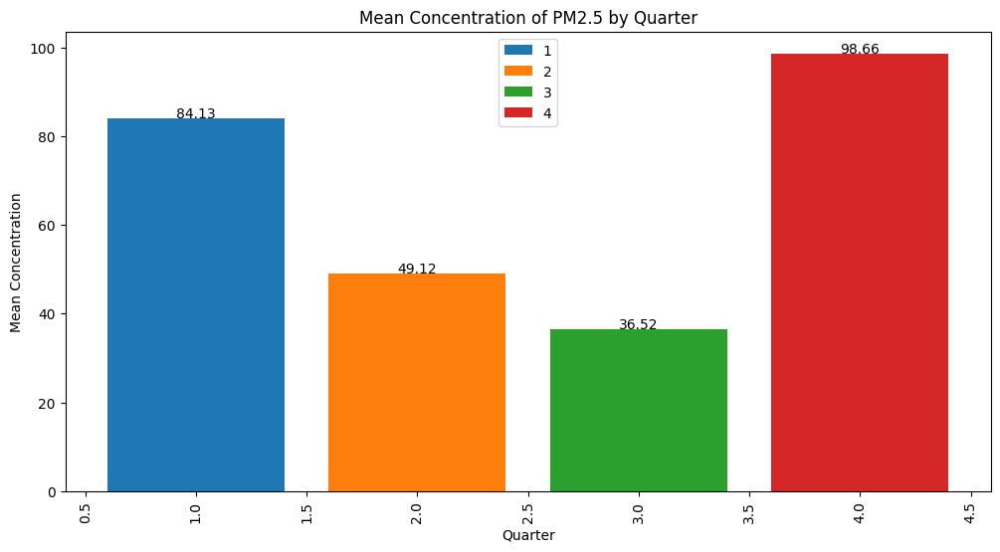

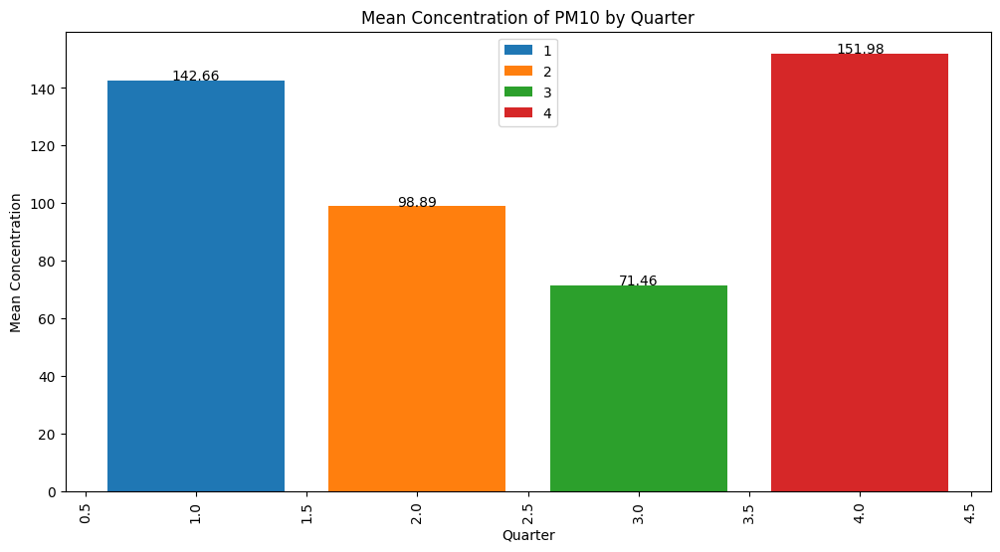

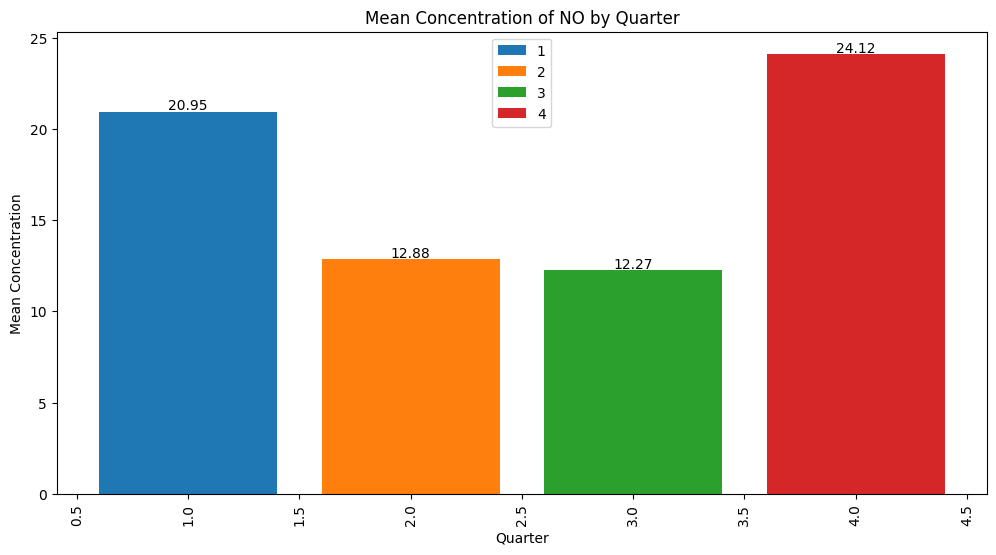

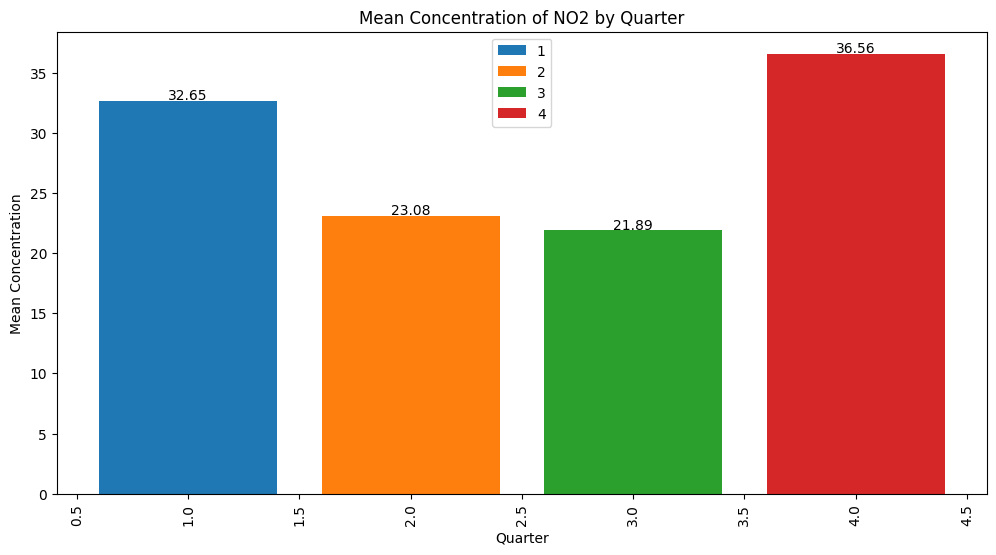

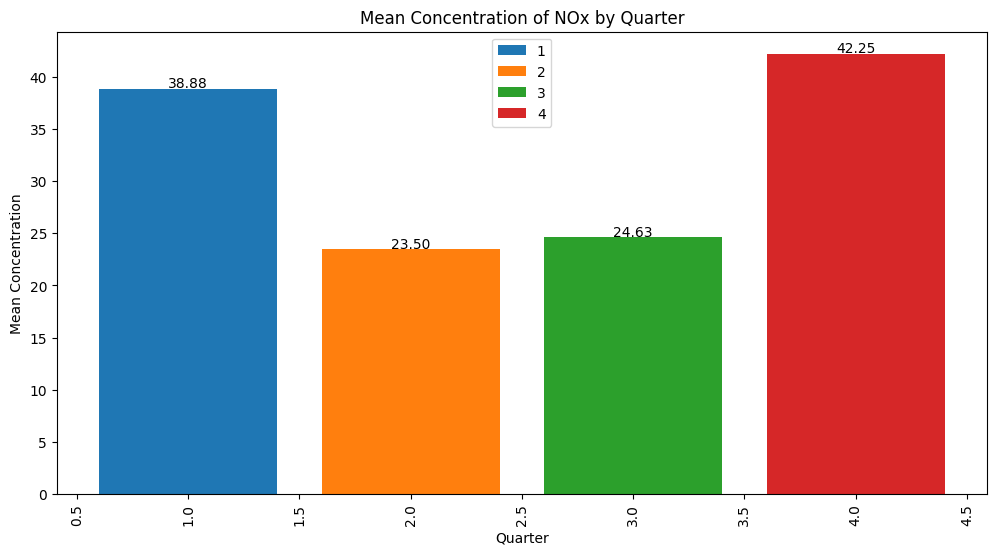

...

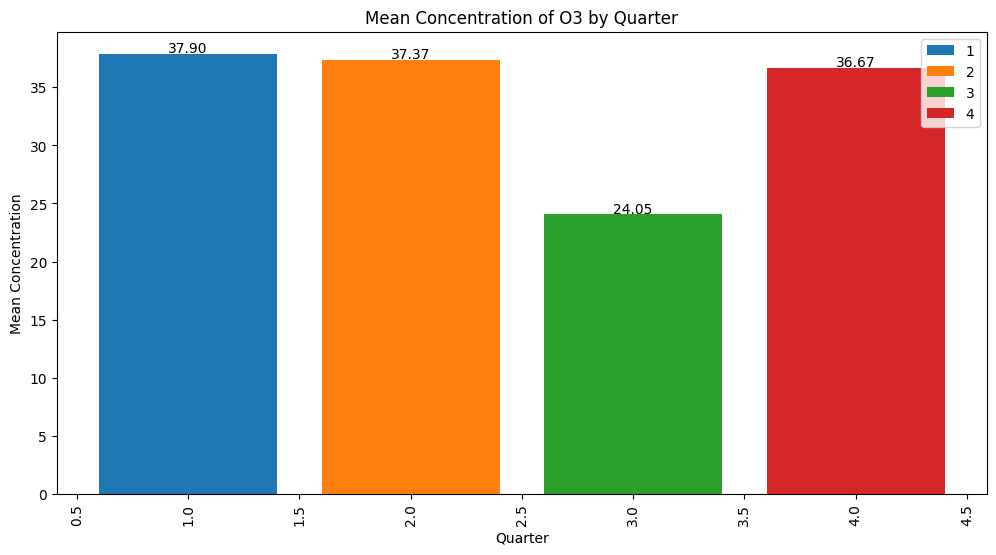

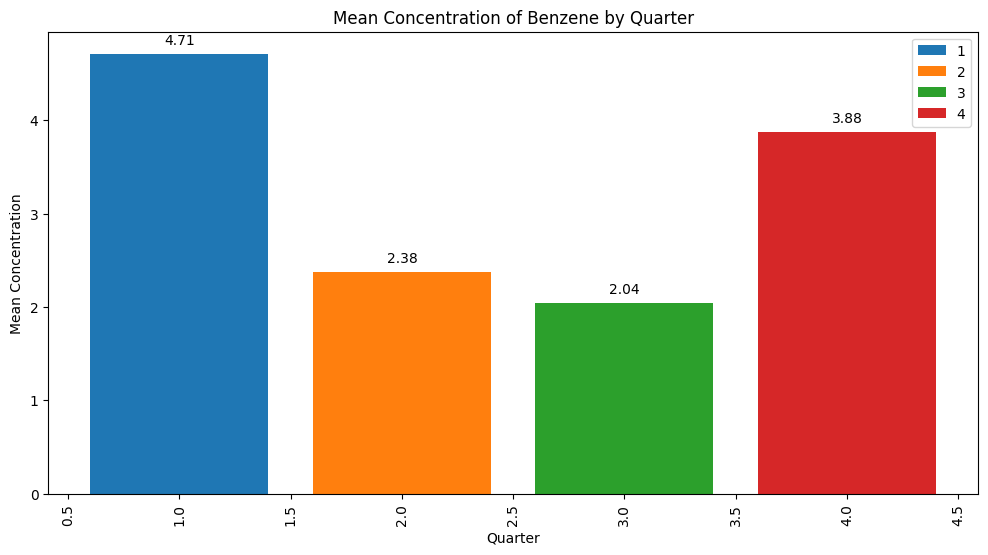

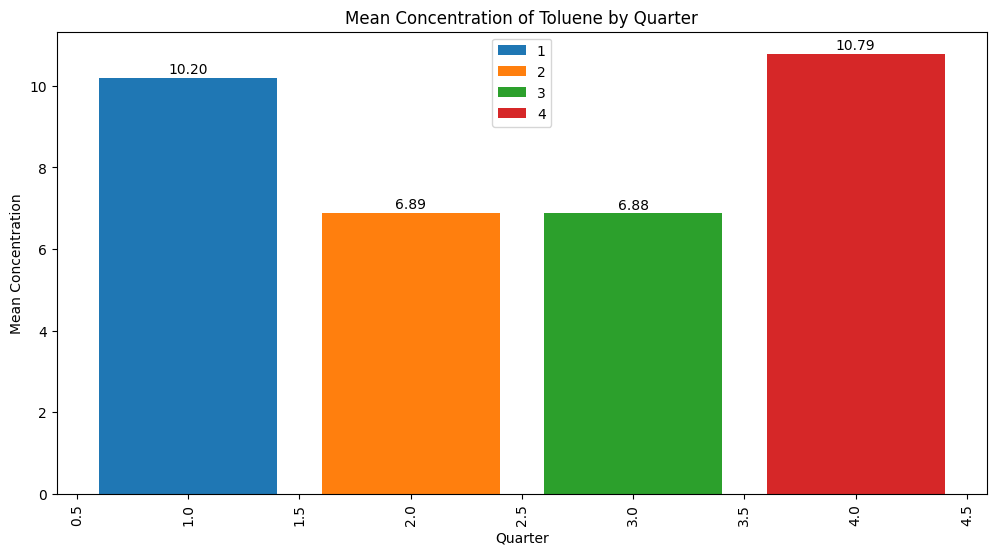

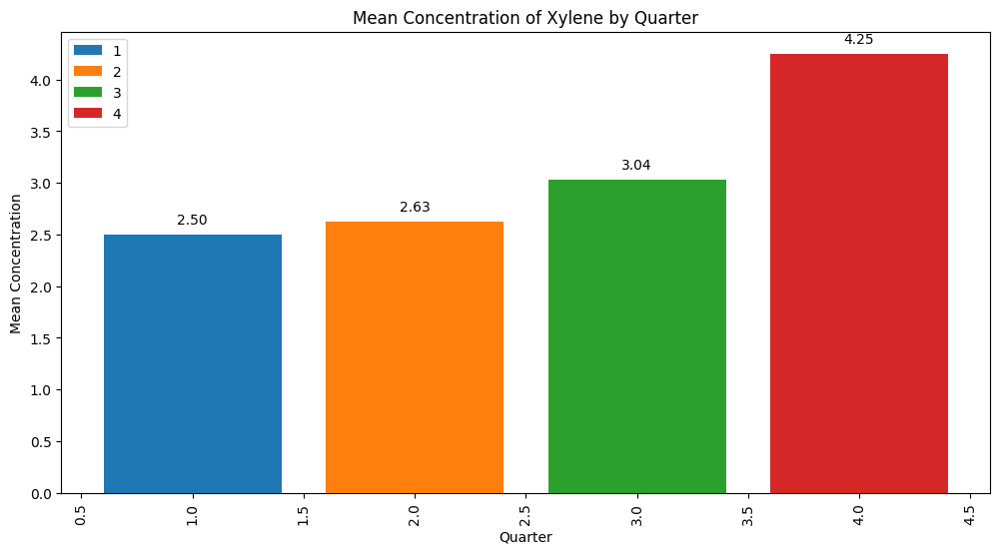

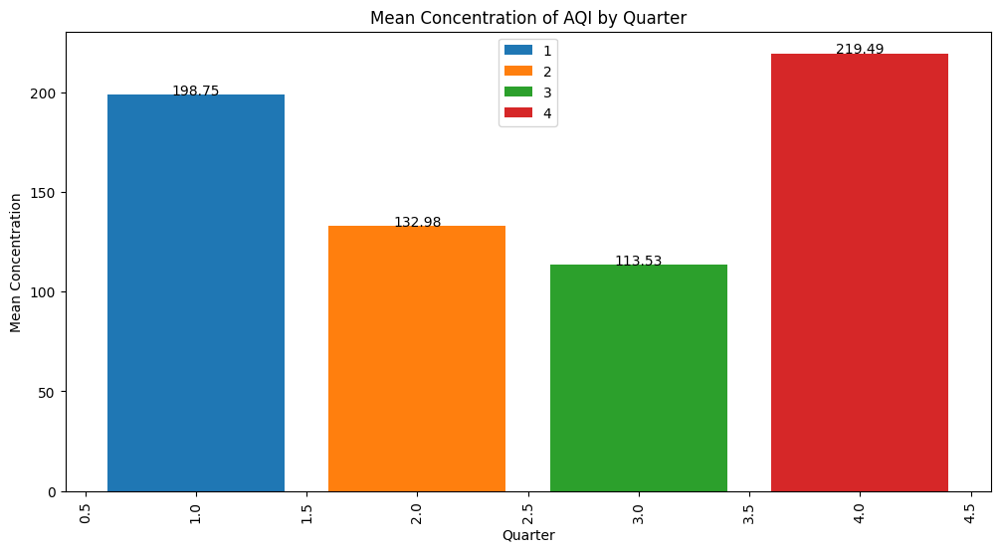

In [ ]:
pollutants = data.columns[1:14]
quarters = data['Quarter'].unique()

for pollutant in pollutants:
    fig, ax = plt.subplots(figsize=(12,6))
    for quarter in quarters:
        df = data[(data['Quarter'] == quarter) & (~data[pollutant].isna())]
        mean_concentration = df[pollutant].mean()
        ax.bar(quarter, mean_concentration,label=quarter)
        ax.text(quarter, mean_concentration+0.1, f"{mean_concentration:.2f}", ha='center',fontsize=10)
    ax.set_title(f"Mean Concentration of {pollutant} by Quarter")
    ax.set_xlabel("Quarter")
    ax.set_ylabel("Mean Concentration")
    ax.legend()
    plt.xticks(rotation=90)
    plt.show()
    plt.close(fig)

Day Of Week Vs Pollutant

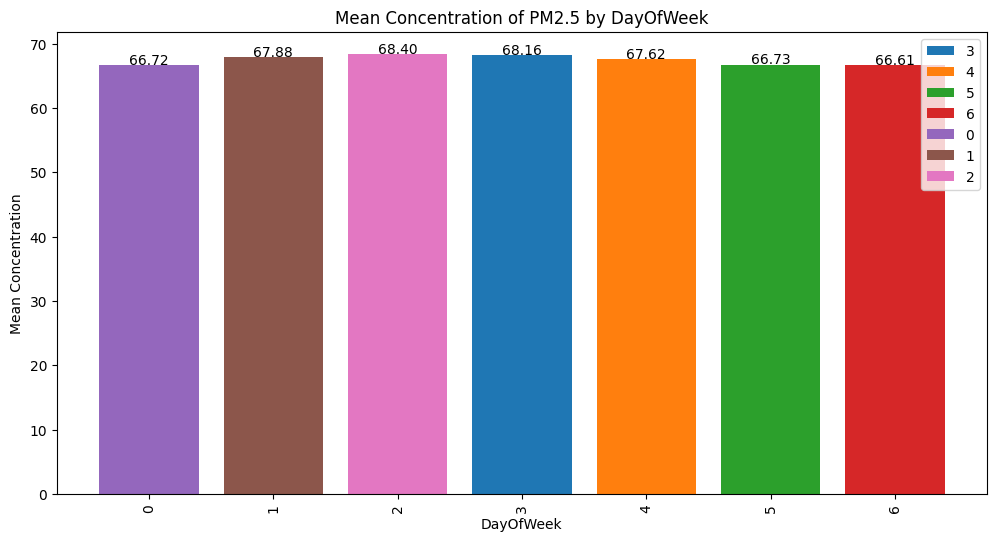

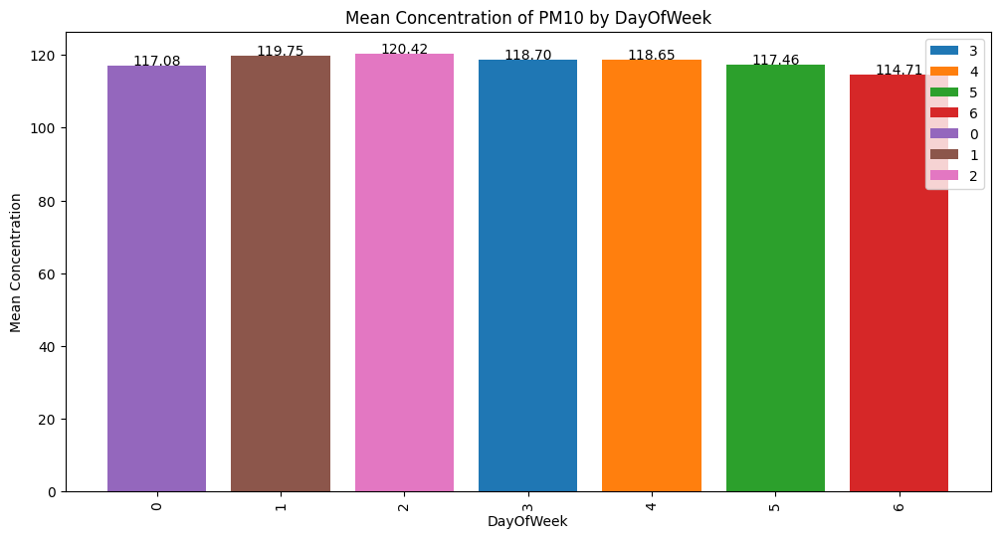

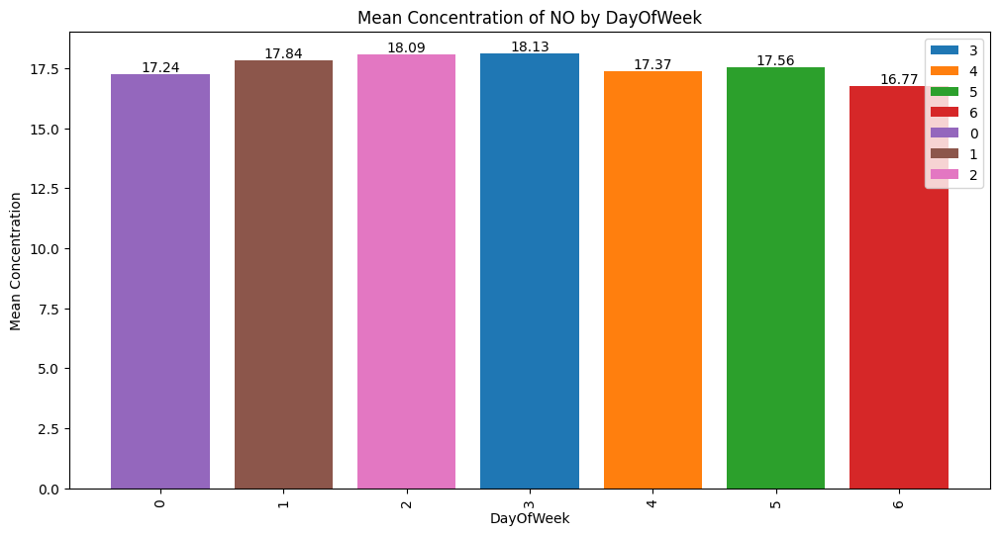

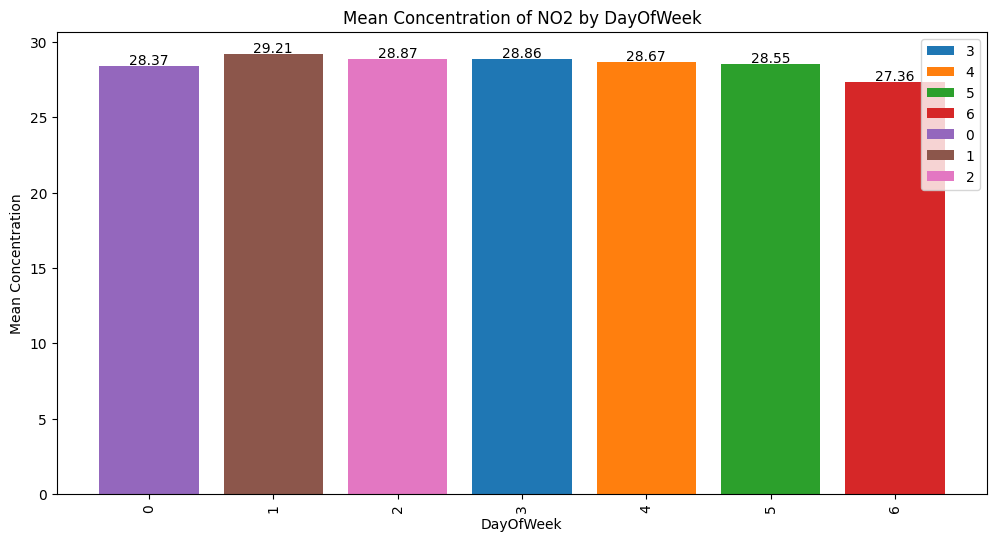

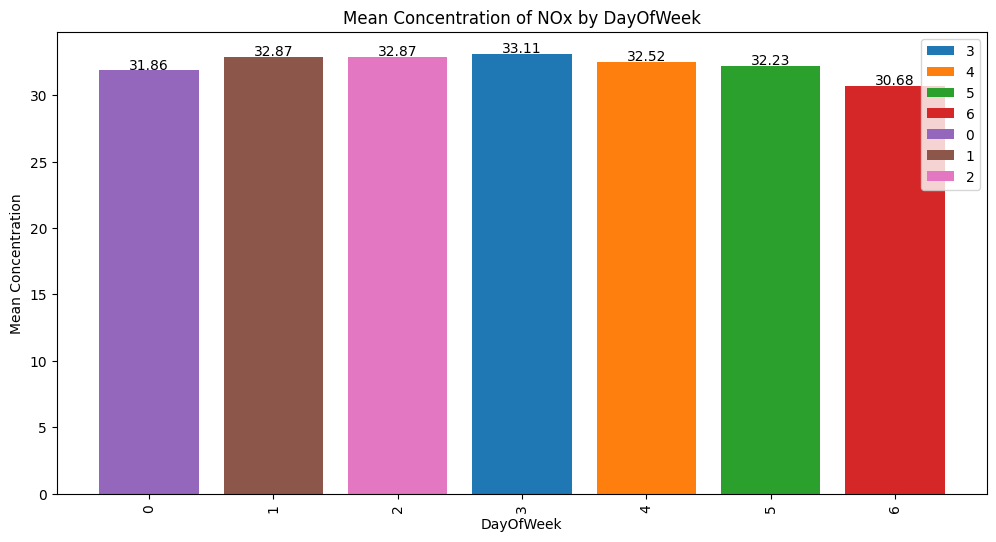

...

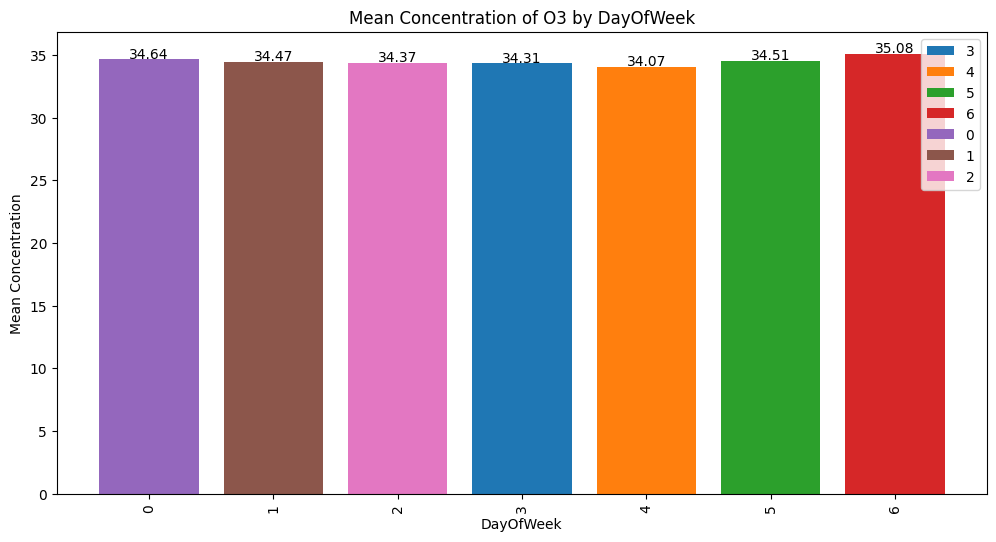

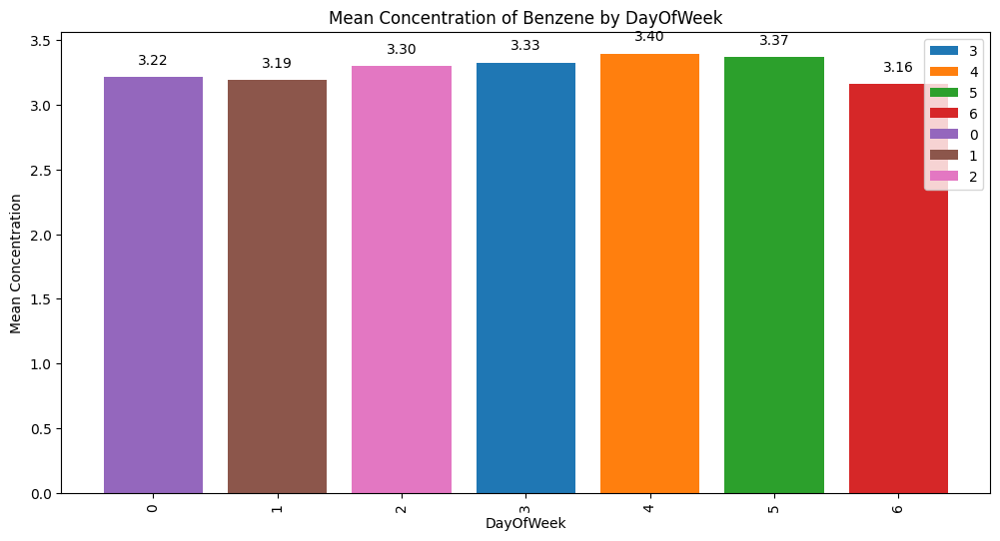

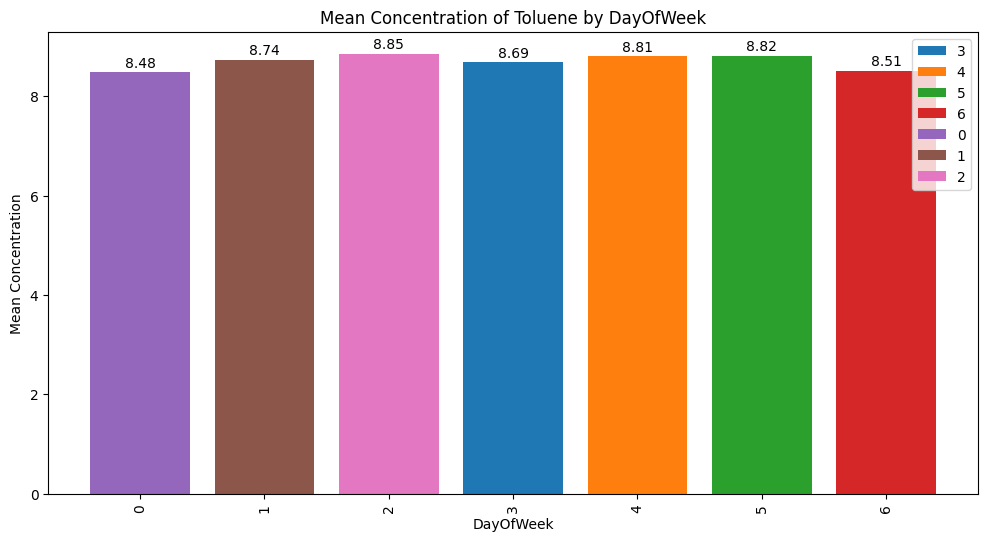

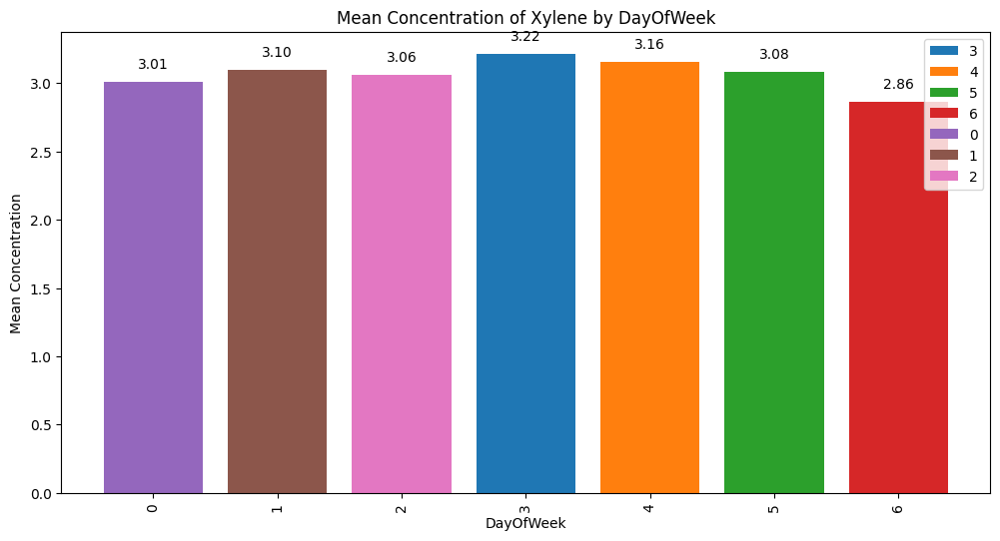

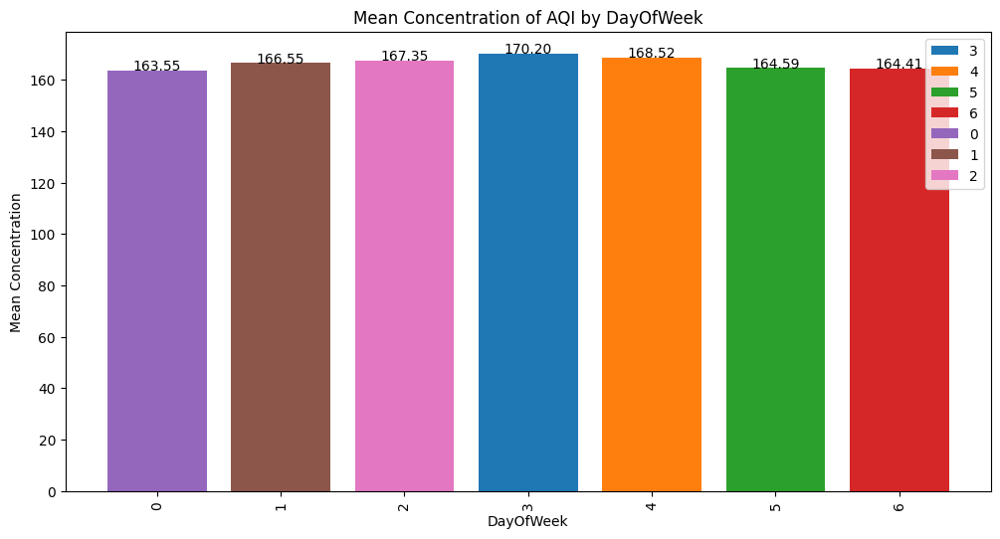

In [ ]:
pollutants = data.columns[1:14]
dayofweeks = data['Day_Of_Week'].unique()

for pollutant in pollutants:
    fig, ax = plt.subplots(figsize=(12,6))
    for dayofweek in dayofweeks:
        df = data[(data['Day_Of_Week'] == dayofweek) & (~data[pollutant].isna())]
        mean_concentration = df[pollutant].mean()
        ax.bar(dayofweek, mean_concentration,label=dayofweek)
        ax.text(dayofweek, mean_concentration+0.1, f"{mean_concentration:.2f}", ha='center',fontsize=10)
    ax.set_title(f"Mean Concentration of {pollutant} by DayOfWeek")
    ax.set_xlabel("DayOfWeek")
    ax.set_ylabel("Mean Concentration")
    ax.legend()
    plt.xticks(rotation=90)
    plt.show()
    plt.close(fig)

State Vs Polluatnt

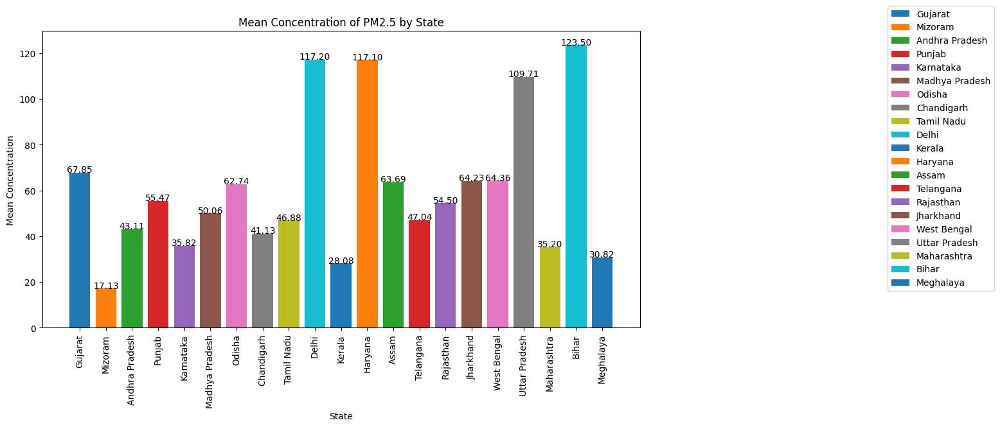

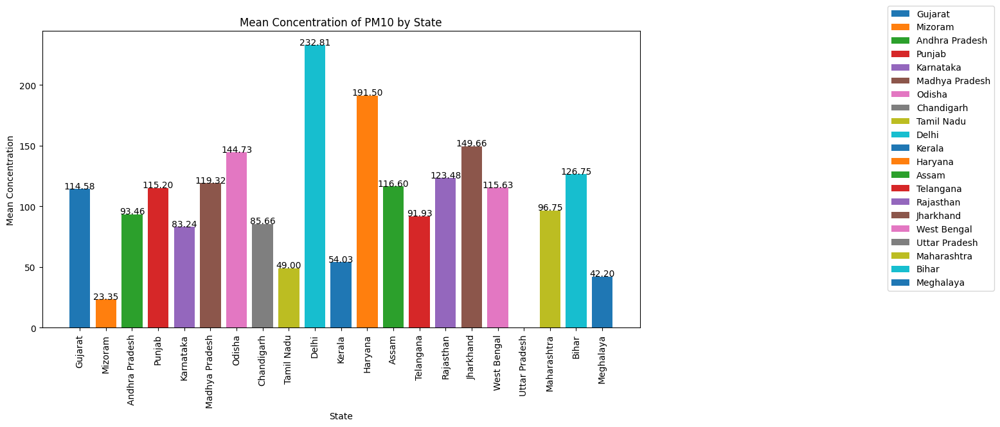

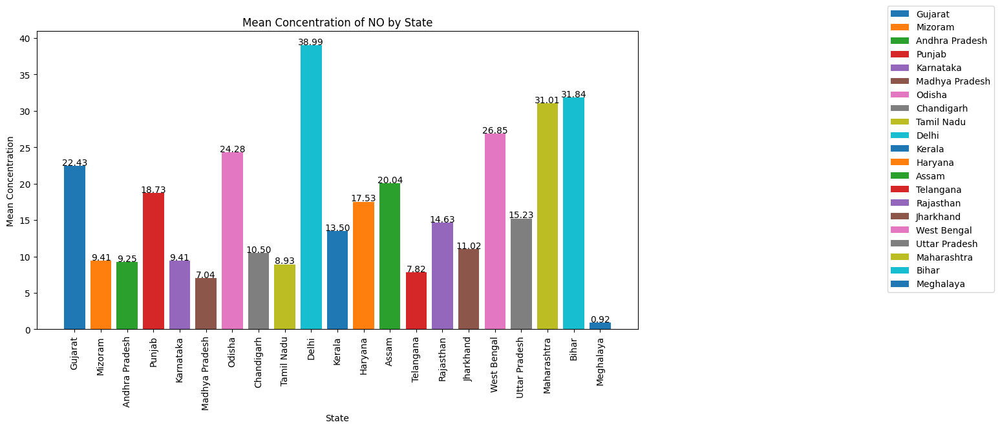

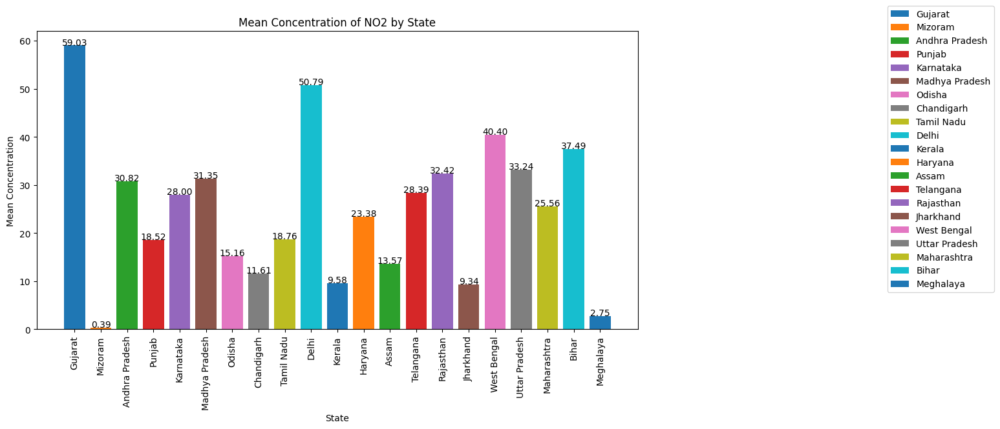

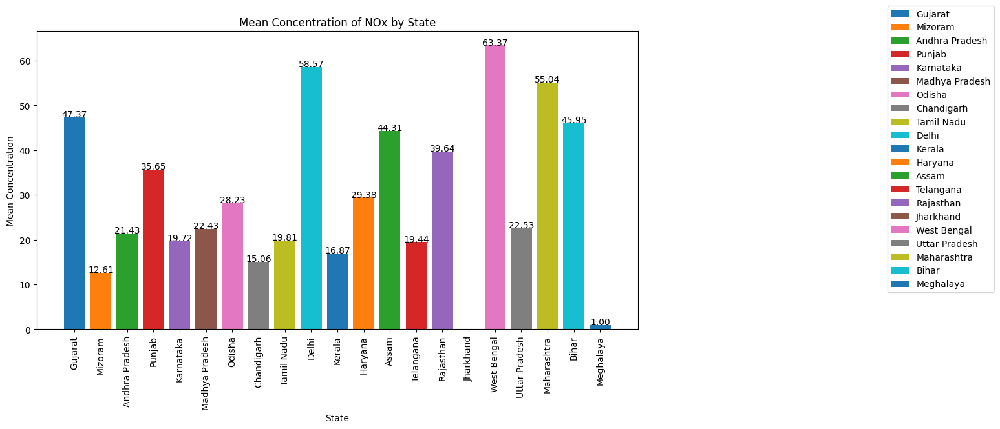

...

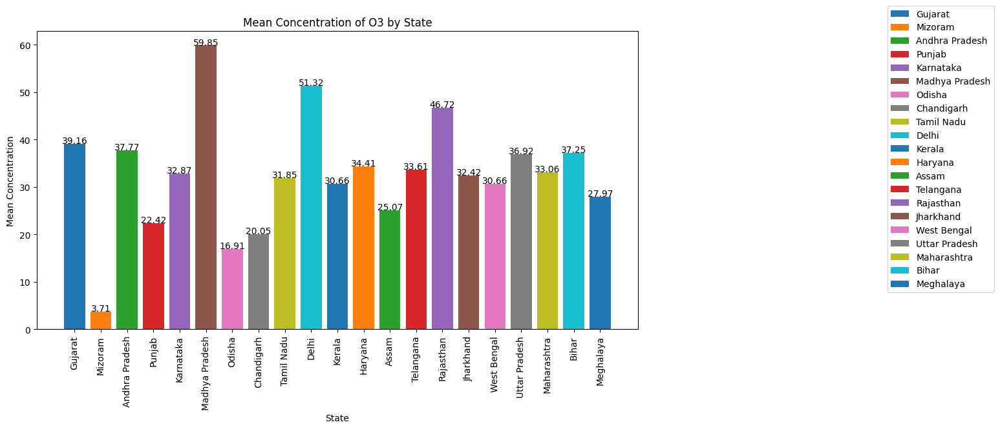

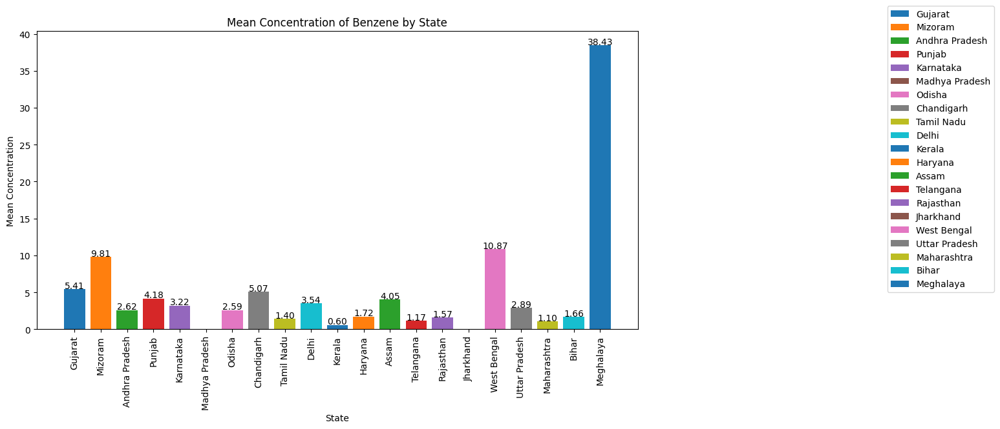

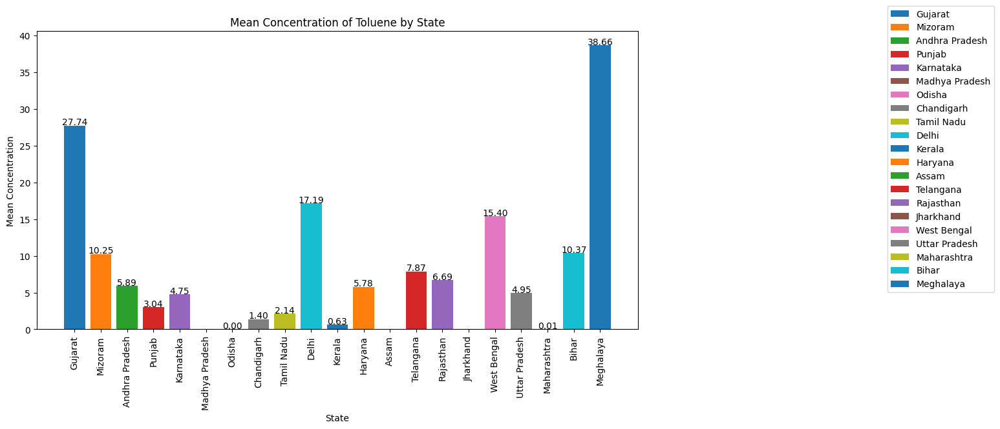

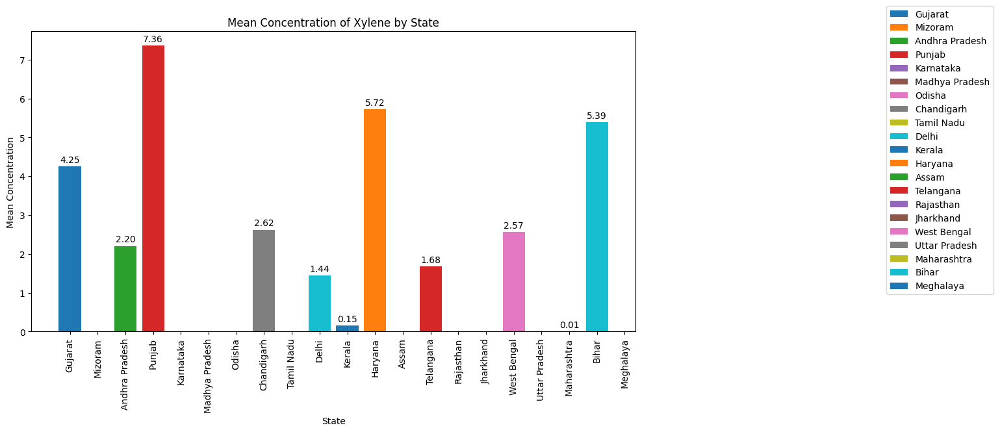

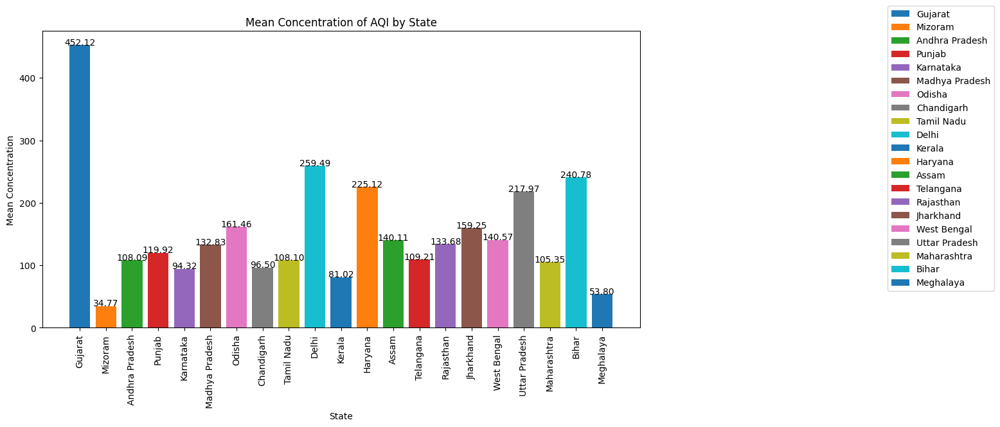

In [ ]:
pollutants = data.columns[1:14]
states = data['State'].unique()

for pollutant in pollutants:
    fig, ax = plt.subplots(figsize=(12,6))
    for state in states:
        df = data[(data['State'] == state) & (~data[pollutant].isna())]
        mean_concentration = df[pollutant].mean()
        ax.bar(state, mean_concentration,label=state)
        ax.text(state, mean_concentration+0.1, f"{mean_concentration:.2f}", ha='center',fontsize=10)
    ax.set_title(f"Mean Concentration of {pollutant} by State")
    ax.set_xlabel("State")
    ax.set_ylabel("Mean Concentration")
    ax.legend(bbox_to_anchor=(1.6,1.1))
    plt.xticks(rotation=90)
    plt.show()
    plt.close(fig)

Zone Vs Polluatnt

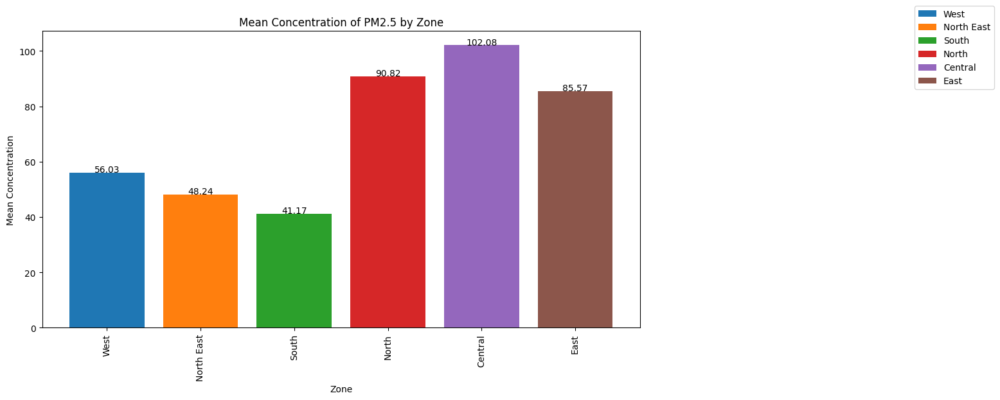

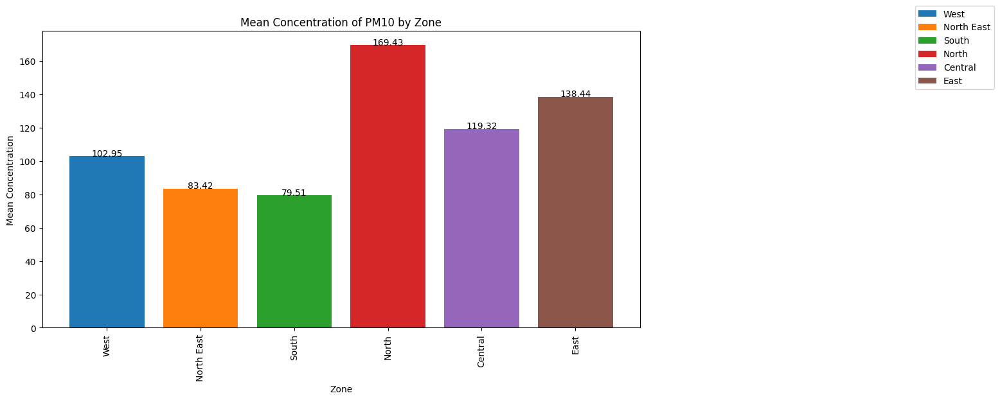

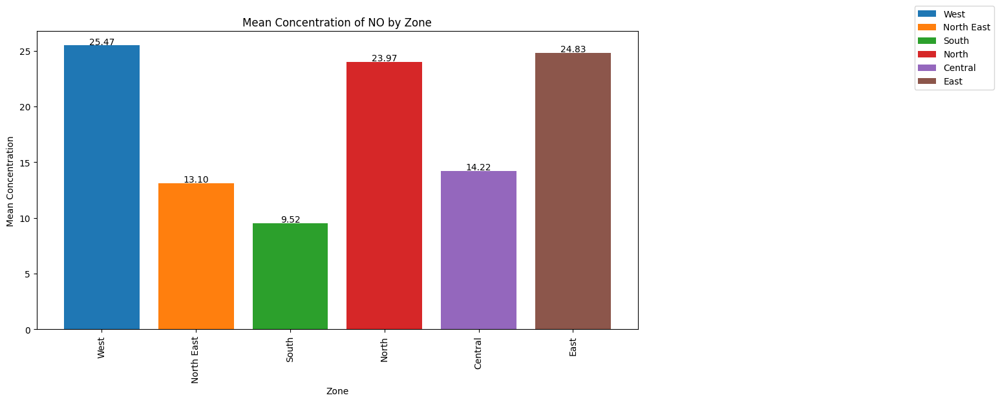

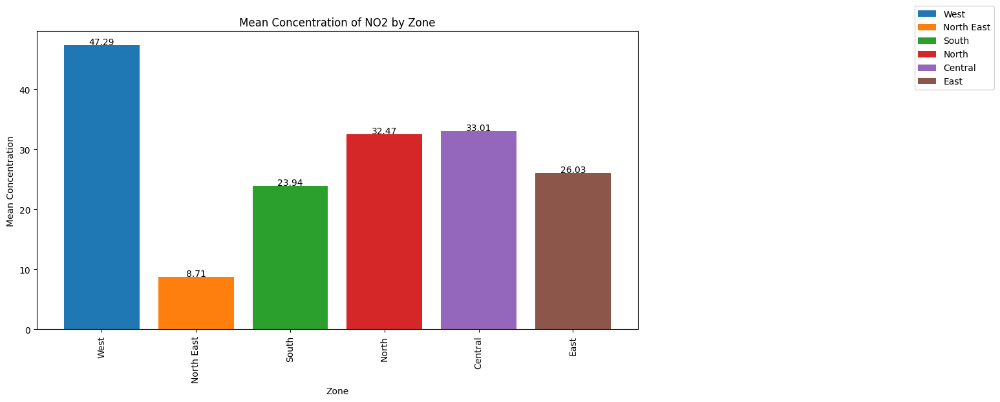

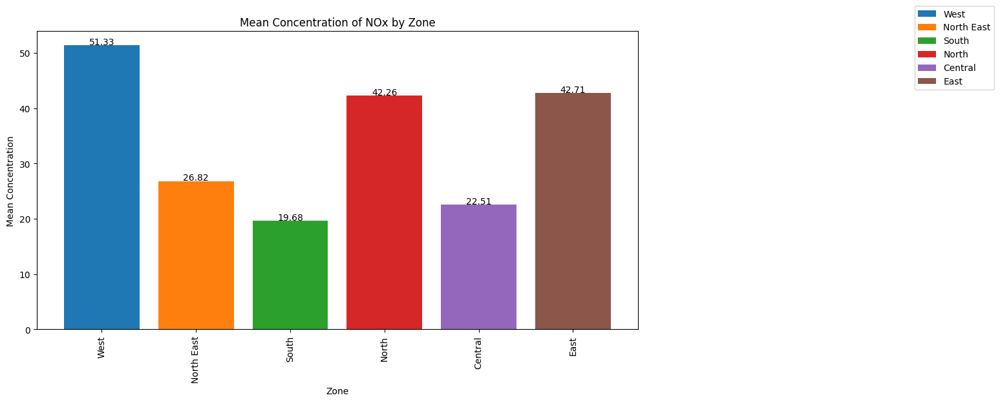

...

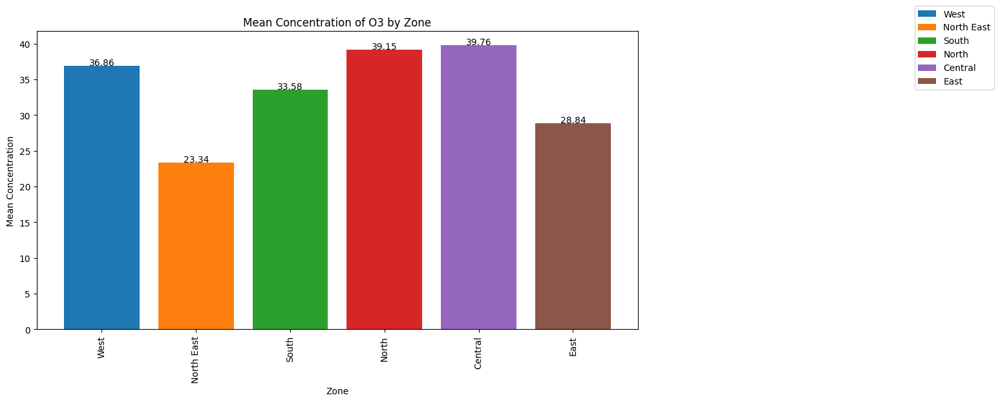

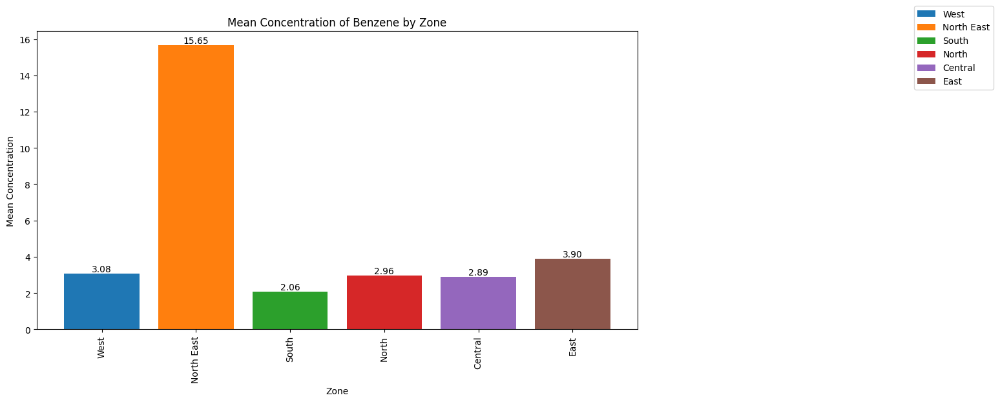

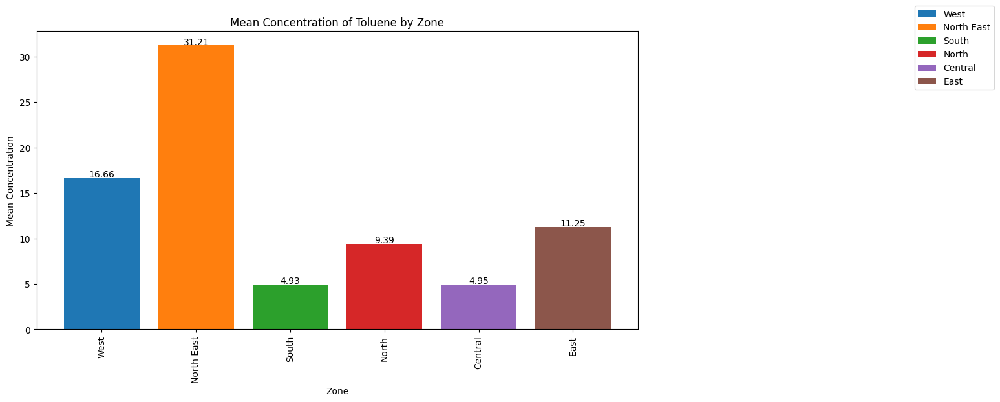

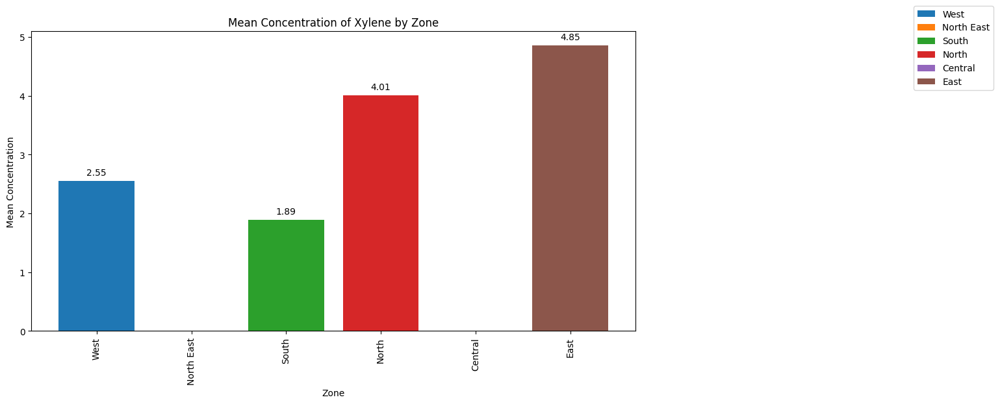

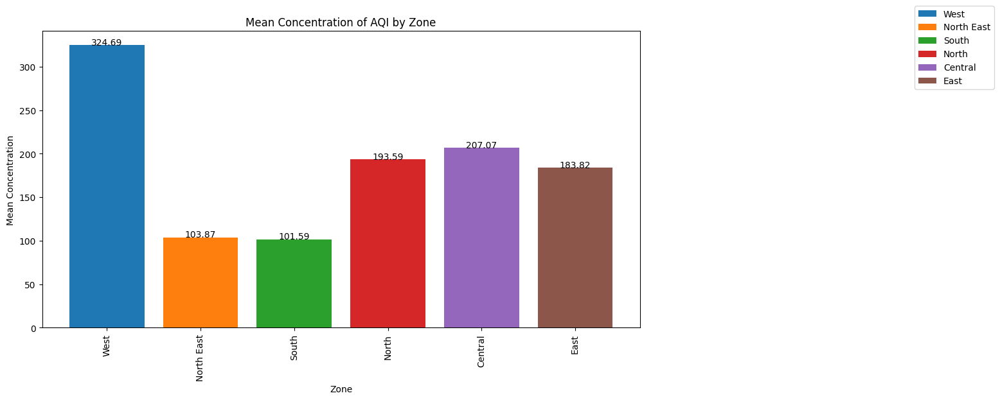

In [ ]:
pollutants = data.columns[1:14]
zones = data['Zone'].unique()

for pollutant in pollutants:
    fig, ax = plt.subplots(figsize=(12,6))
    for zone in zones:
        df = data[(data['Zone'] == zone) & (~data[pollutant].isna())]
        mean_concentration = df[pollutant].mean()
        ax.bar(zone, mean_concentration,label=zone)
        ax.text(zone, mean_concentration+0.1, f"{mean_concentration:.2f}", ha='center',fontsize=10)
    ax.set_title(f"Mean Concentration of {pollutant} by Zone")
    ax.set_xlabel("Zone")
    ax.set_ylabel("Mean Concentration")
    ax.legend(bbox_to_anchor=(1.6,1.1))
    plt.xticks(rotation=90)
    plt.show()
    plt.close(fig)

AQI_Bucket Vs Pollutants

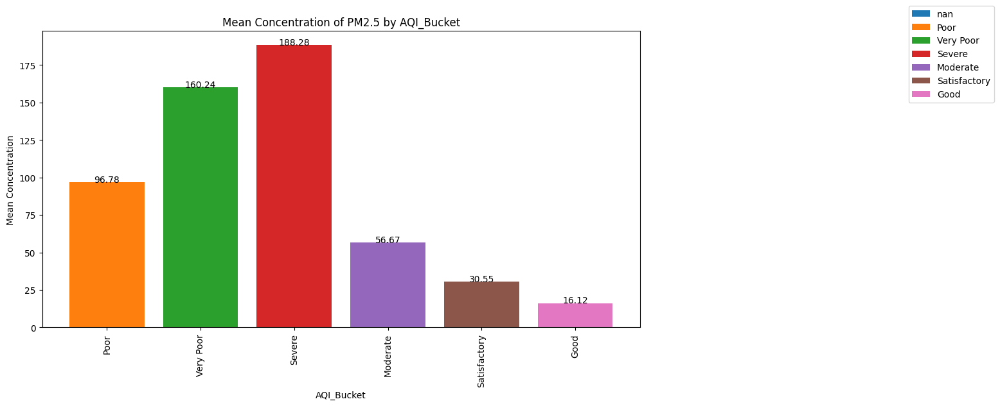

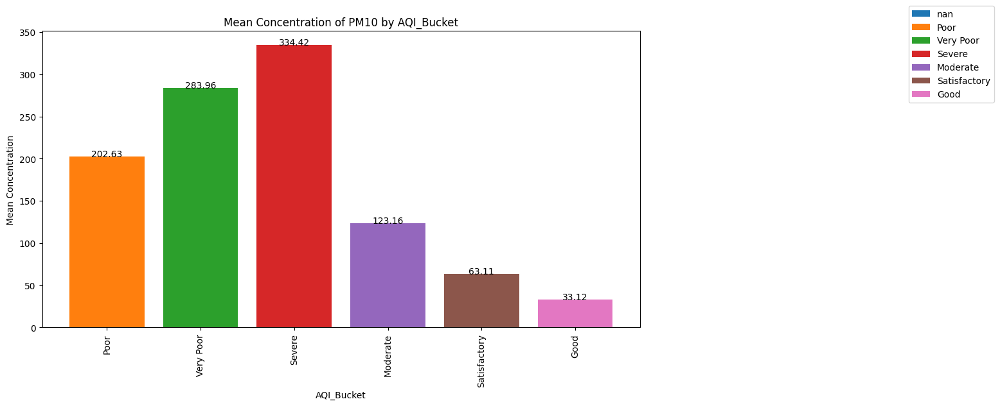

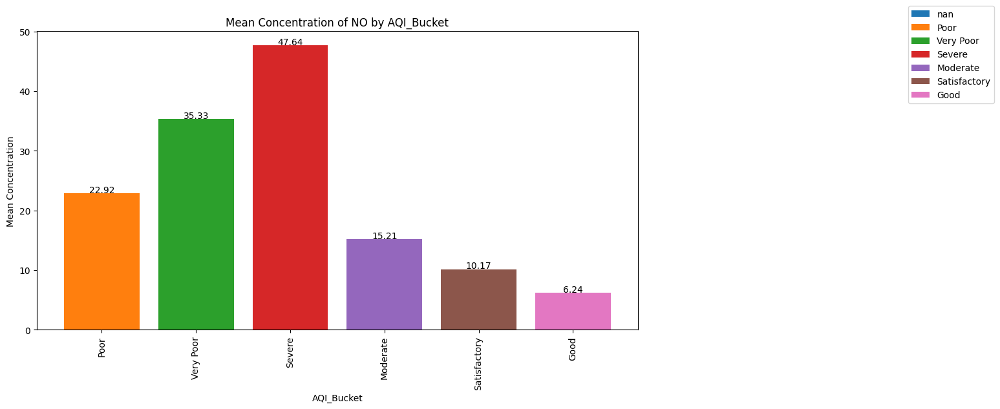

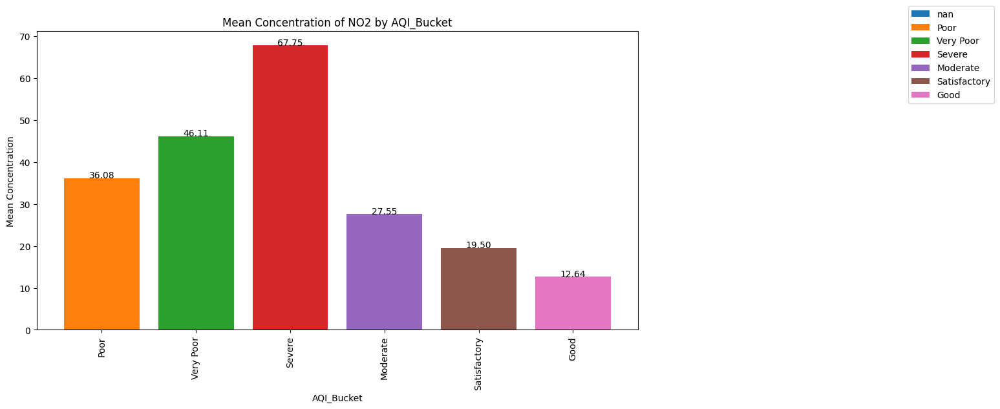

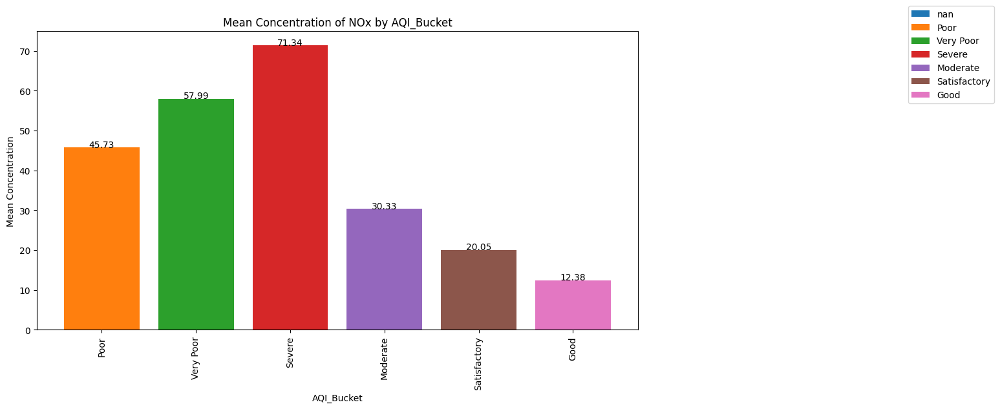

...

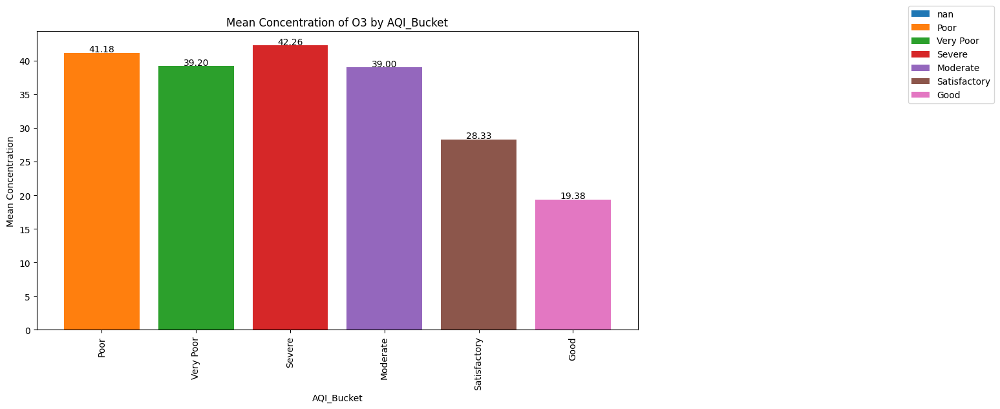

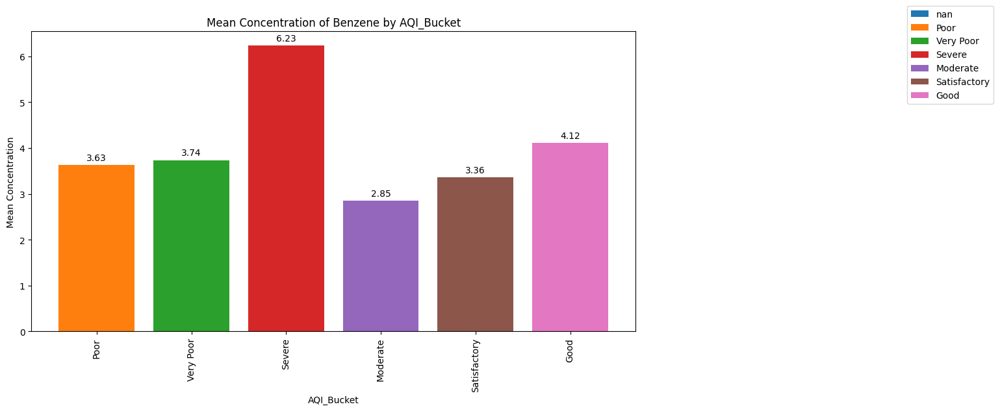

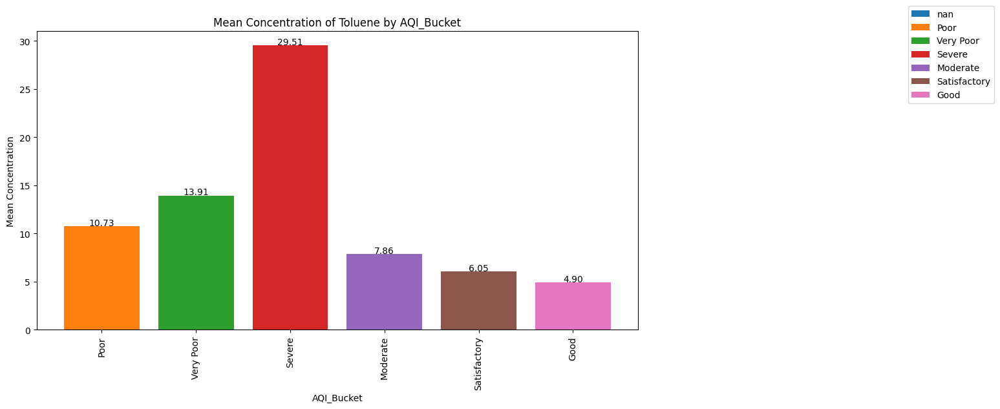

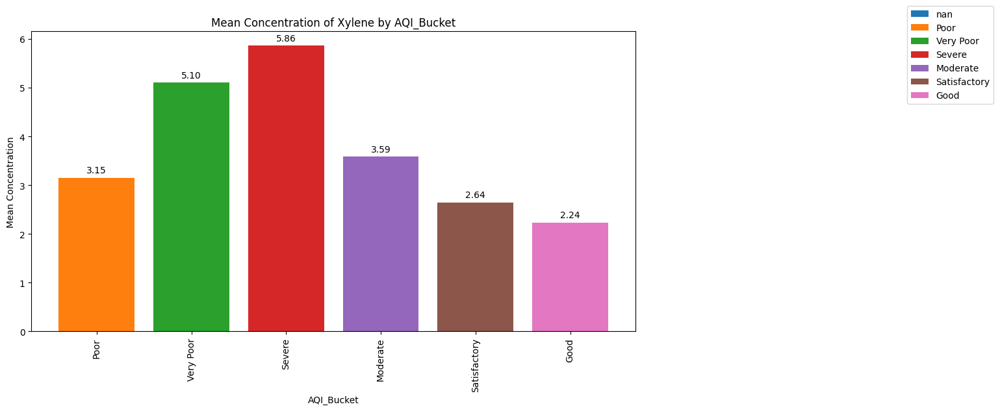

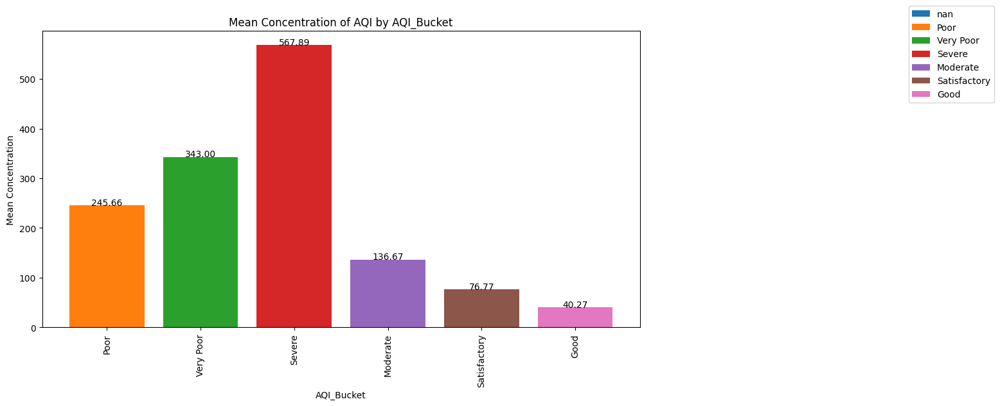

In [ ]:
pollutants = data.columns[1:14]
aqi_buckets = data['AQI_Bucket'].unique()

for pollutant in pollutants:
    fig, ax = plt.subplots(figsize=(12,6))
    for aqi_bucket in aqi_buckets:
        df = data[(data['AQI_Bucket'] == aqi_bucket) & (~data[pollutant].isna())]
        mean_concentration = df[pollutant].mean()
        ax.bar(aqi_bucket, mean_concentration,label=aqi_bucket)
        ax.text(aqi_bucket, mean_concentration+0.1, f"{mean_concentration:.2f}", ha='center',fontsize=10)
    ax.set_title(f"Mean Concentration of {pollutant} by AQI_Bucket")
    ax.set_xlabel("AQI_Bucket")
    ax.set_ylabel("Mean Concentration")
    ax.legend(bbox_to_anchor=(1.6,1.1))
    plt.xticks(rotation=90)
    plt.show()
    plt.close(fig)

In [ ]:
#Count Plot

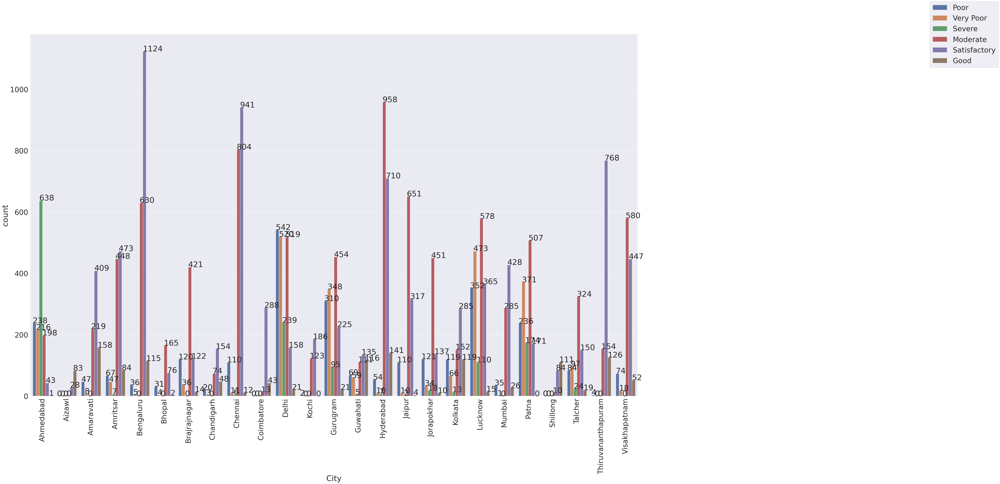

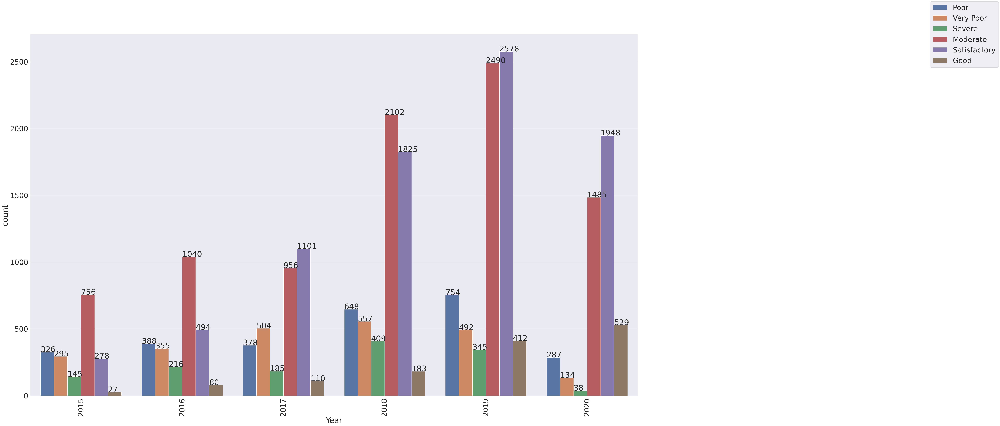

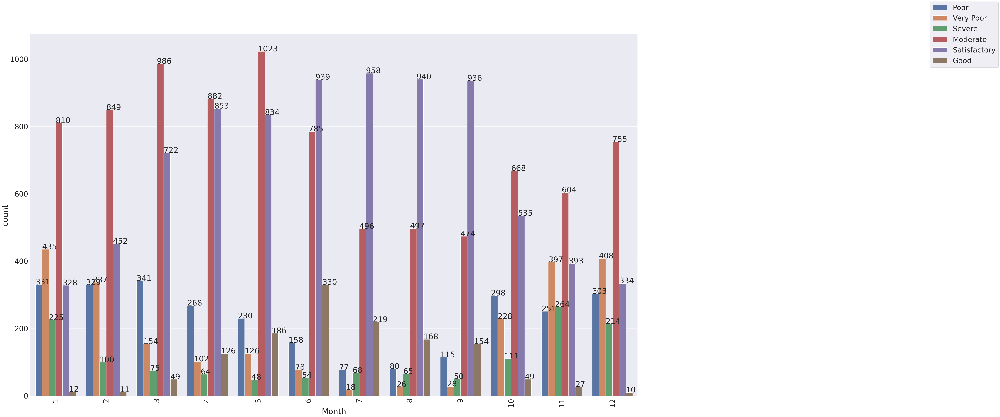

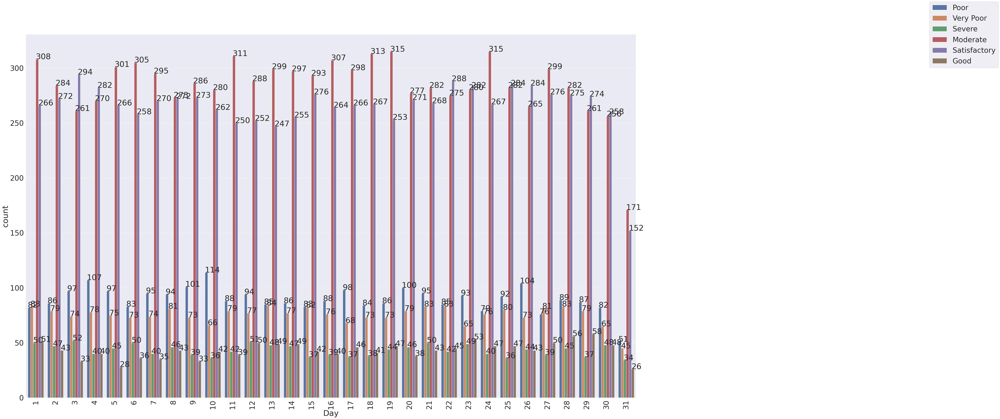

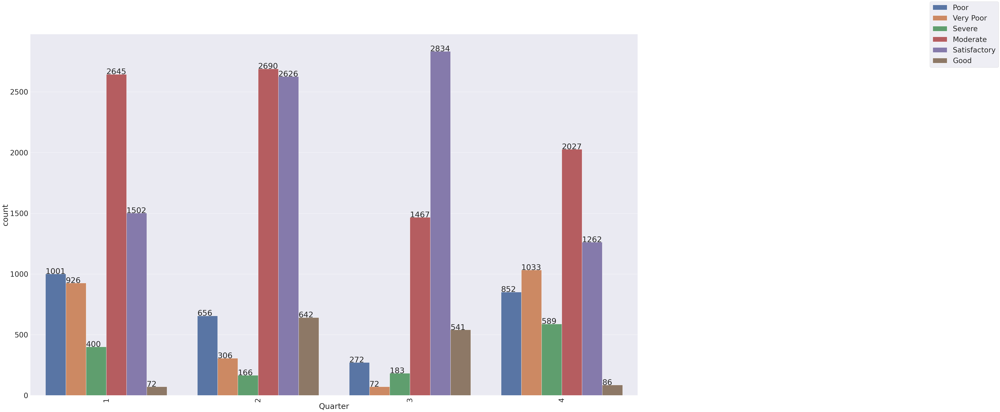

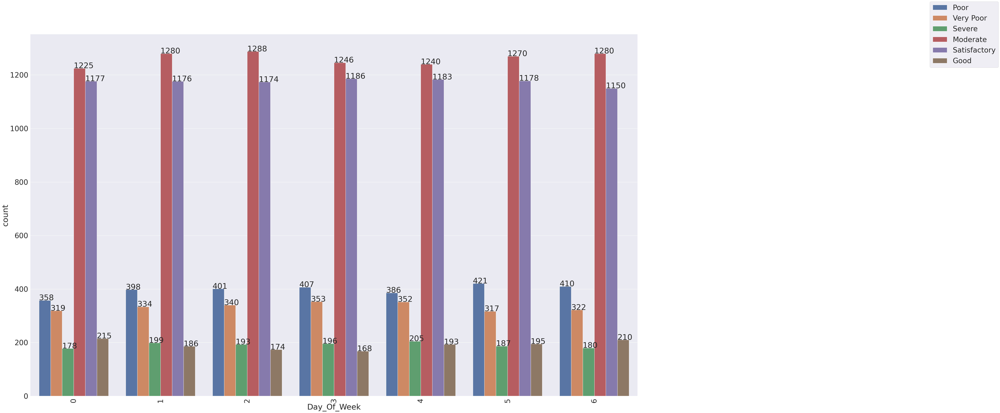

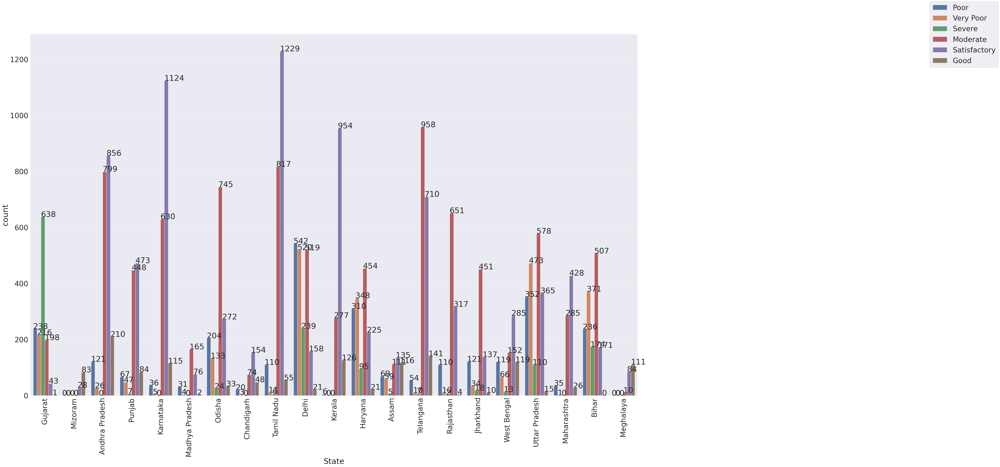

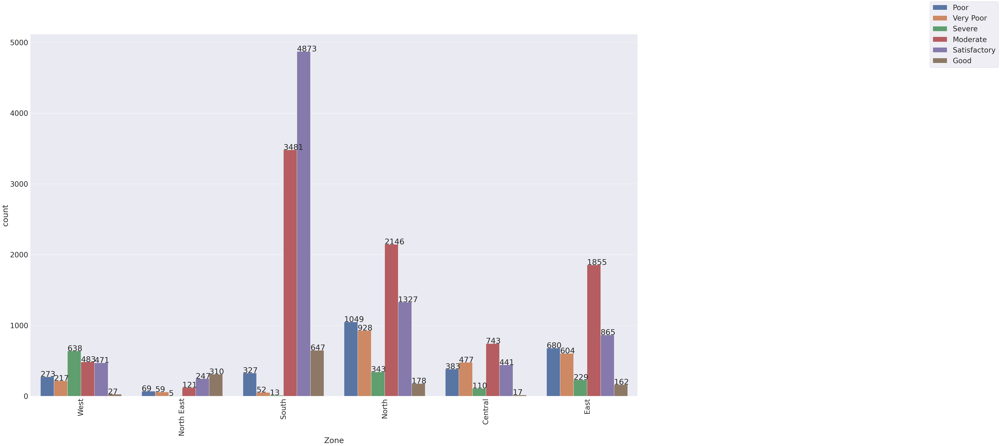

In [ ]:
cols=['City','Year','Month','Day','Quarter','Day_Of_Week','State','Zone']
for i in cols:
    plt.figure(figsize=(50,30))
    sns.set(font_scale=3)
    ax=sns.countplot(x=data[i],hue=data['AQI_Bucket'])
    for p in ax.patches:
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x(), p.get_height()))
    ax.legend(bbox_to_anchor=(1.6,1.1))
    plt.xticks(rotation=90)

In [ ]:
#Multivariate analysis

            PM2.5      PM10        NO       NO2       NOx       NH3        CO  \
PM2.5    1.000000  0.846498  0.433491  0.350709  0.436792  0.275086  0.089912   
PM10     0.846498  1.000000  0.502349  0.464380  0.527768  0.376816  0.112588   
NO       0.433491  0.502349  1.000000  0.478070  0.794890  0.185621  0.212607   
NO2      0.350709  0.464380  0.478070  1.000000  0.627627  0.234938  0.356521   
NOx      0.436792  0.527768  0.794890  0.627627  1.000000  0.166224  0.226992   
NH3      0.275086  0.376816  0.185621  0.234938  0.166224  1.000000  0.104891   
CO       0.089912  0.112588  0.212607  0.356521  0.226992  0.104891  1.000000   
SO2      0.132325  0.256974  0.170322  0.392233  0.238397 -0.038998  0.489697   
O3       0.161238  0.244919  0.014580  0.293349  0.093170  0.094972  0.041736   
Benzene  0.023911  0.022265  0.035771  0.025260  0.039121 -0.015650  0.061861   
Toluene  0.117080  0.169335  0.150857  0.273926  0.189386  0.013227  0.277904   
Xylene   0.114579  0.081700 

<Axes: >

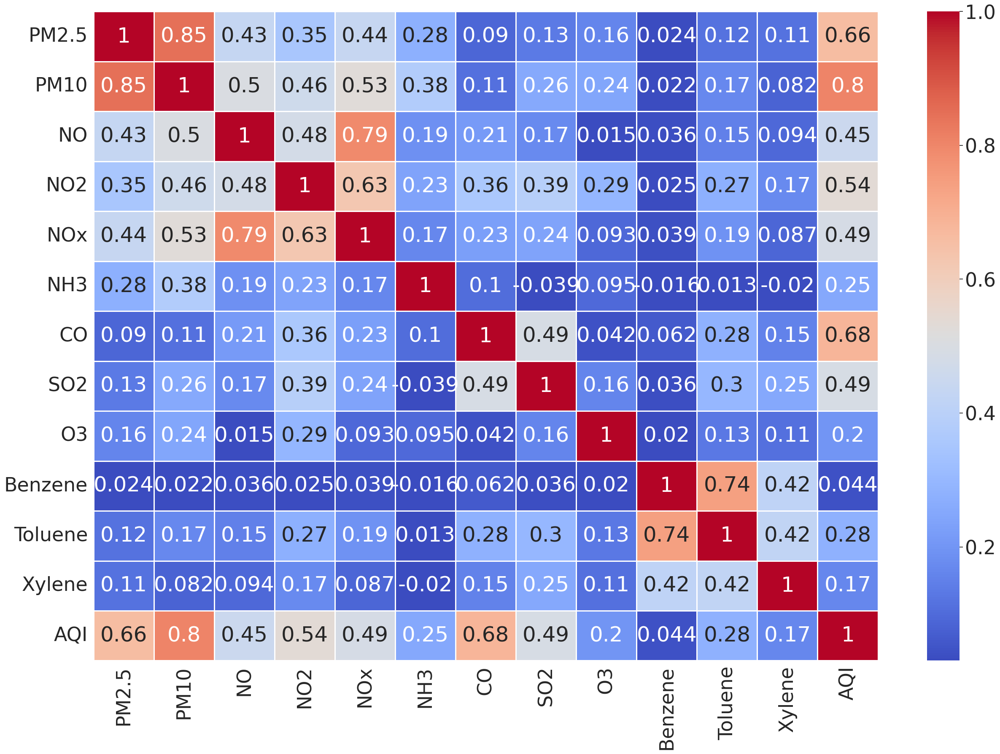

In [ ]:
cols=['PM2.5','PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3','Benzene','Toluene','Xylene','AQI']
corrmatrix=data[cols].corr()
print(corrmatrix)
plt.subplots(figsize=(30,20))
sns.heatmap(corrmatrix,annot=True,vmin=0.03,vmax=1,linewidth=2,cmap='coolwarm')

           Day      Year       AQI
Day   1.000000 -0.003348 -0.005582
Year -0.003348  1.000000 -0.192464
AQI  -0.005582 -0.192464  1.000000


<Axes: >

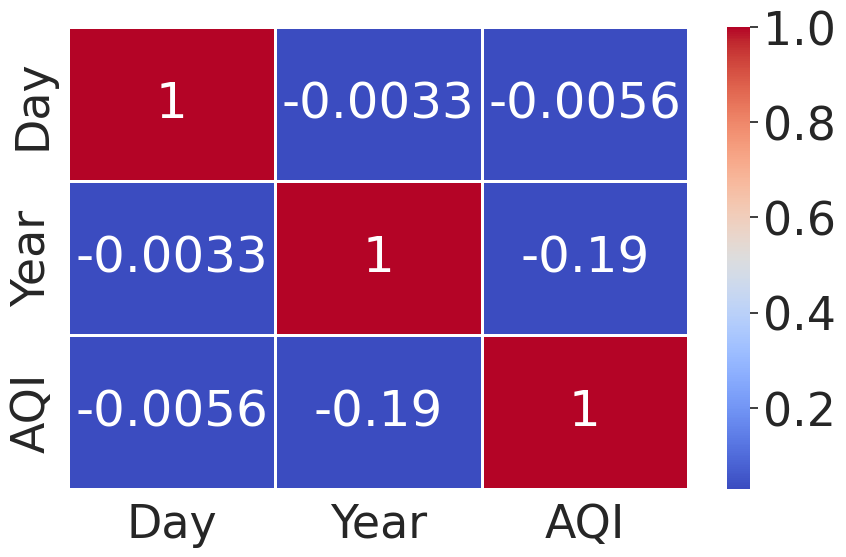

In [ ]:
cols=['Day','Year','AQI']
corrmatrix=data[cols].corr()
print(corrmatrix)
plt.subplots(figsize=(10,6))
sns.heatmap(corrmatrix,annot=True,vmin=0.03,vmax=1,linewidth=2,cmap='coolwarm')

**NULL VALUE HANDLING**

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest regressor instance
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Create an iterative imputer instance with the Random Forest regressor
imputer = IterativeImputer(random_state=42, estimator=rf)
data['PM2.5'] = imputer.fit_transform(data[['PM2.5']])
data['PM10'] = imputer.fit_transform(data[['PM10']])
data['NO'] = imputer.fit_transform(data[['NO']])
data['NO2'] = imputer.fit_transform(data[['NO2']])
data['NOx'] = imputer.fit_transform(data[['NOx']])
data['NH3'] = imputer.fit_transform(data[['NH3']])
data['CO'] = imputer.fit_transform(data[['CO']])
data['SO2'] = imputer.fit_transform(data[['SO2']])
data['O3'] = imputer.fit_transform(data[['O3']])
data['Benzene'] = imputer.fit_transform(data[['Benzene']])
data['Toluene'] = imputer.fit_transform(data[['Toluene']])
data['Xylene'] = imputer.fit_transform(data[['Xylene']])


In [ ]:
data.isnull().sum()

City              0
PM2.5             0
PM10              0
NO                0
NO2               0
NOx               0
NH3               0
CO                0
SO2               0
O3                0
Benzene           0
Toluene           0
Xylene            0
AQI            4681
AQI_Bucket     4681
Year              0
Month             0
Day               0
Quarter           0
Day_Of_Week       0
State             0
Zone              0
dtype: int64

**ENCODING**

In [ ]:
org_data=data.copy()
le=LabelEncoder()

data['City']=le.fit_transform(data['City'])
idx=~data['AQI_Bucket'].isna()
data.loc[idx,'AQI_Bucket']=le.fit_transform(data.loc[idx,'AQI_Bucket'])
#data['AQI_Bucket']=le.fit_transform(data~data['AQI_Bucket'].isnull())
data['State']=le.fit_transform(data['State'])
data['Zone']=le.fit_transform(data['Zone'])


In [ ]:
data.head()

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,...,Xylene,AQI,AQI_Bucket,Year,Month,Day,Quarter,Day_Of_Week,State,Zone
0,0,67.450578,118.127103,0.92,18.22,17.15,23.483476,0.92,27.64,133.36,...,0.00,NaN,NaN,2015,1,1,1,3,5,5
1,0,67.450578,118.127103,0.97,15.69,16.46,23.483476,0.97,24.55,34.06,...,3.77,NaN,NaN,2015,1,2,1,4,5,5
2,0,67.450578,118.127103,17.40,19.30,29.70,23.483476,17.40,29.07,30.70,...,2.25,NaN,NaN,2015,1,3,1,5,5,5
3,0,67.450578,118.127103,1.70,18.48,17.97,23.483476,1.70,18.59,36.08,...,1.00,NaN,NaN,2015,1,4,1,6,5,5
4,0,67.450578,118.127103,22.10,21.42,37.76,23.483476,22.10,39.33,39.31,...,2.78,NaN,NaN,2015,1,5,1,0,5,5


Outlier Detection

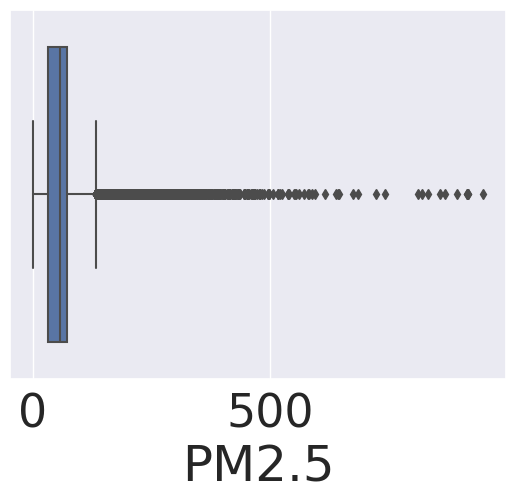

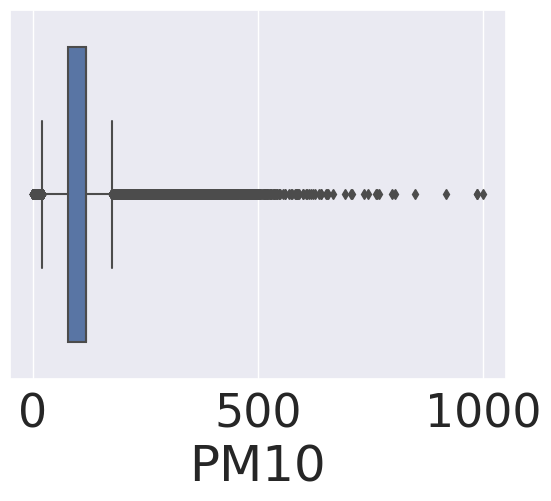

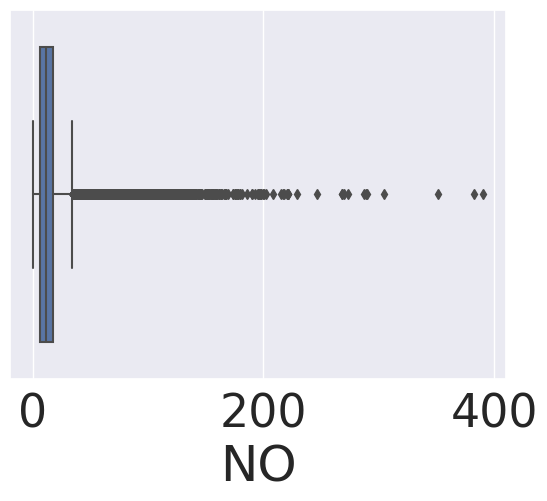

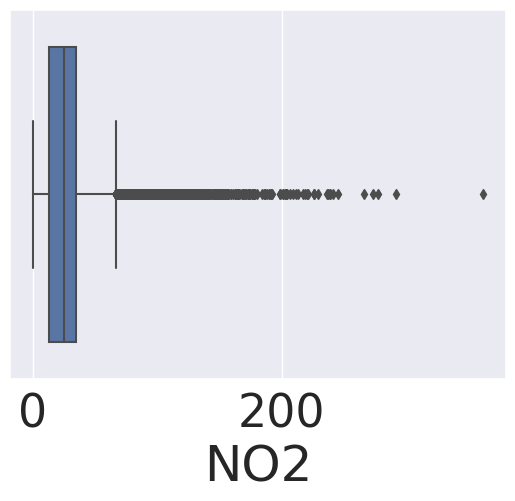

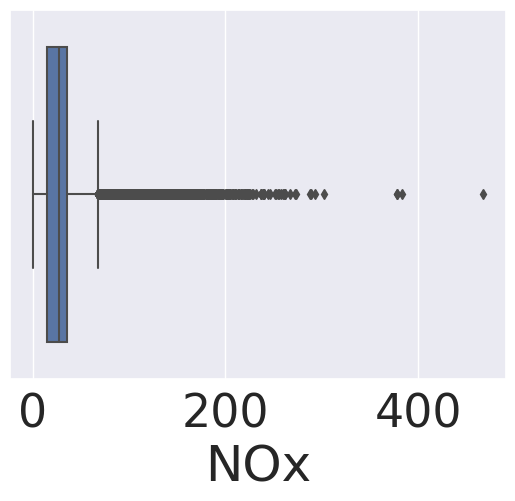

...

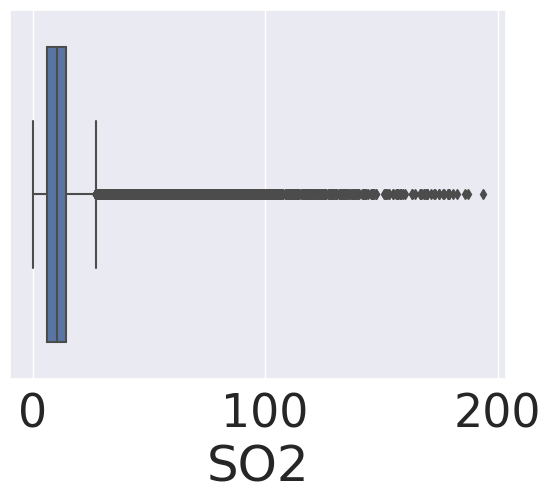

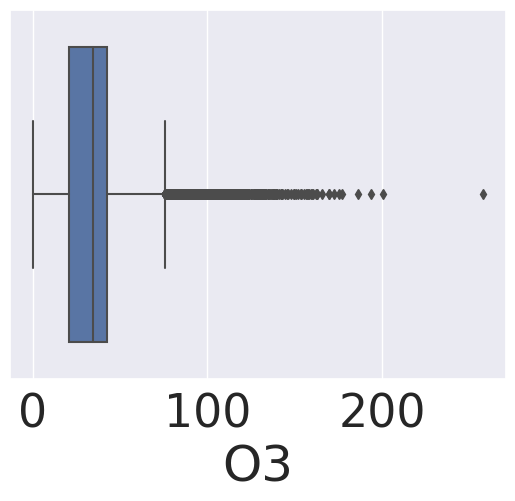

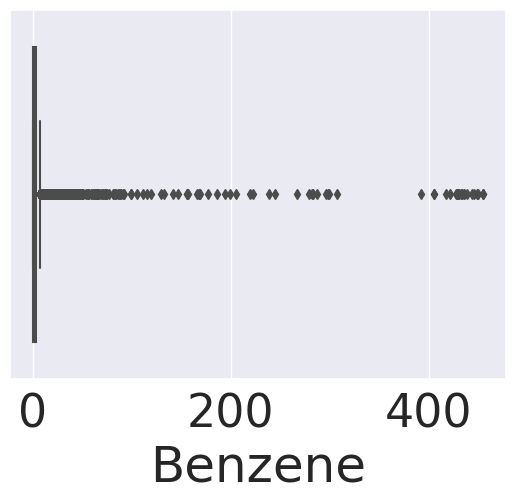

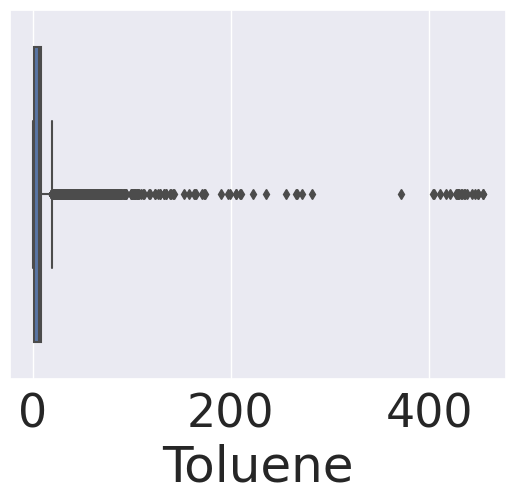

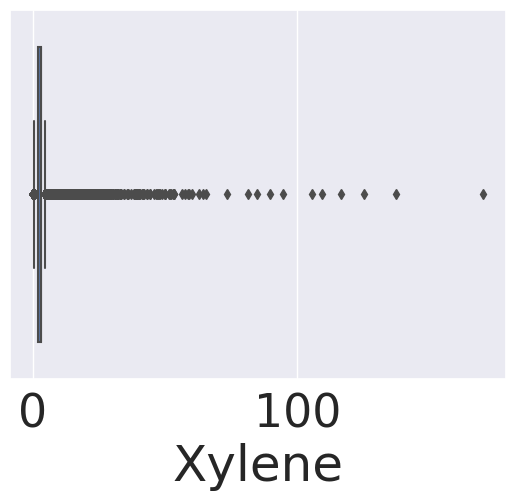

In [ ]:
for i in ['PM2.5','PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3','Benzene','Toluene','Xylene']:
    plt.figure()
    sns.boxplot(x =data[i])

### Treating Outliers

In [ ]:
#In this project, the approach to handling outliers involved utilizing machine learning algorithms that are inherently robust to outliers. Instead of applying specific outlier treatment methods, the selected machine learning algorithms, such as RandomForestRegressor, have built-in mechanisms to handle outliers effectively during the model training process.

#RandomForestRegressor, being an ensemble-based algorithm, combines multiple decision trees to make predictions. The ensemble nature of this algorithm helps mitigate the impact of outliers on individual decision trees, leading to more robust predictions.

#Ensemble algorithms like RandomForestRegressor are resistant to outliers because they rely on the collective decision-making of multiple trees rather than being overly influenced by individual data points. The averaging or voting mechanism used in ensembles helps in reducing the impact of outliers by considering a broader range of observations.

### Feature Reduction

<Axes: >

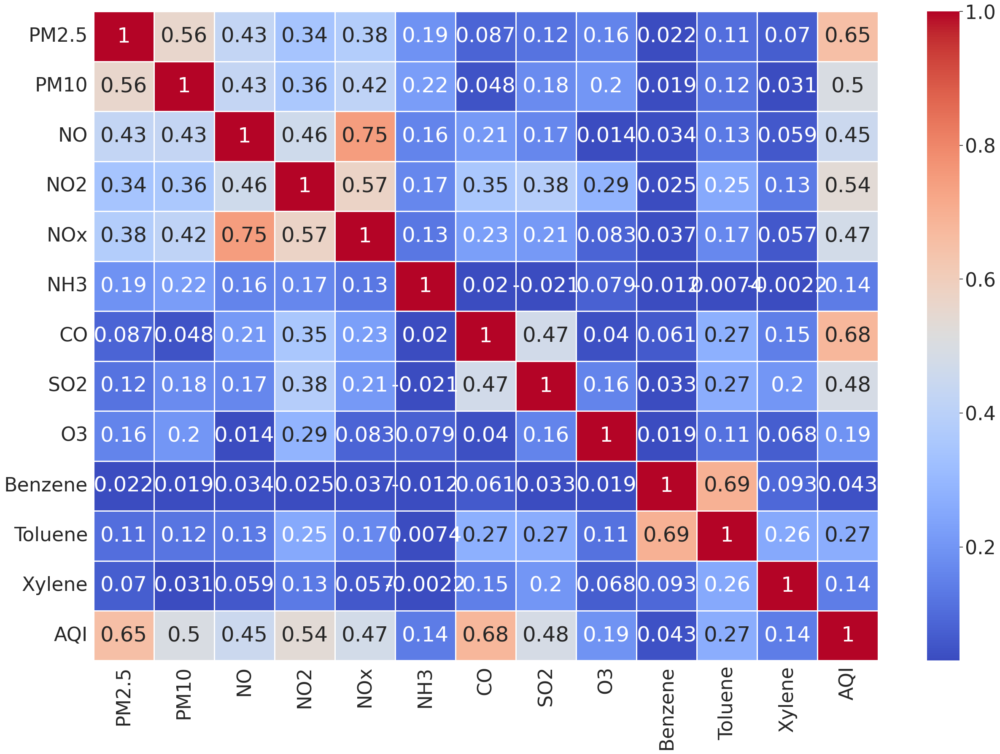

In [ ]:
cols=['PM2.5','PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3','Benzene','Toluene','Xylene','AQI']
corrmatrix=data[cols].corr()
plt.subplots(figsize=(30,20))
sns.heatmap(corrmatrix,annot=True,vmin=0.03,vmax=1,linewidth=2,cmap='coolwarm')

In [ ]:
data1= data.drop(['Xylene'],axis=1)

In [ ]:
data1.head()

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,...,Toluene,AQI,AQI_Bucket,Year,Month,Day,Quarter,Day_Of_Week,State,Zone
0,0,67.450578,118.127103,0.92,18.22,17.15,23.483476,0.92,27.64,133.36,...,0.02,NaN,NaN,2015,1,1,1,3,5,5
1,0,67.450578,118.127103,0.97,15.69,16.46,23.483476,0.97,24.55,34.06,...,5.50,NaN,NaN,2015,1,2,1,4,5,5
2,0,67.450578,118.127103,17.40,19.30,29.70,23.483476,17.40,29.07,30.70,...,16.40,NaN,NaN,2015,1,3,1,5,5,5
3,0,67.450578,118.127103,1.70,18.48,17.97,23.483476,1.70,18.59,36.08,...,10.14,NaN,NaN,2015,1,4,1,6,5,5
4,0,67.450578,118.127103,22.10,21.42,37.76,23.483476,22.10,39.33,39.31,...,18.89,NaN,NaN,2015,1,5,1,0,5,5


### Feature Scaling

### Normalization

In [ ]:
# import module
from sklearn.preprocessing import MinMaxScaler
data2=data1.filter(['PM2.5','PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3','Benzene','Toluene','AQI'])
# scale features
scaler = MinMaxScaler()
model=scaler.fit(data2)
normalized_data=model.transform(data2)


<ipython-input-47-991343b60bda>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data1,ax=ax[0])
<ipython-input-47-991343b60bda>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(normalized_data,ax=ax[1])


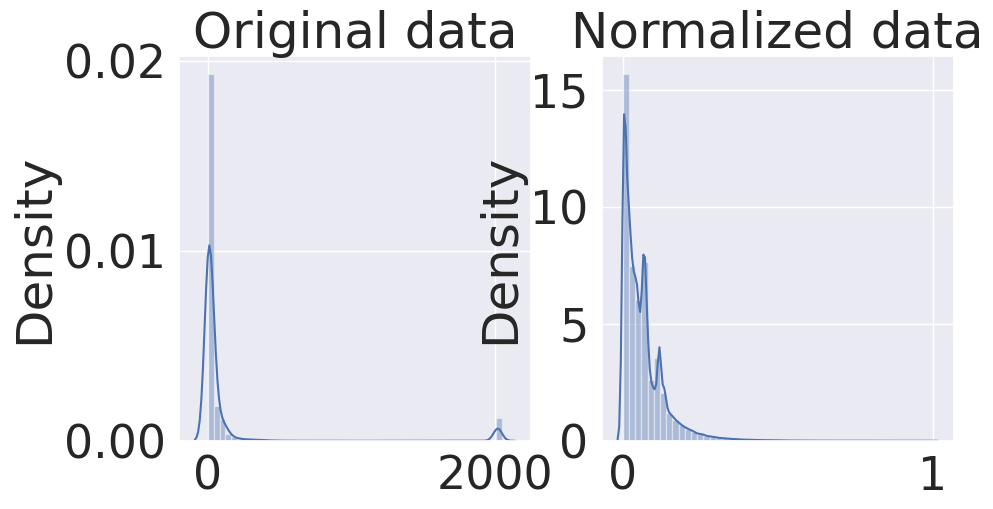

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,5))
sns.distplot(data1,ax=ax[0])
ax[0].set_title("Original data")
sns.distplot(normalized_data,ax=ax[1])
ax[1].set_title("Normalized data")
plt.show()

### MODEL CREATION

In [ ]:
from sklearn.model_selection import train_test_split

# Separate rows with null target values into a separate dataframe
validation_data = data2[data2['AQI'].isnull()]
x_val = validation_data.drop(['AQI'],axis=1)

# Separate rows with non-null target values into a training/testing dataframe
train_test_data = data2[~data2['AQI'].isnull()]

#Independent and dependent variables
x = train_test_data.drop(['AQI'], axis=1)
y = train_test_data['AQI']

#Train Test data
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=.25,random_state=42)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf_rgr=RandomForestRegressor(n_estimators=100,random_state=42)
rf_rgr.fit(x_train,y_train)
y_pred_rf=rf_rgr.predict(x_test)

In [ ]:
from sklearn.metrics import mean_squared_error
print('MSE = ',mean_squared_error(y_test,y_pred_rf))


from sklearn.metrics import r2_score
print('r2 score = ',r2_score(y_test,y_pred_rf))

MSE =  1665.9451607645558
r2 score =  0.9099871716470446


In [ ]:
#Validation Set:
from sklearn.ensemble import RandomForestRegressor
rf_rgr=RandomForestRegressor(n_estimators=100,random_state=42)
rf_rgr.fit(x_train,y_train)

y_val_pred_rf=rf_rgr.predict(x_val)

In [ ]:
data1.loc[data1['AQI'].isna(),'AQI']=y_val_pred_rf

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
ada_rgr=AdaBoostRegressor(n_estimators=10,random_state=0)
ada_rgr.fit(x_train,y_train)

y_pred_ada=ada_rgr.predict(x_test)


In [ ]:
from sklearn.metrics import mean_squared_error
print('MSE = ',mean_squared_error(y_test,y_pred_ada))


from sklearn.metrics import r2_score
print('r2 score = ',r2_score(y_test,y_pred_ada))

MSE =  3467.682229372788
r2 score =  0.8126373588720788


In [ ]:
import xgboost as xgb

xg_rgr=xgb.XGBRegressor(n_estimators=100,random_state=0)
xg_rgr.fit(x_train,y_train)

y_pred_xg=xg_rgr.predict(x_test)

In [ ]:
from sklearn.metrics import mean_squared_error
print('MSE = ',mean_squared_error(y_test,y_pred_xg))


from sklearn.metrics import r2_score
print('r2 score = ',r2_score(y_test,y_pred_xg))

MSE =  1915.2401227482142
r2 score =  0.896517493802431


In [ ]:
from sklearn.tree import DecisionTreeRegressor
dt_rgr = DecisionTreeRegressor(random_state=0)
dt_rgr.fit(x_train,y_train)

y_pred_dt=dt_rgr.predict(x_test)

In [ ]:
from sklearn.metrics import mean_squared_error
print('MSE = ',mean_squared_error(y_test,y_pred_dt))


from sklearn.metrics import r2_score
print('r2 score = ',r2_score(y_test,y_pred_dt))

MSE =  3705.5347103151853
r2 score =  0.7997859307190853


HYPERPARAMETER TUNING

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, make_scorer
from scipy.stats import randint

# Create a Random Forest Regressor
rf_regressor = RandomForestRegressor()

# Define the parameter grid to search over
param_grid = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(5, 50),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10)
}

# Define the scoring metric (e.g., mean squared error)
scoring = make_scorer(mean_squared_error)

# Perform randomized search over the parameter grid
random_search = RandomizedSearchCV(
    estimator=rf_regressor,
    param_distributions=param_grid,
    n_iter=10,  # Number of parameter settings that are sampled
    scoring=scoring,
    cv=5,  # Number of cross-validation folds
    random_state=42
)

# Fit the training data to the RandomizedSearchCV object
random_search.fit(x_train, y_train)

# Print the best hyperparameters found
print("Best hyperparameters: ", random_search.best_params_)

# Obtain the best model
best_model = random_search.best_estimator_

# Evaluate the model on test data
y_pred = best_model.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error: ", mse)

Best hyperparameters:  {'max_depth': 7, 'min_samples_leaf': 5, 'min_samples_split': 8, 'n_estimators': 120}
Mean Squared Error:  1991.9184617656772


In [ ]:
model_random = RandomForestRegressor(max_depth= 7,
                                     min_samples_leaf= 5, 
                                     min_samples_split=8,
                                     n_estimators= 120)
model_random.fit(x_train, y_train)
y_pred_1 = model_random.predict(x_test)
#print(classification_report(y_pred, y_test))
print('r2 score = ',r2_score(y_test,y_pred_1))

r2 score =  0.891675069748844
